# This Jupyter notebook does a chained fit of 2-point and 3-point 

In [2]:
import numpy as np
import pandas as pd
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

In [3]:
import gvar as gv
import h5py
import lsqfit
import h5data_methods as h5_dm

In [4]:
import pickle

In [5]:
# Constants

#Physical constants
hbarc = 197.3 # MeV fm
a = 0.12

# Pion mass
mpi = 0.1885
#mpi = 0.2

# Plot constants
t_min_plt = 1
t_max_plt = 25

# Array of tsep values
tsep_vals = np.arange(3,13,1)
tsep_vals

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [6]:
def Ei(n_selec, p):
    Ea = p['E0']
    for l in range(1, n_selec+1):
        Ea += p['dE{}'.format(l)]
        
    #print(Ea)
    return Ea

In [7]:
data = {}
data['2pt'] = h5_dm.get_2pt("a12m310_a_avg.h5")
data['2pt_SS'] = data['2pt'][:,:,0]
data['2pt_PS'] = data['2pt'][:,:,1]
data['3pt_A3_unsymm'] = h5_dm.get_3pt("a12m310_a_avg.h5", "A3", 3, 13)
data['3pt_V4_unsymm'] = h5_dm.get_3pt("a12m310_a_avg.h5", "V4", 3, 13)
data['FH_N_A3'] = h5_dm.get_FH("a12m310_a_fh.h5", "gA")
data['FH_N_V4'] = h5_dm.get_FH("a12m310_a_fh.h5", "gV")
data['FH_N'] = h5_dm.get_FH("a12m310_a_fh.h5", "all")

In [8]:
gv_avg_data = gv.BufferDict()
gv_avg_data = gv.dataset.avg_data(data)

# Symmetrize the 3-point data
gv_avg_data['3pt_A3'] = np.array([ [ (gv_avg_data['3pt_A3_unsymm'][i][j] + gv_avg_data['3pt_A3_unsymm'][i][i + tsep_vals[0] - j])/2. for j in range(len(gv_avg_data['3pt_A3_unsymm'][i]))] for i in range(len(gv_avg_data['3pt_A3_unsymm']))]) 
gv_avg_data['3pt_V4'] = np.array([ [ (gv_avg_data['3pt_V4_unsymm'][i][j] + gv_avg_data['3pt_V4_unsymm'][i][i + tsep_vals[0] - j])/2. for j in range(len(gv_avg_data['3pt_V4_unsymm'][i]))] for i in range(len(gv_avg_data['3pt_V4_unsymm']))])

# Calculate the ratio between 3-point and 2-point data, for both A3 and V4
gv_avg_data['C_ratio_A3'] = np.array([ [gv_avg_data['3pt_A3'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
gv_avg_data['Csum_A3'] = np.array([np.sum(gv_avg_data['3pt_A3'][i][1:i+3]) for i in range(len(tsep_vals))])
gv_avg_data['C^FH_A3'] = np.array([ (gv_avg_data['Csum_A3'][i + 1]/gv_avg_data['2pt_SS'][i + tsep_vals[0] + 1]) - (gv_avg_data['Csum_A3'][i]/gv_avg_data['2pt_SS'][i + tsep_vals[0]]) for i in range(len(tsep_vals)-1)])

gv_avg_data['C_ratio_V4'] = np.array([ [gv_avg_data['3pt_V4'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
gv_avg_data['Csum_V4'] = np.array([np.sum(gv_avg_data['3pt_V4'][i][1:i+3]) for i in range(len(tsep_vals))])
gv_avg_data['C^FH_V4'] = np.array([ (gv_avg_data['Csum_V4'][i + 1]/gv_avg_data['2pt_SS'][i + tsep_vals[0] + 1]) - (gv_avg_data['Csum_V4'][i]/gv_avg_data['2pt_SS'][i + tsep_vals[0]]) for i in range(len(tsep_vals)-1)])

# The A3 and V4 3-point and sum-subtracted samples are combined into arrays of (A3, V4) pairs 
gv_avg_data['3pt_combined'] = np.array([ [ [gv_avg_data['3pt_A3'][i][j], gv_avg_data['3pt_V4'][i][j]] for j in range(len(gv_avg_data['3pt_A3'][i]))] for i in range(len(gv_avg_data['3pt_A3']))])
gv_avg_data['C^FH_combined'] = np.transpose(np.append([gv_avg_data['C^FH_A3'],], [gv_avg_data['C^FH_V4'],], axis = 0))

gv_avg_data['2pt_meff'] = np.log(np.array([gv_avg_data['2pt'][j,:]/gv_avg_data['2pt'][j+1,:] for j in range(63)]))
gv_avg_data['2pt_SS_meff'] = np.log(np.array([gv_avg_data['2pt_SS'][j]/gv_avg_data['2pt_SS'][j+1] for j in range(63)]))
gv_avg_data['2pt_PS_meff'] = np.log(np.array([gv_avg_data['2pt_PS'][j]/gv_avg_data['2pt_PS'][j+1] for j in range(63)]))

gv_avg_data['2pt_zSeff'] = np.array([np.sqrt(np.exp(gv_avg_data['2pt_SS_meff'][t]*t)*gv_avg_data['2pt_SS'][t]) for t in range(63)])
gv_avg_data['2pt_zPeff'] = np.array([np.exp(gv_avg_data['2pt_PS_meff'][t]*t)*gv_avg_data['2pt_PS'][t]/gv_avg_data['2pt_zSeff'][t] for t in range(63)])


# Sum-subtract the Feynman-Hellman raw data to get a FH dataset
gv_avg_data['2pt_D'] = np.transpose(np.array([gv_avg_data['2pt_SS'], gv_avg_data['2pt_PS'], gv_avg_data['2pt_SS'], gv_avg_data['2pt_PS']]))
gv_avg_data['FH'] = np.roll(gv_avg_data['FH_N']/gv_avg_data['2pt_D'], -1, axis = 0) - gv_avg_data['FH_N']/gv_avg_data['2pt_D']


<ipython-input-8-d3c020a9eefb>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  gv_avg_data['C_ratio_A3'] = np.array([ [gv_avg_data['3pt_A3'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
<ipython-input-8-d3c020a9eefb>:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  gv_avg_data['C_ratio_V4'] = np.array([ [gv_avg_data['3pt_V4'][i][j]/gv_avg_data['2pt_SS'][i+tsep_vals[0]] for j in range(1, i+3)] for i in range(len(tsep_vals))])
<ipython-input-8-d3c020a9eefb>:21: RuntimeWarning: invalid value encoun

### Define functions

In [9]:
def param_FH(p):
    sub_p = gv.BufferDict()
    sub_p['E0'] = p['E0']
    sub_p['Z0'] = p['Z0']
    
    for k in range(1, num_states_FH - 1):
        sub_p['Z{}'.format(k)] = p['Z{}'.format(k)]
        sub_p['log(dE{})'.format(k)] = p['log(dE{})'.format(k)]
        
    sub_p['Z{}'.format(num_states_FH - 1)] = p['Z_FHmax']
    sub_p['log(dE{})'.format(num_states_FH - 1)] = p['log(FH_dEmax)']
    
    for n in range(num_states_FH-1):
        for m in range(num_states_FH-1):
            if n >= m:
                sub_p['gA3_{0}{1}'.format(n, m)] = p['gA3_{0}{1}'.format(n, m)]
                sub_p['gV4_{0}{1}'.format(n, m)] = p['gV4_{0}{1}'.format(n, m)]
            
    for n in range(num_states_FH-1):
        #sub_p['gA3_{0}{1}'.format(n, num_states_FH-1)] = p['gA3_{}FHmax'.format(n)]
        sub_p['gA3_{0}{1}'.format(num_states_FH-1, n)] = p['gA3_FHmax{}'.format(n)]
        #sub_p['gV4_{0}{1}'.format(n, num_states_FH-1)] = p['gV4_{}FHmax'.format(n)]
        sub_p['gV4_{0}{1}'.format(num_states_FH-1, n)] = p['gV4_FHmax{}'.format(n)]
        
    sub_p['gA3_{0}{1}'.format(num_states_FH-1, num_states_FH-1)] = p['gA3_FHmaxFHmax']
    sub_p['gV4_{0}{1}'.format(num_states_FH-1, num_states_FH-1)] = p['gV4_FHmaxFHmax']
    
    return sub_p

def param_FHdata(p):
    sub_p = gv.BufferDict()
    sub_p['E0'] = p['E0']
    sub_p['Z0'] = p['Z0']
    sub_p['Ztilde0'] = p['Ztilde0']
    
    for k in range(1, num_states_FH - 1):
        sub_p['Z{}'.format(k)] = p['Z{}'.format(k)]
        sub_p['Ztilde{}'.format(k)] = p['Ztilde{}'.format(k)]
        sub_p['log(dE{})'.format(k)] = p['log(dE{})'.format(k)]
        
    sub_p['Z{}'.format(num_states_FH - 1)] = p['Z_FHmax']
    sub_p['Ztilde{}'.format(num_states_FH - 1)] = p['Ztilde_FHmax']
    sub_p['log(dE{})'.format(num_states_FH - 1)] = p['log(FH_dEmax)']
    
    for n in range(num_states_FH-1):
        for m in range(num_states_FH-1):
            if n >= m:    
                sub_p['gA3_{0}{1}'.format(n, m)] = p['gA3_{0}{1}'.format(n, m)]
                sub_p['gV4_{0}{1}'.format(n, m)] = p['gV4_{0}{1}'.format(n, m)]
            
    for n in range(num_states_FH-1):
        #sub_p['gA3_{0}{1}'.format(n, num_states_FH-1)] = p['gA3_{}FHmax'.format(n)]
        sub_p['gA3_{0}{1}'.format(num_states_FH-1, n)] = p['gA3_FHmax{}'.format(n)]
        #sub_p['gV4_{0}{1}'.format(n, num_states_FH-1)] = p['gV4_{}FHmax'.format(n)]
        sub_p['gV4_{0}{1}'.format(num_states_FH-1, n)] = p['gV4_FHmax{}'.format(n)]
        
    sub_p['gA3_{0}{1}'.format(num_states_FH-1, num_states_FH-1)] = p['gA3_FHmaxFHmax']
    sub_p['gV4_{0}{1}'.format(num_states_FH-1, num_states_FH-1)] = p['gV4_FHmaxFHmax']
    
    for n in range(num_states_FH):
        sub_p['d_gA_ss_{}'.format(n)] = p['d_gA_ss_{}'.format(n)]
        sub_p['d_gA_ps_{}'.format(n)] = p['d_gA_ps_{}'.format(n)]
        sub_p['d_gV_ss_{}'.format(n)] = p['d_gV_ss_{}'.format(n)]
        sub_p['d_gV_ps_{}'.format(n)] = p['d_gV_ps_{}'.format(n)]
    
    return sub_p

In [10]:
num_zs = 1 #Order number of the n's
# Log E: log of the energy.  
# P is point (in the context of )

def C_2pt(t, p):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_pp = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.transpose(np.array([[sum_pp], [sum_ps]]), axes=[2,0,1])

def C_2pt_SS(t, p):
    
    z = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_ss = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.array(sum_ss)

def C_2pt_PS(t, p):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    #print("z: ", z)
    #print("ztilde: ", ztilde)
    
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.array(sum_ps)

In [11]:
# Precondition: t is a 1-D numpy array of 2-element array like objects t[i] = (t_sep, tau)
  
    
def C_3pt_A3(t, p):
    #tsep = np.array([np.array([t[i][j][0] for j in range(len(t[i]))]) for i in range(len(t))])
    #tau = np.array([np.array([t[i][j][1] for j in range(len(t[i]))]) for i in range(len(t))])
    tsep, tau = np.transpose(t)
    #print("tsep: ", tsep)
    #print("tau: ", tau)
    
    result = p['Z0']*p['gA3_00']*p['Z0']*np.exp(-p["E0"]*tsep)*np.exp(-(p["E0"] - p["E0"])*tau)
    
    n = 0
    m = 0
    
    if num_zs == 1:
        return result
    
    m += 1
    while n < num_zs:    
        En = Ei(n, p)
        Em = Ei(m, p) 
        #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        if m > n:
            result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        else:
            result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
            
        m += 1
        if m >= num_zs:
            m = 0
            n += 1
            
    #for n in range(num_zs):
        #for m in range(num_zs):
            #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-p["E{}".format(n)]*tsep)*np.exp(-(p["E{}".format(m)] - p["E{}".format(n)])*tau)
            # print out the dictionary indices which are called in this summation
            #print("n = ", n, "; m = ", m)
            #print('Z{}'.format(n), "*", 'gA3_{0}{1}'.format(n, m), "*", 'Z{}'.format(m), "*e^(-tsep*", "E{}".format(n), ")*e^(-tau*(", "E{}".format(m), "-", "E{}".format(n), ")")
            
    return result



def C_3pt_V4(t, p):
    #tsep = np.array([np.array([t[i][j][0] for j in range(len(t[i]))]) for i in range(len(t))])
    #tau = np.array([np.array([t[i][j][1] for j in range(len(t[i]))]) for i in range(len(t))])
    tsep, tau = np.transpose(t)
    #print("tsep: ", tsep)
    #print("tau: ", tau)
    
    result = p['Z0']*p['gV4_00']*p['Z0']*np.exp(-p["E0"]*tsep)*np.exp(-(p["E0"] - p["E0"])*tau)
    
    n = 0
    m = 0
    if num_zs == 1:
        return result
    
    m += 1
    while n < num_zs:
        En = Ei(n, p)
        Em = Ei(m, p)
        #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        if m > n:
            result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
        else:
            result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-En*tsep)*np.exp(-(Em - En)*tau)
            
        m += 1
        if m >= num_zs:
            m = 0
            n += 1
    
    
    #for n in range(num_zs):
        #for m in range(num_zs):
            #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*np.exp(-p["E{}".format(n)]*tsep)*np.exp(-(p["E{}".format(m)] - p["E{}".format(n)])*tau)
            # print out the dictionary indices which are called in this summation
            #print("n = ", n, "; m = ", m)
            #print('Z{}'.format(n), "*", 'gV4_{0}{1}'.format(n, m), "*", 'Z{}'.format(m), "*e^(-tsep*", "E{}".format(n), ")*e^(-tau*(", "E{}".format(m), "-", "E{}".format(n), ")")
            
    return result

def C_3pt(t, p):
    A3 = C_3pt_A3(t, p)
    V4 = C_3pt_V4(t, p)
    
    return np.transpose(np.array([[A3], [V4]]), axes=[2,0,1])

In [12]:
num_states_FH = 1 # The number of states that the Feynman-Hellman and sum-subtraction needs

def C_2pt_SS_aux(t, p, n_local):
    
    z = np.array([])
    E = np.array([])
    for i in range(n_local):
        z = np.append(z, p['Z{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_ss = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(n_local)])
    
    return np.array(sum_ss)

def C_2pt_PS_aux(t, p, n_local):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(n_local):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
    
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(n_local)])
    
    return np.array(sum_ps)

def Csum_A3(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += (t - 1) * p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, n)]*p['Z{}'.format(n)]*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                if m > n:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def Csum_V4(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += (t - 1) * p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, n)]*p['Z{}'.format(n)]*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                if m > n:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def C_FH_A3(t, p):
    
    return (Csum_A3(t + 1, param_FH(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FH(p), num_states_FH)) - (Csum_A3(t, param_FH(p), num_states_FH)/C_2pt_SS_aux(t, param_FH(p), num_states_FH))


def C_FH_V4(t, p):
    
    return (Csum_V4(t + 1, param_FH(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FH(p), num_states_FH)) - (Csum_V4(t, param_FH(p), num_states_FH)/C_2pt_SS_aux(t, param_FH(p), num_states_FH))


def C_FH(t, p):
    return np.transpose(np.array([C_FH_A3(t, p), C_FH_V4(t, p)])) #, axes=[2,0,1]

In [13]:
#num_states_FHdata = 1
# Create new functions to fit the new Feynman-Hellman dataset to 
def Csum_A3_FHdata_ss(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, n)]*p['Z{}'.format(n)] + p['d_gA_ss_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def Csum_A3_FHdata_ps(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, n)]*p['Ztilde{}'.format(n)] + p['d_gA_ps_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(m, n)]*p['Ztilde{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gA3_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                
    return result

def Csum_V4_FHdata_ss(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, n)]*p['Z{}'.format(n)] + p['d_gV_ss_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Z{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Z{}'.format(m)]*mn_ratio
                
    return result

def Csum_V4_FHdata_ps(t, p, n_local):
    result = 0
    for n in range(n_local):
        En = Ei(n, p)
        result += ((t - 1) * p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, n)]*p['Ztilde{}'.format(n)] + p['d_gV_ps_{}'.format(n)])*np.exp(-En*t)
        for m in range(n_local):
            if n == m:
                continue
            else:
                Em = Ei(m, p)
                e_Delta_nm = np.exp((En - Em)/2.)
                e_Delta_mn = np.exp((Em - En)/2.)
                
                mn_ratio = (e_Delta_nm*np.exp(-En*t) - e_Delta_mn*np.exp(-Em*t))/(e_Delta_mn - e_Delta_nm)
                
                #result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                if m > n:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(m, n)]*p['Ztilde{}'.format(m)]*mn_ratio
                else:
                    result += p['Z{}'.format(n)]*p['gV4_{0}{1}'.format(n, m)]*p['Ztilde{}'.format(m)]*mn_ratio
                
    return result


def C_FHdata_A3_ss(t, p):
    if(num_zs == num_states_FH):
        return (Csum_A3_FHdata_ss(t + 1, p, num_states_FH)/C_2pt_SS_aux(t + 1, p, num_states_FH)) - (Csum_A3_FHdata_ss(t, p, num_states_FH)/C_2pt_SS_aux(t, p, num_states_FH))

    else:
        return (Csum_A3_FHdata_ss(t + 1, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_A3_FHdata_ss(t, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t, param_FHdata(p), num_states_FH))

def C_FHdata_A3_ps(t, p):
    if(num_zs == num_states_FH):
        return (Csum_A3_FHdata_ps(t + 1, p, num_states_FH)/C_2pt_PS_aux(t + 1, p, num_states_FH)) - (Csum_A3_FHdata_ps(t, p, num_states_FH)/C_2pt_PS_aux(t, p, num_states_FH))

    else:
        return (Csum_A3_FHdata_ps(t + 1, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_A3_FHdata_ps(t, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t, param_FHdata(p), num_states_FH))


def C_FHdata_V4_ss(t, p):  
    if(num_zs == num_states_FH):
        return (Csum_V4_FHdata_ss(t + 1, p, num_states_FH)/C_2pt_SS_aux(t + 1, p, num_states_FH)) - (Csum_V4_FHdata_ss(t, p, num_states_FH)/C_2pt_SS_aux(t, p, num_states_FH))

    else:
        return (Csum_V4_FHdata_ss(t + 1, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_V4_FHdata_ss(t, param_FHdata(p), num_states_FH)/C_2pt_SS_aux(t, param_FHdata(p), num_states_FH))

def C_FHdata_V4_ps(t, p):
    if(num_zs == num_states_FH):
        return (Csum_V4_FHdata_ps(t + 1, p, num_states_FH)/C_2pt_PS_aux(t + 1, p, num_states_FH)) - (Csum_V4_FHdata_ps(t, p, num_states_FH)/C_2pt_PS_aux(t, p, num_states_FH))

    else:
        return (Csum_V4_FHdata_ps(t + 1, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t + 1, param_FHdata(p), num_states_FH)) - (Csum_V4_FHdata_ps(t, param_FHdata(p), num_states_FH)/C_2pt_PS_aux(t, param_FHdata(p), num_states_FH))



def C_FHdata(t, p):
    return np.transpose(np.array([C_FHdata_A3_ss(t, p), C_FHdata_A3_ps(t, p), C_FHdata_V4_ss(t, p), C_FHdata_V4_ps(t, p)])) #,

In [14]:
# Gets a single 2-element, passes it to C_2pt if it's of the form [None, tau], C_3pt if it's of the form [tsep, tau], C_FH if it's of the form [tsep, None]
def single_choice(t_sel, p):
    if t_sel[0] is None:
        return C_2pt(np.array([t_sel[1]]), p)
    
    else:
        if t_sel[1] is None:
            FH_t_sel_res = C_FH(np.array([t_sel[0]]), p)
            return np.array([[[FH_t_sel_res[0][0]], [FH_t_sel_res[0][1]]]])
        
        else:
            return np.array([C_3pt(np.array([[t_sel[0], t_sel[1]]]), p)])[0]
        
def all_at_once(t, p):
    
    #if np.shape(t) == (2,):
        #return single_choice(t, p)
    
    #else:
        #for t_sel in t:
            #print("Shape of t_sel: ", np.shape(t_sel))
    return [single_choice(t_sel, p)[0] for t_sel in t]
    #t_2pt = t[0]
    #t_3pt = t[1]
    #t_CFH = t[2]
    #return np.array([C_2pt_SS(t_2pt, p), C_2pt_PS(t_2pt, p), C_3pt_A3(t_3pt, p), C_3pt_V4(t_3pt, p), C_FH_A3(t_CFH, p), C_FH_V4(t_CFH, p)]) #np.transpose(
    
# Like all_at_once, but uses dictionaries
def all_at_once_dict(t, p):
    out = gv.BufferDict()
    if '2pt' in t.keys():
        out['2pt'] = C_2pt(t['2pt'], p)
    if '3pt' in t.keys():
        out['3pt'] = C_3pt(t['3pt'], p)
    if 'sum_sub' in t.keys():
        out['C^FH_combined'] = C_FH(t['sum_sub'], p)
    if 'FH' in t.keys():
        out['FH'] = C_FHdata(t['FH'], p)
    
    return out

In [15]:
# In order to be able to work with our 2-d array based functions, we need a way to convert from 2-d array to 1-d arrays and from 1-d arrays to 2-d arrays
# For the independent (time) variable, I'd just set up a 2-d array and a 1-d array with all the data I need
# For the dependent (correlation function) variable, I'd use the time variable arrays to call the correct indices to assign the variables in the conversion
t_2d_array = np.array([np.array([(i+3, j) for j in range(1, i+tsep_vals[0])]) for i in range(len(tsep_vals))])

num_elements = np.sum(np.array([i+tsep_vals[0]-1 for i in range(len(tsep_vals))]))
tsep_t = np.zeros(num_elements)
tau_t = np.zeros(num_elements)

k = 0
for i in range(len(tsep_vals)):
    for j in range(1, i+tsep_vals[0]):
        tsep_t[k] = i + tsep_vals[0]
        tau_t[k] = j
        #print("k = ", k, " tsep = ", tsep_t[k], " tau = ", tau_t[k])
        k += 1

        
t_1d_array = np.transpose(np.array([tsep_t, tau_t])) 

#print(t_2d_array)
#print(t_1d_array)

# Universal precondition for the below functions: x_1d, x_2d, y_1d, and y_2d, in the end, must have the 
# same number of elements. Also, x_1d and y_1d have to have the same dimensions, as must x_2d and y_2d
def convert_1dto2d(x_1d, x_2d, y_1d):
    y_2d = np.array([np.array([None for j in range(len(x_2d[i]))]) for i in range(len(x_2d))])
    i = 0
    j = 0
    for k in range(len(x_1d)):
        y_2d[i][j] = y_1d[k]
        j += 1
        if j >= len(x_2d[i]):
            i +=1
            j = 0
            
    return y_2d

def convert_2dto1d(x_1d, x_2d, y_2d):
    y_1d = np.array([None for k in range(len(x_1d))])
    k = 0
    for i in range(len(x_2d)):
        for j in range(len(x_2d[i])):
            y_1d[k] = y_2d[i][j]
            k += 1
    
    return y_1d
    

<ipython-input-15-b534f43d753d>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  t_2d_array = np.array([np.array([(i+3, j) for j in range(1, i+tsep_vals[0])]) for i in range(len(tsep_vals))])


In [64]:
# Now try chain-fitting 2pt and 3-point
num_zs = 3
num_states_FH = 2

# prior the fits
tp = gv.BufferDict()

# This is the exponent e_decay_exp such that the increment between two consecutive excited state energies decays as 1/n^e_decay_exp, where n is the order of the excited state energy 
e_decay_exp = 0

tp['E0'] = gv.gvar(0.67, 0.02)
tp['Z0'] = gv.gvar(0.0008, 0.0003)
tp['Ztilde0'] = gv.gvar(0.003, 0.003)

#prior_2ptstep['E1'] = gv.gvar(1.3, 0.23)
#prior_2ptstep['log(E1)'] = gv.gvar(np.log(1.3), np.log(1.3/(1.3 - 0.3)))
#prior_2ptstep['Z1'] = gv.gvar(0.0012, 0.0006)
#prior_2ptstep['Ztilde1'] = gv.gvar(0.006, 0.005)

# Define some constants for prioring the higher-order energies
dE0 = 2*mpi
b = 0.7

# Use constant dE to prior the energies
dE0 = 2*mpi
energyvals = np.array([None]*num_zs)
dEvals = np.array([None]*(num_zs - 1))

#E0_errbar = 0.8
energyvals[0] = gv.gvar(0.67, 0.02)
for k in range(1, num_zs):
    dEvals[k-1] = dE0/np.power(k, e_decay_exp)
    energyvals[k] = energyvals[k-1] + dEvals[k-1]

for n in range(1, num_zs):
    tp['log(dE{})'.format(n)] = gv.gvar(np.log(dEvals[n-1]), b)
    tp['Z{}'.format(n)] = gv.gvar(0.0012, 0.0006)
    tp['Ztilde{}'.format(n)] = gv.gvar(0, 0.01)
    
    # Insert priors for energy here
    #dE_next = dE0/np.power(n, e_decay_exp)
    #E_next = prior_2ptstep['E{}'.format(n-1)].mean + dE_next
    #sigma_next = np.log(E_next/(E_next - (dE_next*b)))

print(num_states_FH - 2)

for n in range(num_zs):
    for m in range(num_zs):
        
        tp['gA3_{0}{1}'.format(n, m)] = gv.gvar(0, 2)
        if n == m and n < num_zs-1:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(1, 0.1)
        else:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(0, 2)

tp['gA3_00'] = gv.gvar(1.25, 0.15)
tp['gV4_00'] = gv.gvar(1.07, 0.07)

# Set the "garbage can" for the Feynman Hellman fit
#tp['Z_FHmax'] = gv.gvar(0.0008, 0.0004)
#tp['log(FH_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), b) 

#for n in range(num_states_FH-1):
    #tp['gA3_FHmax{}'.format(n)] = gv.gvar(1, 2)
    #tp['gA3_{}FHmax'.format(n)] = gv.gvar(1, 2)
    #tp['gV4_FHmax{}'.format(n)] = gv.gvar(0, 2)
    #tp['gV4_{}FHmax'.format(n)] = gv.gvar(0, 2)
    
#tp['gA3_FHmaxFHmax'] = gv.gvar(1, 2)
#tp['gV4_FHmaxFHmax'] = gv.gvar(0, 2)

0


In [65]:
# 2-point fit
fit_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=tp,fcn=C_2pt,debug=True)
print(fit_2pt.format(pstyle='vv'))
post_2pt = fit_2pt.p

Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00                 1.07 +- 0.07             [     1.07 +- 0.07 ]  
         gA3_01             

In [66]:
y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_A3_2d)
y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_V4 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_V4_2d)
y_3pt = np.transpose(np.array([[y_3pt_A3], [y_3pt_V4]]), axes=[2,0,1])


fit_3pt = lsqfit.nonlinear_fit(data=(t_1d_array, y_3pt), prior=post_2pt, fcn = C_3pt, debug = True, maxit=10000)
print(fit_3pt.format(pstyle='vv'))
post_3pt = fit_3pt.p

<ipython-input-66-b2ef5f6dab2b>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-66-b2ef5f6dab2b>:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])


Least Square Fit:
  chi2/dof [dof] = 5.4 [130]    Q = 2e-78    logGBF = 3620

Parameters:
             E0       0.660352 +- 0.00137983             [     0.661333 +- 0.00185409 ]  
             Z0   0.000755037 +- 4.02046e-06             [ 0.000758645 +- 5.84943e-06 ]  
        Ztilde0    0.00288074 +- 1.84499e-05             [  0.00287054 +- 2.80117e-05 ]  
       log(dE1)       -0.323639 +- 0.0211392             [     -0.741833 +- 0.0641553 ]  *****
             Z1    0.00109419 +- 1.03129e-05             [ 0.000722372 +- 4.21941e-05 ]  *****
        Ztilde1    0.00747007 +- 8.98039e-05             [     0.00495 +- 0.000317372 ]  *****
       log(dE2)       0.564005 +- 0.00600891             [    -0.0896115 +- 0.0562207 ]  *****
             Z2     0.00161621 +- 8.7871e-06             [   0.0013344 +- 2.43304e-05 ]  *****
        Ztilde2     0.0125952 +- 8.20004e-05             [   0.00992533 +- 0.00024274 ]  *****
         gA3_00        1.16153 +- 0.00390688             [            

In [22]:
current_posterior = open('chained_2pt_3pt_Final.obj', 'wb')
pickle.dump(post_3pt, current_posterior)
current_posterior.close()

In [67]:
# Now, plot the fit results of the chained-fit, starting with the 2-point data, with the 2-point fit
step_up = 10
t_min = 0
t_max = 25
tsep_model = np.linspace(t_min, t_max, (t_max - t_min)*step_up +1)

C2ptSS_model = C_2pt_SS(tsep_model, post_2pt)
C2ptPS_model = C_2pt_PS(tsep_model, post_2pt)

SS_meff_model = np.log(np.array([C2ptSS_model[j]/C2ptSS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))
PS_meff_model = np.log(np.array([C2ptPS_model[j]/C2ptPS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))

zSeff_model = np.array([np.sqrt(np.exp(SS_meff_model[t]*t/step_up)*C2ptSS_model[t]) for t in range(len(tsep_model[:-step_up]))])
zPeff_model = np.array([np.exp(PS_meff_model[t]*t/step_up)*C2ptPS_model[t]/zSeff_model[t] for t in range(len(tsep_model[:-step_up]))])

# Split the models up into mean, upper-bound, and lower-bound
C2ptSS_model_mean = np.array([C2ptSS_model[i].mean for i in range(len(C2ptSS_model))])
C2ptSS_model_upbound = np.array([C2ptSS_model[i].mean + C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptSS_model_lowbound = np.array([C2ptSS_model[i].mean - C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptPS_model_mean = np.array([C2ptPS_model[i].mean for i in range(len(C2ptPS_model))])
C2ptPS_model_upbound = np.array([C2ptPS_model[i].mean + C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
C2ptPS_model_lowbound = np.array([C2ptPS_model[i].mean - C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])

SS_meff_model_mean = np.array([SS_meff_model[i].mean for i in range(len(SS_meff_model))])
SS_meff_model_upbound = np.array([SS_meff_model[i].mean + SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
SS_meff_model_lowbound = np.array([SS_meff_model[i].mean - SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
PS_meff_model_mean = np.array([PS_meff_model[i].mean for i in range(len(PS_meff_model))])
PS_meff_model_upbound = np.array([PS_meff_model[i].mean + PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
PS_meff_model_lowbound = np.array([PS_meff_model[i].mean - PS_meff_model[i].sdev for i in range(len(PS_meff_model))])

zSeff_model_mean = np.array([zSeff_model[i].mean for i in range(len(zSeff_model))]) 
zSeff_model_upbound = np.array([zSeff_model[i].mean + zSeff_model[i].sdev for i in range(len(zSeff_model))]) 
zSeff_model_lowbound = np.array([zSeff_model[i].mean - zSeff_model[i].sdev for i in range(len(zSeff_model))])
zPeff_model_mean = np.array([zPeff_model[i].mean for i in range(len(zPeff_model))]) 
zPeff_model_upbound = np.array([zPeff_model[i].mean + zPeff_model[i].sdev for i in range(len(zPeff_model))])
zPeff_model_lowbound = np.array([zPeff_model[i].mean - zPeff_model[i].sdev for i in range(len(zPeff_model))])
#print(np.shape(zSeff_model_lowbound))

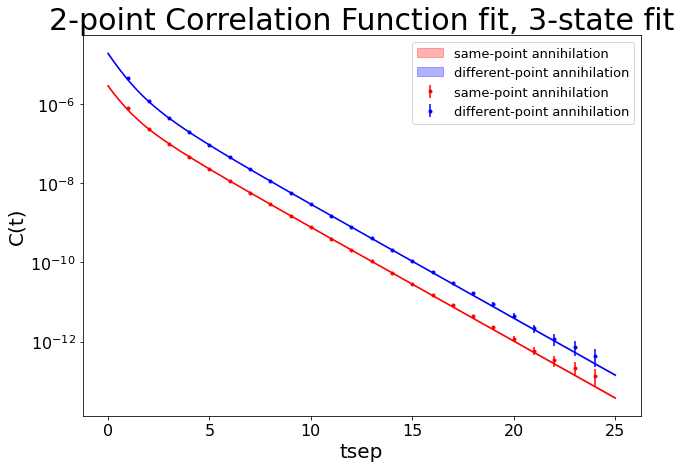

<Figure size 432x288 with 0 Axes>

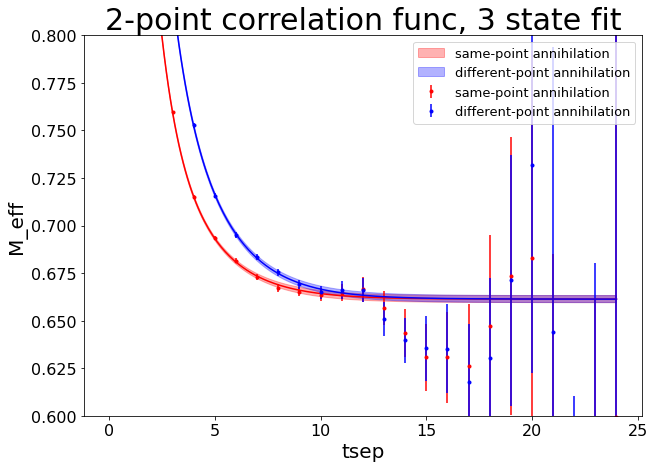

<Figure size 432x288 with 0 Axes>

In [68]:
# Plot the fits

t_plot = np.array([i for i in range(1, 25)])
x_raw2pt = np.array([t_plot, t_plot])
y_raw2pt_mean = np.array([[gv_avg_data['2pt_SS'][i].mean for i in t_plot], [gv_avg_data['2pt_PS'][i].mean for i in t_plot]])
y_raw2pt_sdev = np.array([[gv_avg_data['2pt_SS'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS'][i].sdev for i in t_plot]])
y_2ptmeff_mean = np.array([[gv_avg_data['2pt_SS_meff'][i].mean for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].mean for i in t_plot]])
y_2ptmeff_sdev = np.array([[gv_avg_data['2pt_SS_meff'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].sdev for i in t_plot]])

x_raw2pt_fit = np.array([tsep_model, tsep_model])
y_raw2pt_fit_mean = np.array([C2ptSS_model_mean, C2ptPS_model_mean])
y_raw2pt_fit_upper = np.array([C2ptSS_model_upbound, C2ptPS_model_upbound])
y_raw2pt_fit_lower = np.array([C2ptSS_model_lowbound, C2ptPS_model_lowbound])
h5_dm.fit_data_plot("2-point Correlation Function fit, 3-state fit", "tsep", "C(t)", x_raw2pt, y_raw2pt_mean, x_raw2pt_fit, y_raw2pt_fit_mean, y_raw2pt_fit_upper, y_raw2pt_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_raw2pt_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], logy = True, filename="optimalfit_2ptcorrelation_numzs3_multisampleoldprior.png")

y_2ptmeff_fit_mean = np.array([SS_meff_model_mean, PS_meff_model_mean])
y_2ptmeff_fit_upper = np.array([SS_meff_model_upbound, PS_meff_model_upbound])
y_2ptmeff_fit_lower = np.array([SS_meff_model_lowbound, PS_meff_model_lowbound])

#print(np.shape(x_raw2pt))
#print(np.shape(y_2ptmeff_mean))
#print(np.shape(x_raw2pt_fit[:,:-step_up]))
#print(np.shape(y_2ptmeff_fit_mean))
#print(np.shape(y_2ptmeff_fit_upper))
#print(np.shape(y_2ptmeff_fit_lower))
#print(np.shape(y_2ptmeff_sdev))

h5_dm.fit_data_plot("2-point correlation func, 3 state fit", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = [0.6, 0.8], nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], filename="optimalfit_2pteffmass_numzs3_multisampleoldprior.png")

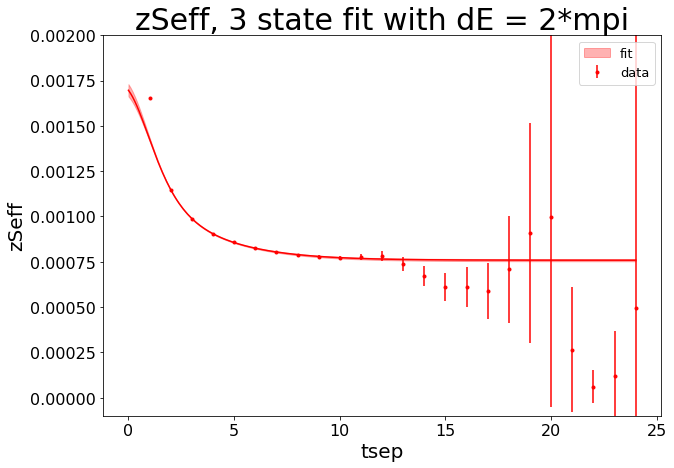

<Figure size 432x288 with 0 Axes>

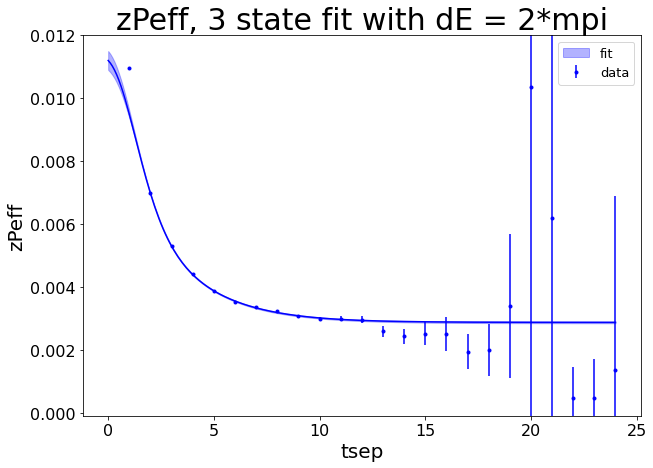

<Figure size 432x288 with 0 Axes>

In [69]:
h5_dm.fit_data_plot("zSeff, 3 state fit with dE = 2*mpi", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.002], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename="optimalfit_2pteffzs_numzs3_multisampleoldprior.png")
h5_dm.fit_data_plot("zPeff, 3 state fit with dE = 2*mpi", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "blue", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit", filename="optimalfit_2pteffzp_numzs3_multisampleoldprior.png")

In [ ]:
# Now, use the 3-point posteriors to plot out the rest.

In [23]:
# Now, plot the fit results of the chained-fit, starting with the 2-point data, with the 2-point fit
step_up = 10
t_min = 0
t_max = 25
tsep_model = np.linspace(t_min, t_max, (t_max - t_min)*step_up +1)

C2ptSS_model = C_2pt_SS(tsep_model, post_3pt)
C2ptPS_model = C_2pt_PS(tsep_model, post_3pt)

SS_meff_model = np.log(np.array([C2ptSS_model[j]/C2ptSS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))
PS_meff_model = np.log(np.array([C2ptPS_model[j]/C2ptPS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))

zSeff_model = np.array([np.sqrt(np.exp(SS_meff_model[t]*t/step_up)*C2ptSS_model[t]) for t in range(len(tsep_model[:-step_up]))])
zPeff_model = np.array([np.exp(PS_meff_model[t]*t/step_up)*C2ptPS_model[t]/zSeff_model[t] for t in range(len(tsep_model[:-step_up]))])

# Split the models up into mean, upper-bound, and lower-bound
C2ptSS_model_mean = np.array([C2ptSS_model[i].mean for i in range(len(C2ptSS_model))])
C2ptSS_model_upbound = np.array([C2ptSS_model[i].mean + C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptSS_model_lowbound = np.array([C2ptSS_model[i].mean - C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptPS_model_mean = np.array([C2ptPS_model[i].mean for i in range(len(C2ptPS_model))])
C2ptPS_model_upbound = np.array([C2ptPS_model[i].mean + C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
C2ptPS_model_lowbound = np.array([C2ptPS_model[i].mean - C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])

SS_meff_model_mean = np.array([SS_meff_model[i].mean for i in range(len(SS_meff_model))])
SS_meff_model_upbound = np.array([SS_meff_model[i].mean + SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
SS_meff_model_lowbound = np.array([SS_meff_model[i].mean - SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
PS_meff_model_mean = np.array([PS_meff_model[i].mean for i in range(len(PS_meff_model))])
PS_meff_model_upbound = np.array([PS_meff_model[i].mean + PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
PS_meff_model_lowbound = np.array([PS_meff_model[i].mean - PS_meff_model[i].sdev for i in range(len(PS_meff_model))])

zSeff_model_mean = np.array([zSeff_model[i].mean for i in range(len(zSeff_model))]) 
zSeff_model_upbound = np.array([zSeff_model[i].mean + zSeff_model[i].sdev for i in range(len(zSeff_model))]) 
zSeff_model_lowbound = np.array([zSeff_model[i].mean - zSeff_model[i].sdev for i in range(len(zSeff_model))])
zPeff_model_mean = np.array([zPeff_model[i].mean for i in range(len(zPeff_model))]) 
zPeff_model_upbound = np.array([zPeff_model[i].mean + zPeff_model[i].sdev for i in range(len(zPeff_model))])
zPeff_model_lowbound = np.array([zPeff_model[i].mean - zPeff_model[i].sdev for i in range(len(zPeff_model))])
#print(np.shape(zSeff_model_lowbound))

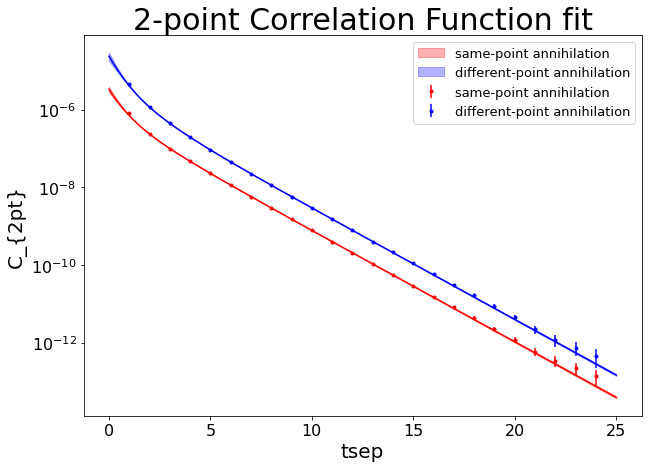

<Figure size 432x288 with 0 Axes>

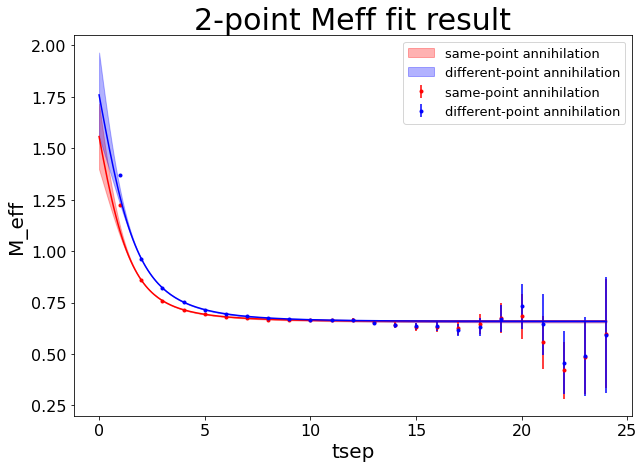

<Figure size 432x288 with 0 Axes>

In [35]:
# Plot the fits

t_plot = np.array([i for i in range(1, 25)])
x_raw2pt = np.array([t_plot, t_plot])
y_raw2pt_mean = np.array([[gv_avg_data['2pt_SS'][i].mean for i in t_plot], [gv_avg_data['2pt_PS'][i].mean for i in t_plot]])
y_raw2pt_sdev = np.array([[gv_avg_data['2pt_SS'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS'][i].sdev for i in t_plot]])
y_2ptmeff_mean = np.array([[gv_avg_data['2pt_SS_meff'][i].mean for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].mean for i in t_plot]])
y_2ptmeff_sdev = np.array([[gv_avg_data['2pt_SS_meff'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].sdev for i in t_plot]])

x_raw2pt_fit = np.array([tsep_model, tsep_model])
y_raw2pt_fit_mean = np.array([C2ptSS_model_mean, C2ptPS_model_mean])
y_raw2pt_fit_upper = np.array([C2ptSS_model_upbound, C2ptPS_model_upbound])
y_raw2pt_fit_lower = np.array([C2ptSS_model_lowbound, C2ptPS_model_lowbound])
h5_dm.fit_data_plot("2-point Correlation Function fit", "tsep", "C_{2pt}", x_raw2pt, y_raw2pt_mean, x_raw2pt_fit, y_raw2pt_fit_mean, y_raw2pt_fit_upper, y_raw2pt_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_raw2pt_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], logy = True)

y_2ptmeff_fit_mean = np.array([SS_meff_model_mean, PS_meff_model_mean])
y_2ptmeff_fit_upper = np.array([SS_meff_model_upbound, PS_meff_model_upbound])
y_2ptmeff_fit_lower = np.array([SS_meff_model_lowbound, PS_meff_model_lowbound])

#print(np.shape(x_raw2pt))
#print(np.shape(y_2ptmeff_mean))
#print(np.shape(x_raw2pt_fit[:,:-step_up]))
#print(np.shape(y_2ptmeff_fit_mean))
#print(np.shape(y_2ptmeff_fit_upper))
#print(np.shape(y_2ptmeff_fit_lower))
#print(np.shape(y_2ptmeff_sdev))

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"])

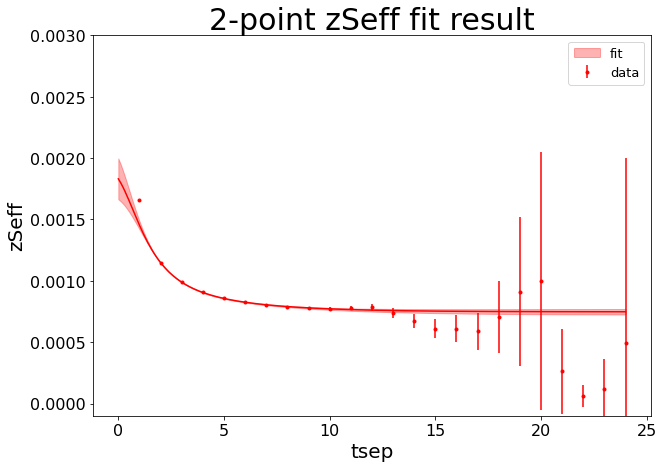

<Figure size 432x288 with 0 Axes>

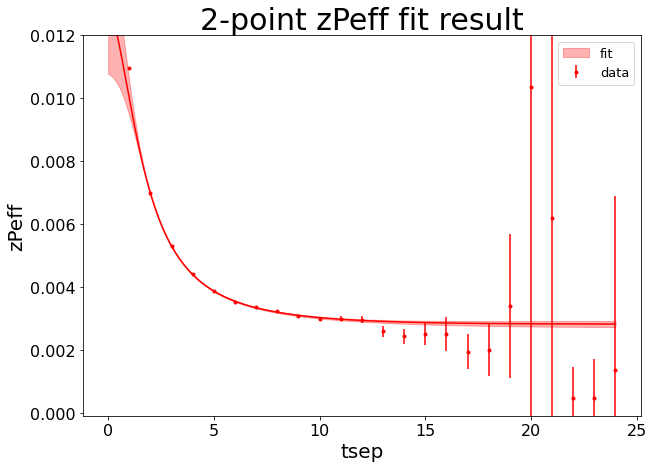

<Figure size 432x288 with 0 Axes>

In [36]:
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")

In [26]:
# Now, plot out the 3-point function
# First, create the x, y, and z values
x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

legendlabels_3pt = np.array(["tsep = {}".format(i) for i in tsep_vals])

# set the array of tsep, tau pairs
tau_step = 10

# Create 2-d and 1-d versions of the 3-point (tsep, tau) pairs
t_3pt_fitresult_2d = np.array([ np.array([ [tsep, tau] for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])
t_3pt_fitresult_tsep = np.zeros(np.sum(np.array([len(np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)) for tsep in tsep_vals])))
t_3pt_fitresult_tau = np.zeros(np.sum(np.array([len(np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)) for tsep in tsep_vals])))

k = 0
for tsep in tsep_vals:
    for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1):
        t_3pt_fitresult_tsep[k] = tsep
        t_3pt_fitresult_tau[k] = tau
        k += 1
        
t_3pt_fitresult_1d = np.transpose(np.array([t_3pt_fitresult_tsep, t_3pt_fitresult_tau]))

# Now, calculate gA3 and gA4

model_A3_3pt_1d = C_3pt_A3(t_3pt_fitresult_1d, post_3pt)
model_V4_3pt_1d = C_3pt_V4(t_3pt_fitresult_1d, post_3pt)

# Convert to 2d
model_A3_3pt_2d = convert_1dto2d(t_3pt_fitresult_1d, t_3pt_fitresult_2d, model_A3_3pt_1d)
model_V4_3pt_2d = convert_1dto2d(t_3pt_fitresult_1d, t_3pt_fitresult_2d, model_V4_3pt_1d)

# Now, take the ratio, first take the respective 2-point function

model_ratio_2pt = C_2pt_SS(tsep_vals, post_3pt)

model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
model_V4_ratio_2d = np.array([ np.array([ model_V4_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_V4_3pt_2d[i]))]) for i in range(len(model_V4_3pt_2d))])

# Now, to prepare for plotting, split the data into mean, upper-bound and lower-bound
model_A3_ratio_2d_mean = np.array([ [ model_A3_ratio_2d[i][j].mean for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])
model_A3_ratio_2d_upbound = np.array([ [ model_A3_ratio_2d[i][j].mean + model_A3_ratio_2d[i][j].sdev for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])
model_A3_ratio_2d_lowbound = np.array([ [ model_A3_ratio_2d[i][j].mean - model_A3_ratio_2d[i][j].sdev for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])

model_V4_ratio_2d_mean = np.array([ [ model_V4_ratio_2d[i][j].mean for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])
model_V4_ratio_2d_upbound = np.array([ [ model_V4_ratio_2d[i][j].mean + model_V4_ratio_2d[i][j].sdev for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])
model_V4_ratio_2d_lowbound = np.array([ [ model_V4_ratio_2d[i][j].mean - model_V4_ratio_2d[i][j].sdev for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])

# Also, convert the 2-d tsep, tau array into an array of tau - tsep/2
t_3pt_tseptau_diff = np.array([ np.array([tau - tsep/2. for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])

<ipython-input-26-d7267048673d>:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-26-d7267048673d>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-26-d7267048673d>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of li

<ipython-input-27-0cb77ae660ac>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-27-0cb77ae660ac>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-27-0cb77ae660ac>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of li

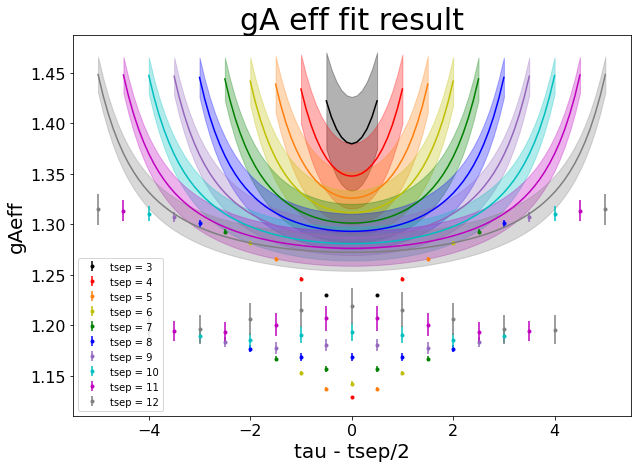

<Figure size 432x288 with 0 Axes>

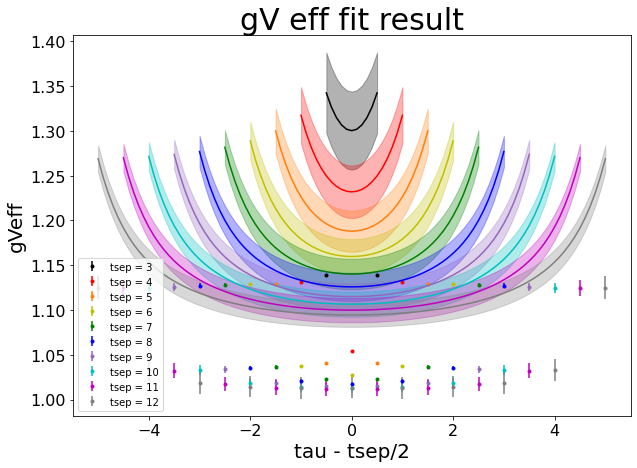

<Figure size 432x288 with 0 Axes>

In [27]:
# The color pallete for plotting the 3-point correlation function
colors_3pt = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey'])

# The raw dataset fitted to
x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt) 

#### Now, try completing the chain with a 3-point fit with tau cut off of 2

In [77]:
# Create a new set of priors
# Now try chain-fitting 2pt and 3-point
num_zs = 4
num_states_FH = 3

# prior the fits
tp = gv.BufferDict()

# This is the exponent e_decay_exp such that the increment between two consecutive excited state energies decays as 1/n^e_decay_exp, where n is the order of the excited state energy 
e_decay_exp = 0

tp['E0'] = gv.gvar(0.67, 0.02)
tp['Z0'] = gv.gvar(0.0008, 0.0003)
tp['Ztilde0'] = gv.gvar(0.003, 0.003)

#prior_2ptstep['E1'] = gv.gvar(1.3, 0.23)
#prior_2ptstep['log(E1)'] = gv.gvar(np.log(1.3), np.log(1.3/(1.3 - 0.3)))
#prior_2ptstep['Z1'] = gv.gvar(0.0012, 0.0006)
#prior_2ptstep['Ztilde1'] = gv.gvar(0.006, 0.005)

# Define some constants for prioring the higher-order energies
dE0 = 2*mpi
b = 0.7

# Use constant dE to prior the energies
dE0 = 2*mpi
energyvals = np.array([None]*num_zs)
dEvals = np.array([None]*(num_zs - 1))

#E0_errbar = 0.8
energyvals[0] = gv.gvar(0.67, 0.02)
for k in range(1, num_zs):
    dEvals[k-1] = dE0/np.power(k, e_decay_exp)
    energyvals[k] = energyvals[k-1] + dEvals[k-1]

for n in range(1, num_zs):
    tp['log(dE{})'.format(n)] = gv.gvar(np.log(dEvals[n-1]), b)
    tp['Z{}'.format(n)] = gv.gvar(0.0012, 0.0006)
    tp['Ztilde{}'.format(n)] = gv.gvar(0, 0.01)
    
    # Insert priors for energy here
    #dE_next = dE0/np.power(n, e_decay_exp)
    #E_next = prior_2ptstep['E{}'.format(n-1)].mean + dE_next
    #sigma_next = np.log(E_next/(E_next - (dE_next*b)))

print(num_states_FH - 2)

for n in range(num_zs):
    for m in range(num_zs):
        
        tp['gA3_{0}{1}'.format(n, m)] = gv.gvar(0, 2)
        if n == m and n < num_zs-1:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(1, 0.1)
        else:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(0, 2)

tp['gA3_00'] = gv.gvar(1.25, 0.15)
tp['gV4_00'] = gv.gvar(1.07, 0.07)

1


In [78]:
# 2-point fit
fit_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=tp,fcn=C_2pt,debug=True)
print(fit_2pt.format(pstyle='vv'))
post_2pt = fit_2pt.p

Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118014 +- 0.000236461             [ 0.0012 +- 0.0006 ]  
        Ztilde3      0.008748

In [79]:

tau_cut_val = 2
y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_A3_2d)
y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_V4 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_V4_2d)
y_3pt = np.transpose(np.array([[y_3pt_A3], [y_3pt_V4]]), axes=[2,0,1])

# Create the dataset to be fit
x_1darray_tau2 = []
y_3pt_tau2 = []

    
for k in range(len(t_1d_array)):
    if(t_1d_array[k][0] >= 4):
        if(t_1d_array[k][1] >= tau_cut_val):
            if(t_1d_array[k][1] <= t_1d_array[k][0] - tau_cut_val):
                x_1darray_tau2.append(t_1d_array[k].tolist())
                y_3pt_tau2.append(y_3pt[k].tolist())
                            
x_1darray_tau2 = np.array(x_1darray_tau2)
y_3pt_tau2 = np.array(y_3pt_tau2)

fit_3pt_tau2 = lsqfit.nonlinear_fit(data=(x_1darray_tau2, y_3pt_tau2), prior=post_2pt, fcn = C_3pt,debug=True)
print(fit_3pt_tau2.format(pstyle='vv'))
post_3pt_tau2 = fit_3pt_tau2.p

<ipython-input-79-525d27ecfe4b>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-79-525d27ecfe4b>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])


Least Square Fit:
  chi2/dof [dof] = 0.34 [90]    Q = 1    logGBF = 2722.5

Parameters:
             E0        0.66084 +- 0.00266371             [     0.661027 +- 0.00280207 ]  
             Z0   0.000755625 +- 9.78603e-06             [ 0.000756981 +- 1.03675e-05 ]  
        Ztilde0     0.00285221 +- 4.3886e-05             [   0.00286124 +- 4.6968e-05 ]  
       log(dE1)        -0.861442 +- 0.107274             [        -0.8113 +- 0.135657 ]  
             Z1   0.000617033 +- 6.89243e-05             [ 0.000662449 +- 9.46282e-05 ]  
        Ztilde1    0.00415219 +- 0.000569303             [  0.00448214 +- 0.000764342 ]  
       log(dE2)        -0.826668 +- 0.323165             [      -0.516866 +- 0.438609 ]  
             Z2   0.000558668 +- 0.000309334             [  0.000799852 +- 0.00040447 ]  
        Ztilde2     0.00411444 +- 0.00242404             [     0.0059393 +- 0.0030705 ]  
       log(dE3)        -0.486448 +- 0.427236             [       -0.526875 +- 0.58489 ]  
            

In [80]:
current_posterior = open('chained_2pt_3pt_tau2_Final.obj', 'wb')
pickle.dump(post_3pt_tau2, current_posterior)
current_posterior.close()

In [81]:
# Now, plot the fit results of the chained-fit, starting with the 2-point data
step_up = 10
t_min = 0
t_max = 25
tsep_model = np.linspace(t_min, t_max, (t_max - t_min)*step_up +1)

C2ptSS_model = C_2pt_SS(tsep_model, post_3pt_tau2)
C2ptPS_model = C_2pt_PS(tsep_model, post_3pt_tau2)

SS_meff_model = np.log(np.array([C2ptSS_model[j]/C2ptSS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))
PS_meff_model = np.log(np.array([C2ptPS_model[j]/C2ptPS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))

zSeff_model = np.array([np.sqrt(np.exp(SS_meff_model[t]*t/step_up)*C2ptSS_model[t]) for t in range(len(tsep_model[:-step_up]))])
zPeff_model = np.array([np.exp(PS_meff_model[t]*t/step_up)*C2ptPS_model[t]/zSeff_model[t] for t in range(len(tsep_model[:-step_up]))])

# Split the models up into mean, upper-bound, and lower-bound
C2ptSS_model_mean = np.array([C2ptSS_model[i].mean for i in range(len(C2ptSS_model))])
C2ptSS_model_upbound = np.array([C2ptSS_model[i].mean + C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptSS_model_lowbound = np.array([C2ptSS_model[i].mean - C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptPS_model_mean = np.array([C2ptPS_model[i].mean for i in range(len(C2ptPS_model))])
C2ptPS_model_upbound = np.array([C2ptPS_model[i].mean + C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
C2ptPS_model_lowbound = np.array([C2ptPS_model[i].mean - C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])

SS_meff_model_mean = np.array([SS_meff_model[i].mean for i in range(len(SS_meff_model))])
SS_meff_model_upbound = np.array([SS_meff_model[i].mean + SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
SS_meff_model_lowbound = np.array([SS_meff_model[i].mean - SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
PS_meff_model_mean = np.array([PS_meff_model[i].mean for i in range(len(PS_meff_model))])
PS_meff_model_upbound = np.array([PS_meff_model[i].mean + PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
PS_meff_model_lowbound = np.array([PS_meff_model[i].mean - PS_meff_model[i].sdev for i in range(len(PS_meff_model))])

zSeff_model_mean = np.array([zSeff_model[i].mean for i in range(len(zSeff_model))]) 
zSeff_model_upbound = np.array([zSeff_model[i].mean + zSeff_model[i].sdev for i in range(len(zSeff_model))]) 
zSeff_model_lowbound = np.array([zSeff_model[i].mean - zSeff_model[i].sdev for i in range(len(zSeff_model))])
zPeff_model_mean = np.array([zPeff_model[i].mean for i in range(len(zPeff_model))]) 
zPeff_model_upbound = np.array([zPeff_model[i].mean + zPeff_model[i].sdev for i in range(len(zPeff_model))])
zPeff_model_lowbound = np.array([zPeff_model[i].mean - zPeff_model[i].sdev for i in range(len(zPeff_model))])
#print(np.shape(zSeff_model_lowbound))

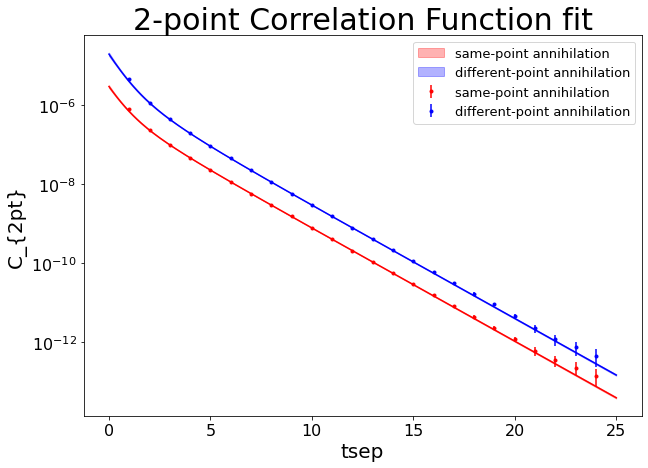

<Figure size 432x288 with 0 Axes>

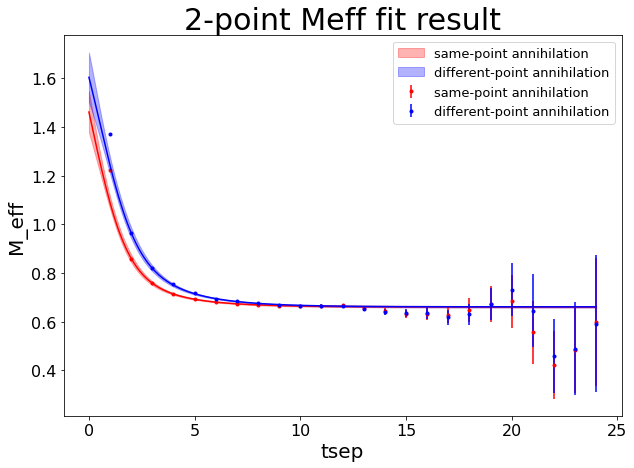

<Figure size 432x288 with 0 Axes>

In [82]:
# Plot the fits

t_plot = np.array([i for i in range(1, 25)])
x_raw2pt = np.array([t_plot, t_plot])
y_raw2pt_mean = np.array([[gv_avg_data['2pt_SS'][i].mean for i in t_plot], [gv_avg_data['2pt_PS'][i].mean for i in t_plot]])
y_raw2pt_sdev = np.array([[gv_avg_data['2pt_SS'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS'][i].sdev for i in t_plot]])
y_2ptmeff_mean = np.array([[gv_avg_data['2pt_SS_meff'][i].mean for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].mean for i in t_plot]])
y_2ptmeff_sdev = np.array([[gv_avg_data['2pt_SS_meff'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].sdev for i in t_plot]])

x_raw2pt_fit = np.array([tsep_model, tsep_model])
y_raw2pt_fit_mean = np.array([C2ptSS_model_mean, C2ptPS_model_mean])
y_raw2pt_fit_upper = np.array([C2ptSS_model_upbound, C2ptPS_model_upbound])
y_raw2pt_fit_lower = np.array([C2ptSS_model_lowbound, C2ptPS_model_lowbound])
h5_dm.fit_data_plot("2-point Correlation Function fit", "tsep", "C_{2pt}", x_raw2pt, y_raw2pt_mean, x_raw2pt_fit, y_raw2pt_fit_mean, y_raw2pt_fit_upper, y_raw2pt_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_raw2pt_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], logy = True)

y_2ptmeff_fit_mean = np.array([SS_meff_model_mean, PS_meff_model_mean])
y_2ptmeff_fit_upper = np.array([SS_meff_model_upbound, PS_meff_model_upbound])
y_2ptmeff_fit_lower = np.array([SS_meff_model_lowbound, PS_meff_model_lowbound])

#print(np.shape(x_raw2pt))
#print(np.shape(y_2ptmeff_mean))
#print(np.shape(x_raw2pt_fit[:,:-step_up]))
#print(np.shape(y_2ptmeff_fit_mean))
#print(np.shape(y_2ptmeff_fit_upper))
#print(np.shape(y_2ptmeff_fit_lower))
#print(np.shape(y_2ptmeff_sdev))

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"])

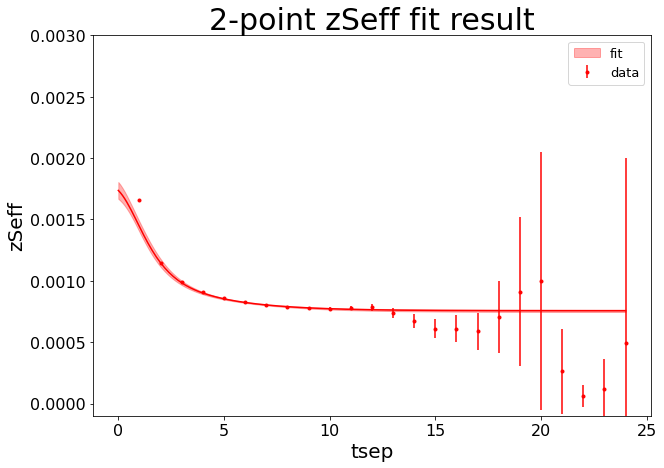

<Figure size 432x288 with 0 Axes>

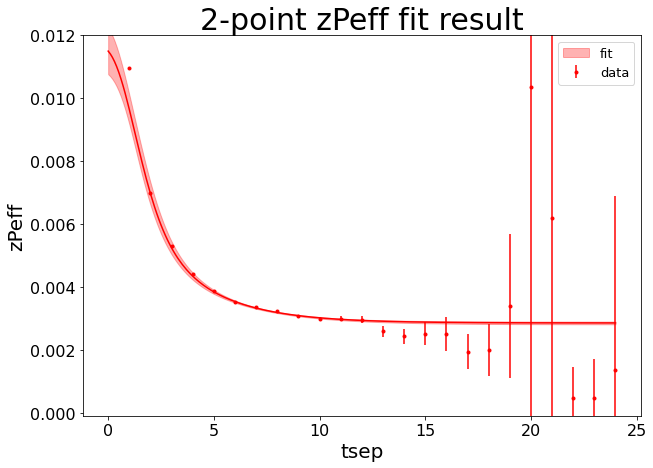

<Figure size 432x288 with 0 Axes>

In [83]:
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")

<ipython-input-84-0cb77ae660ac>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-84-0cb77ae660ac>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-84-0cb77ae660ac>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of li

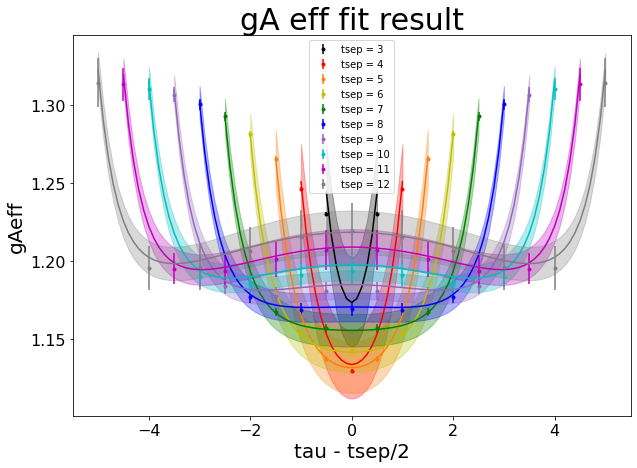

<Figure size 432x288 with 0 Axes>

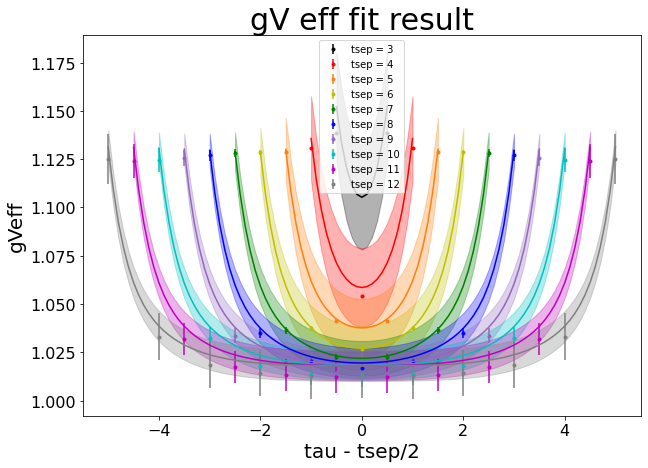

<Figure size 432x288 with 0 Axes>

In [84]:
# The color pallete for plotting the 3-point correlation function
colors_3pt = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey'])

# The raw dataset fitted to
x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt) 

#### Now, try the same, but with an insertion of Feynman-Hellman

In [85]:
# Now try chain-fitting 2pt and 3-point
num_zs = 7
num_states_FH = 2

# prior the fits
prior_2ptstep = gv.BufferDict()

# This is the exponent e_decay_exp such that the increment between two consecutive excited state energies decays as 1/n^e_decay_exp, where n is the order of the excited state energy 
e_decay_exp = 0

tp['E0'] = gv.gvar(0.67, 0.02)
tp['Z0'] = gv.gvar(0.0008, 0.0003)
tp['Ztilde0'] = gv.gvar(0.003, 0.003)

#tp['E1'] = gv.gvar(1.3, 0.23)
#tp['log(E1)'] = gv.gvar(np.log(1.3), np.log(1.3/(1.3 - 0.3)))
#tp['Z1'] = gv.gvar(0.0012, 0.0006)
#tp['Ztilde1'] = gv.gvar(0.006, 0.005)

# Define some constants for prioring the higher-order energies
dE0 = 2*mpi
b = 0.7

# Use constant dE to prior the energies
dE0 = 2*mpi
energyvals = np.array([None]*num_zs)
dEvals = np.array([None]*(num_zs - 1))

#E0_errbar = 0.8
energyvals[0] = gv.gvar(0.67, 0.02)
for k in range(1, num_zs):
    dEvals[k-1] = dE0/np.power(k, e_decay_exp)
    energyvals[k] = energyvals[k-1] + dEvals[k-1]

for n in range(1, num_zs):
    tp['log(dE{})'.format(n)] = gv.gvar(np.log(dEvals[n-1]), b)
    tp['Z{}'.format(n)] = gv.gvar(0.0012, 0.0006)
    tp['Ztilde{}'.format(n)] = gv.gvar(0, 0.01)
    
    # Insert priors for energy here
    #dE_next = dE0/np.power(n, e_decay_exp)
    #E_next = tp['E{}'.format(n-1)].mean + dE_next
    #sigma_next = np.log(E_next/(E_next - (dE_next*b)))

print(num_states_FH - 2)

for n in range(num_zs):
    tp["d_gA_ss_{}".format(n)] = gv.gvar(0,0.00001)
    tp["d_gA_ps_{}".format(n)] = gv.gvar(0,0.00001)
    tp["d_gV_ss_{}".format(n)] = gv.gvar(0,0.00001)
    tp["d_gV_ps_{}".format(n)] = gv.gvar(0,0.00001)
    for m in range(num_zs):
        
        tp['gA3_{0}{1}'.format(n, m)] = gv.gvar(0, 2)
        if n == m and n < num_zs-1:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(1, 0.1)
        else:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(0, 2)

tp['gA3_00'] = gv.gvar(1.25, 0.15)
tp['gV4_00'] = gv.gvar(1.07, 0.07)

# Set the "garbage can" for the Feynman Hellman fit, post-Lattice-QCD stage
tp['Z_FHmax'] = gv.gvar(0.0012, 0.0006)
tp['Ztilde_FHmax'] = gv.gvar(0, 0.01)
tp['log(FH_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), b) 

for n in range(num_states_FH-1):
    tp['gA3_FHmax{}'.format(n)] = gv.gvar(0, 2)
    tp['gA3_{}FHmax'.format(n)] = gv.gvar(0, 2)
    tp['gV4_FHmax{}'.format(n)] = gv.gvar(0, 2)
    tp['gV4_{}FHmax'.format(n)] = gv.gvar(0, 2)
    
tp['gA3_FHmaxFHmax'] = gv.gvar(0, 2)
tp['gV4_FHmaxFHmax'] = gv.gvar(0, 2)

# Set the "garbage can" for the Feynman Hellman fit, Lattice-QCD stage
#prior_2ptstep['Z_FHdatamax'] = gv.gvar(0.0012, 0.0006)
#prior_2ptstep['Ztilde_FHdatamax'] = gv.gvar(0, 0.01)
#prior_2ptstep['log(FHdata_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), b) 

#for n in range(num_states_FH-1):
    #prior_2ptstep['gA3_FHdatamax{}'.format(n)] = gv.gvar(1, 2)
    #prior_2ptstep['gA3_{}FHdatamax'.format(n)] = gv.gvar(1, 2)
    #prior_2ptstep['gV4_FHdatamax{}'.format(n)] = gv.gvar(0, 2)
    #prior_2ptstep['gV4_{}FHdatamax'.format(n)] = gv.gvar(0, 2)
    
#prior_2ptstep['gA3_FHdatamaxFHdatamax'] = gv.gvar(1, 2)
#prior_2ptstep['gV4_FHdatamaxFHdatamax'] = gv.gvar(0, 2)



#prior_2ptstep

0


In [86]:
# 2-point fit
fit_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=tp,fcn=C_2pt,debug=True)
print(fit_2pt.format(pstyle='vv'))
post_2pt = fit_2pt.p

Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712665 +- 0.000420096             [ 0.0012 +- 0.0006 ]  
        Ztilde3     0.0030271

In [87]:
fit_FHdata = lsqfit.nonlinear_fit(data=(np.array([l for l in tsep_vals[:-1]]), np.array([gv_avg_data['FH'][l] for l in range(np.min(tsep_vals), np.max(tsep_vals))])), prior=post_2pt,fcn=C_FHdata, debug=True)
print(fit_FHdata.format(pstyle='vv'))
post_FHdata = fit_FHdata.p

Least Square Fit:
  chi2/dof [dof] = 0.82 [36]    Q = 0.77    logGBF = 134.96

Parameters:
             E0        0.659949 +- 0.00435922             [     0.659347 +- 0.00482406 ]  
             Z0    0.000750701 +- 2.06845e-05             [ 0.000748018 +- 2.26286e-05 ]  
        Ztilde0     0.00283144 +- 9.17314e-05             [  0.00281834 +- 0.000100562 ]  
       log(dE1)          -1.04455 +- 0.433894             [       -1.07435 +- 0.453575 ]  
             Z1     0.00052056 +- 0.000192475             [ 0.000518164 +- 0.000197072 ]  
        Ztilde1      0.00320739 +- 0.00163523             [   0.00318134 +- 0.00168234 ]  
       log(dE2)         -0.781353 +- 0.438272             [      -0.732238 +- 0.442562 ]  
             Z2     0.000736948 +- 0.00028496             [ 0.000778871 +- 0.000287095 ]  
        Ztilde2      0.00645812 +- 0.00260838             [     0.0064959 +- 0.0026369 ]  
       log(dE3)         -0.893886 +- 0.644406             [      -0.853576 +- 0.645681 ]  

In [88]:
y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_A3_2d)
y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_V4 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_V4_2d)
y_3pt = np.transpose(np.array([[y_3pt_A3], [y_3pt_V4]]), axes=[2,0,1])


fit_3pt = lsqfit.nonlinear_fit(data=(t_1d_array, y_3pt), prior=post_FHdata, fcn = C_3pt, debug = True)
print(fit_3pt.format(pstyle='vv'))
post_3pt = fit_3pt.p

<ipython-input-88-466f052596c2>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-88-466f052596c2>:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])


Least Square Fit:
  chi2/dof [dof] = 0.31 [130]    Q = 1    logGBF = 3900.6

Parameters:
             E0        0.661638 +- 0.00351959             [      0.659949 +- 0.00435922 ]  
             Z0    0.000756271 +- 1.56915e-05             [  0.000750701 +- 2.06845e-05 ]  
        Ztilde0     0.00284931 +- 6.84249e-05             [   0.00283144 +- 9.17314e-05 ]  
       log(dE1)          -1.28433 +- 0.250496             [        -1.04455 +- 0.433894 ]  
             Z1    0.000313831 +- 0.000104195             [   0.00052056 +- 0.000192475 ]  *
        Ztilde1     0.00195004 +- 0.000895544             [    0.00320739 +- 0.00163523 ]  
       log(dE2)           -1.3258 +- 0.249902             [       -0.781353 +- 0.438272 ]  *
             Z2    0.000605733 +- 0.000169241             [   0.000736948 +- 0.00028496 ]  
        Ztilde2      0.00340676 +- 0.00175877             [    0.00645812 +- 0.00260838 ]  *
       log(dE3)         -0.500117 +- 0.326248             [       -0.893886 +- 0

In [89]:
current_posterior = open('chained_2pt_3pt_withFH_Final.obj', 'wb')
pickle.dump(post_3pt, current_posterior)
current_posterior.close()

In [90]:
# Now, plot the fit results of the chained-fit, starting with the 2-point data
step_up = 10
t_min = 0
t_max = 25
tsep_model = np.linspace(t_min, t_max, (t_max - t_min)*step_up +1)

C2ptSS_model = C_2pt_SS(tsep_model, post_3pt)
C2ptPS_model = C_2pt_PS(tsep_model, post_3pt)

SS_meff_model = np.log(np.array([C2ptSS_model[j]/C2ptSS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))
PS_meff_model = np.log(np.array([C2ptPS_model[j]/C2ptPS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))

zSeff_model = np.array([np.sqrt(np.exp(SS_meff_model[t]*t/step_up)*C2ptSS_model[t]) for t in range(len(tsep_model[:-step_up]))])
zPeff_model = np.array([np.exp(PS_meff_model[t]*t/step_up)*C2ptPS_model[t]/zSeff_model[t] for t in range(len(tsep_model[:-step_up]))])

# Split the models up into mean, upper-bound, and lower-bound
C2ptSS_model_mean = np.array([C2ptSS_model[i].mean for i in range(len(C2ptSS_model))])
C2ptSS_model_upbound = np.array([C2ptSS_model[i].mean + C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptSS_model_lowbound = np.array([C2ptSS_model[i].mean - C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptPS_model_mean = np.array([C2ptPS_model[i].mean for i in range(len(C2ptPS_model))])
C2ptPS_model_upbound = np.array([C2ptPS_model[i].mean + C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
C2ptPS_model_lowbound = np.array([C2ptPS_model[i].mean - C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])

SS_meff_model_mean = np.array([SS_meff_model[i].mean for i in range(len(SS_meff_model))])
SS_meff_model_upbound = np.array([SS_meff_model[i].mean + SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
SS_meff_model_lowbound = np.array([SS_meff_model[i].mean - SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
PS_meff_model_mean = np.array([PS_meff_model[i].mean for i in range(len(PS_meff_model))])
PS_meff_model_upbound = np.array([PS_meff_model[i].mean + PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
PS_meff_model_lowbound = np.array([PS_meff_model[i].mean - PS_meff_model[i].sdev for i in range(len(PS_meff_model))])

zSeff_model_mean = np.array([zSeff_model[i].mean for i in range(len(zSeff_model))]) 
zSeff_model_upbound = np.array([zSeff_model[i].mean + zSeff_model[i].sdev for i in range(len(zSeff_model))]) 
zSeff_model_lowbound = np.array([zSeff_model[i].mean - zSeff_model[i].sdev for i in range(len(zSeff_model))])
zPeff_model_mean = np.array([zPeff_model[i].mean for i in range(len(zPeff_model))]) 
zPeff_model_upbound = np.array([zPeff_model[i].mean + zPeff_model[i].sdev for i in range(len(zPeff_model))])
zPeff_model_lowbound = np.array([zPeff_model[i].mean - zPeff_model[i].sdev for i in range(len(zPeff_model))])
#print(np.shape(zSeff_model_lowbound))

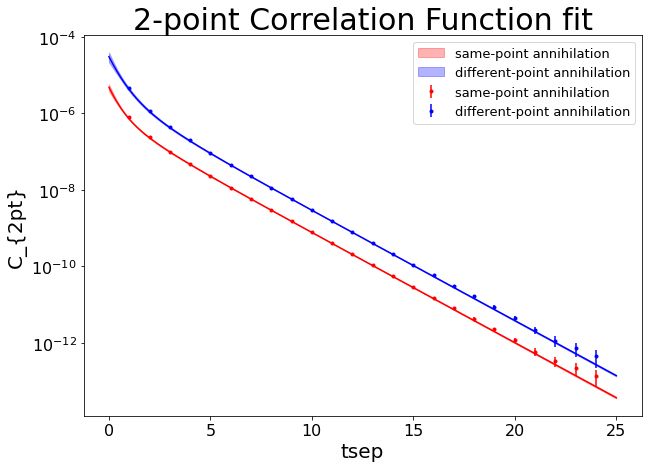

<Figure size 432x288 with 0 Axes>

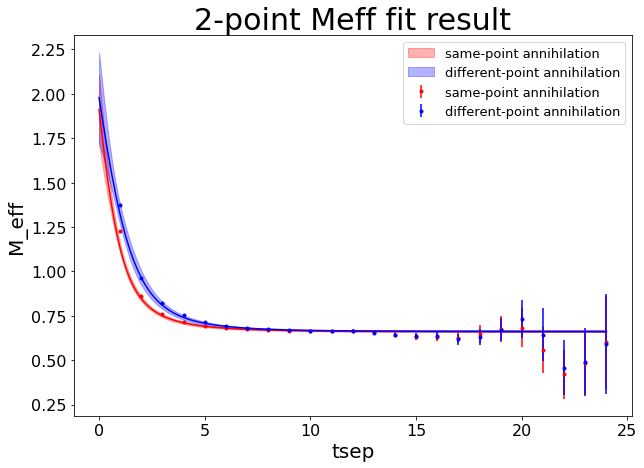

<Figure size 432x288 with 0 Axes>

In [91]:
# Plot the fits

t_plot = np.array([i for i in range(1, 25)])
x_raw2pt = np.array([t_plot, t_plot])
y_raw2pt_mean = np.array([[gv_avg_data['2pt_SS'][i].mean for i in t_plot], [gv_avg_data['2pt_PS'][i].mean for i in t_plot]])
y_raw2pt_sdev = np.array([[gv_avg_data['2pt_SS'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS'][i].sdev for i in t_plot]])
y_2ptmeff_mean = np.array([[gv_avg_data['2pt_SS_meff'][i].mean for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].mean for i in t_plot]])
y_2ptmeff_sdev = np.array([[gv_avg_data['2pt_SS_meff'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].sdev for i in t_plot]])

x_raw2pt_fit = np.array([tsep_model, tsep_model])
y_raw2pt_fit_mean = np.array([C2ptSS_model_mean, C2ptPS_model_mean])
y_raw2pt_fit_upper = np.array([C2ptSS_model_upbound, C2ptPS_model_upbound])
y_raw2pt_fit_lower = np.array([C2ptSS_model_lowbound, C2ptPS_model_lowbound])
h5_dm.fit_data_plot("2-point Correlation Function fit", "tsep", "C_{2pt}", x_raw2pt, y_raw2pt_mean, x_raw2pt_fit, y_raw2pt_fit_mean, y_raw2pt_fit_upper, y_raw2pt_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_raw2pt_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], logy = True)

y_2ptmeff_fit_mean = np.array([SS_meff_model_mean, PS_meff_model_mean])
y_2ptmeff_fit_upper = np.array([SS_meff_model_upbound, PS_meff_model_upbound])
y_2ptmeff_fit_lower = np.array([SS_meff_model_lowbound, PS_meff_model_lowbound])

#print(np.shape(x_raw2pt))
#print(np.shape(y_2ptmeff_mean))
#print(np.shape(x_raw2pt_fit[:,:-step_up]))
#print(np.shape(y_2ptmeff_fit_mean))
#print(np.shape(y_2ptmeff_fit_upper))
#print(np.shape(y_2ptmeff_fit_lower))
#print(np.shape(y_2ptmeff_sdev))

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"])

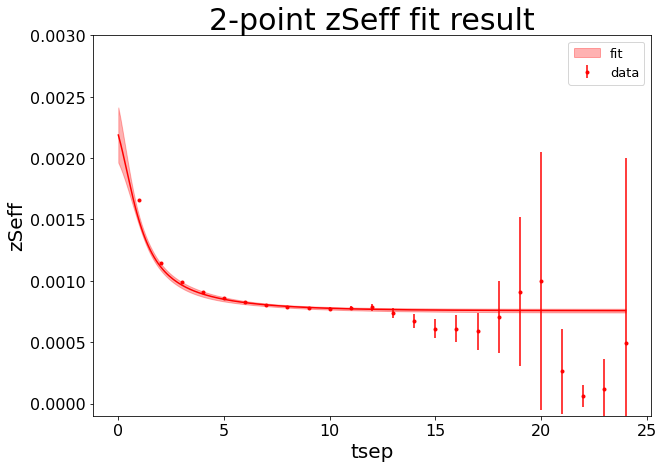

<Figure size 432x288 with 0 Axes>

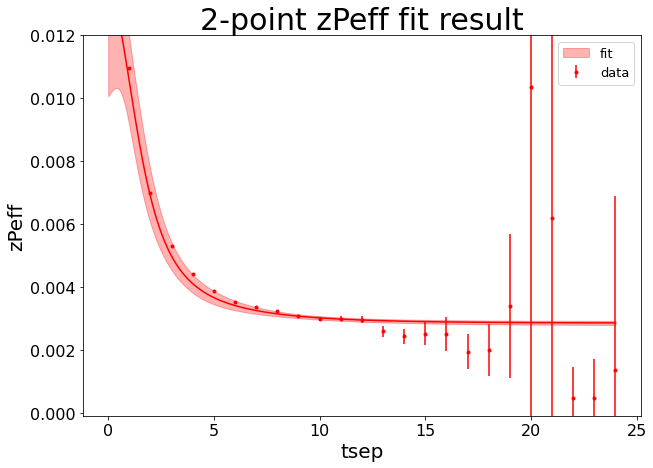

<Figure size 432x288 with 0 Axes>

In [92]:
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")

In [93]:
# Now, plot out the 3-point function
# First, create the x, y, and z values
x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

legendlabels_3pt = np.array(["tsep = {}".format(i) for i in tsep_vals])

# set the array of tsep, tau pairs
tau_step = 10

# Create 2-d and 1-d versions of the 3-point (tsep, tau) pairs
t_3pt_fitresult_2d = np.array([ np.array([ [tsep, tau] for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])
t_3pt_fitresult_tsep = np.zeros(np.sum(np.array([len(np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)) for tsep in tsep_vals])))
t_3pt_fitresult_tau = np.zeros(np.sum(np.array([len(np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)) for tsep in tsep_vals])))

k = 0
for tsep in tsep_vals:
    for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1):
        t_3pt_fitresult_tsep[k] = tsep
        t_3pt_fitresult_tau[k] = tau
        k += 1
        
t_3pt_fitresult_1d = np.transpose(np.array([t_3pt_fitresult_tsep, t_3pt_fitresult_tau]))

# Now, calculate gA3 and gA4

model_A3_3pt_1d = C_3pt_A3(t_3pt_fitresult_1d, post_3pt)
model_V4_3pt_1d = C_3pt_V4(t_3pt_fitresult_1d, post_3pt)

# Convert to 2d
model_A3_3pt_2d = convert_1dto2d(t_3pt_fitresult_1d, t_3pt_fitresult_2d, model_A3_3pt_1d)
model_V4_3pt_2d = convert_1dto2d(t_3pt_fitresult_1d, t_3pt_fitresult_2d, model_V4_3pt_1d)

# Now, take the ratio, first take the respective 2-point function

model_ratio_2pt = C_2pt_SS(tsep_vals, post_3pt)

model_A3_ratio_2d = np.array([ np.array([ model_A3_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_A3_3pt_2d[i]))]) for i in range(len(model_A3_3pt_2d))])
model_V4_ratio_2d = np.array([ np.array([ model_V4_3pt_2d[i][j]/model_ratio_2pt[i] for j in range(len(model_V4_3pt_2d[i]))]) for i in range(len(model_V4_3pt_2d))])

# Now, to prepare for plotting, split the data into mean, upper-bound and lower-bound
model_A3_ratio_2d_mean = np.array([ [ model_A3_ratio_2d[i][j].mean for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])
model_A3_ratio_2d_upbound = np.array([ [ model_A3_ratio_2d[i][j].mean + model_A3_ratio_2d[i][j].sdev for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])
model_A3_ratio_2d_lowbound = np.array([ [ model_A3_ratio_2d[i][j].mean - model_A3_ratio_2d[i][j].sdev for j in range(len(model_A3_ratio_2d[i]))] for i in range(len(model_A3_ratio_2d)) ])

model_V4_ratio_2d_mean = np.array([ [ model_V4_ratio_2d[i][j].mean for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])
model_V4_ratio_2d_upbound = np.array([ [ model_V4_ratio_2d[i][j].mean + model_V4_ratio_2d[i][j].sdev for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])
model_V4_ratio_2d_lowbound = np.array([ [ model_V4_ratio_2d[i][j].mean - model_V4_ratio_2d[i][j].sdev for j in range(len(model_V4_ratio_2d[i]))] for i in range(len(model_V4_ratio_2d)) ])

# Also, convert the 2-d tsep, tau array into an array of tau - tsep/2
t_3pt_tseptau_diff = np.array([ np.array([tau - tsep/2. for tau in np.linspace(1, tsep - 1, (tsep - 2)*step_up +1)]) for tsep in tsep_vals])

<ipython-input-93-d7267048673d>:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-93-d7267048673d>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-93-d7267048673d>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of li

<ipython-input-94-0cb77ae660ac>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-94-0cb77ae660ac>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-94-0cb77ae660ac>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of li

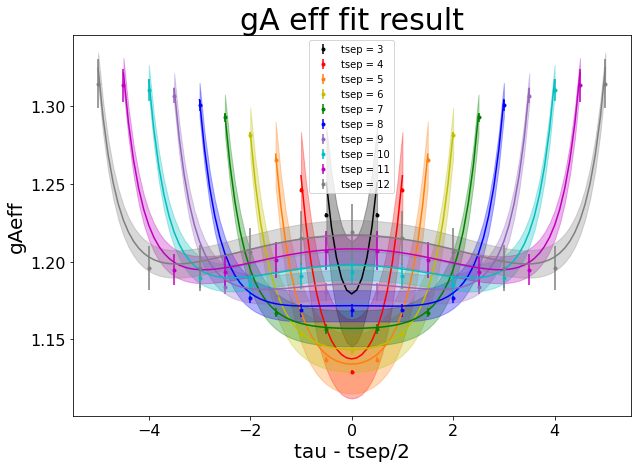

<Figure size 432x288 with 0 Axes>

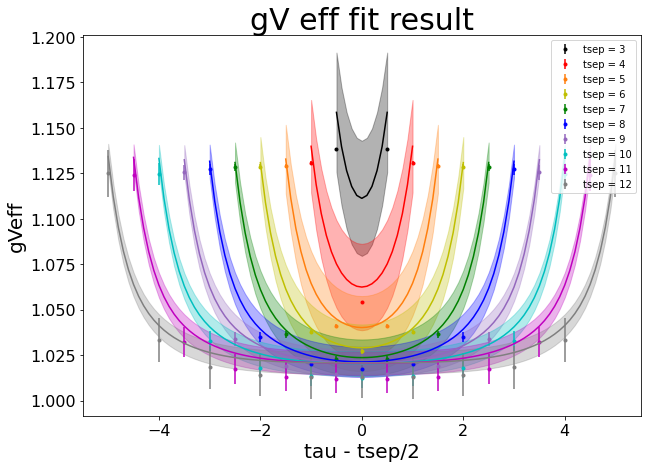

<Figure size 432x288 with 0 Axes>

In [94]:
# The color pallete for plotting the 3-point correlation function
colors_3pt = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey'])

# The raw dataset fitted to
x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt) 

#### Now, try completing the chain with a 3-point fit with tau cut off of 2

In [95]:
# Create a new set of priors
# Now try chain-fitting 2pt and 3-point
num_zs = 4
num_states_FH = 3


# prior the fits
prior_2ptstep = gv.BufferDict()

# This is the exponent e_decay_exp such that the increment between two consecutive excited state energies decays as 1/n^e_decay_exp, where n is the order of the excited state energy 
e_decay_exp = 0

tp['E0'] = gv.gvar(0.67, 0.02)
tp['Z0'] = gv.gvar(0.0008, 0.0003)
tp['Ztilde0'] = gv.gvar(0.003, 0.003)

#tp['E1'] = gv.gvar(1.3, 0.23)
#tp['log(E1)'] = gv.gvar(np.log(1.3), np.log(1.3/(1.3 - 0.3)))
#tp['Z1'] = gv.gvar(0.0012, 0.0006)
#tp['Ztilde1'] = gv.gvar(0.006, 0.005)

# Define some constants for prioring the higher-order energies
dE0 = 2*mpi
b = 0.7

# Use constant dE to prior the energies
dE0 = 2*mpi
energyvals = np.array([None]*num_zs)
dEvals = np.array([None]*(num_zs - 1))

#E0_errbar = 0.8
energyvals[0] = gv.gvar(0.67, 0.02)
for k in range(1, num_zs):
    dEvals[k-1] = dE0/np.power(k, e_decay_exp)
    energyvals[k] = energyvals[k-1] + dEvals[k-1]

for n in range(1, num_zs):
    tp['log(dE{})'.format(n)] = gv.gvar(np.log(dEvals[n-1]), b)
    tp['Z{}'.format(n)] = gv.gvar(0.0012, 0.0006)
    tp['Ztilde{}'.format(n)] = gv.gvar(0, 0.01)
    
    # Insert priors for energy here
    #dE_next = dE0/np.power(n, e_decay_exp)
    #E_next = tp['E{}'.format(n-1)].mean + dE_next
    #sigma_next = np.log(E_next/(E_next - (dE_next*b)))

print(num_states_FH - 2)

for n in range(num_zs):
    tp["d_gA_ss_{}".format(n)] = gv.gvar(0,0.00001)
    tp["d_gA_ps_{}".format(n)] = gv.gvar(0,0.00001)
    tp["d_gV_ss_{}".format(n)] = gv.gvar(0,0.00001)
    tp["d_gV_ps_{}".format(n)] = gv.gvar(0,0.00001)
    for m in range(num_zs):
        
        tp['gA3_{0}{1}'.format(n, m)] = gv.gvar(0, 2)
        if n == m and n < num_zs-1:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(1, 0.1)
        else:
            tp['gV4_{0}{1}'.format(n, m)] = gv.gvar(0, 2)

tp['gA3_00'] = gv.gvar(1.25, 0.15)
tp['gV4_00'] = gv.gvar(1.07, 0.07)

# Set the "garbage can" for the Feynman Hellman fit, post-Lattice-QCD stage
tp['Z_FHmax'] = gv.gvar(0.0012, 0.0006)
tp['Ztilde_FHmax'] = gv.gvar(0, 0.01)
tp['log(FH_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), b) 

for n in range(num_states_FH-1):
    tp['gA3_FHmax{}'.format(n)] = gv.gvar(0, 2)
    tp['gA3_{}FHmax'.format(n)] = gv.gvar(0, 2)
    tp['gV4_FHmax{}'.format(n)] = gv.gvar(0, 2)
    tp['gV4_{}FHmax'.format(n)] = gv.gvar(0, 2)
    
tp['gA3_FHmaxFHmax'] = gv.gvar(0, 2)
tp['gV4_FHmaxFHmax'] = gv.gvar(0, 2)

# Set the "garbage can" for the Feynman Hellman fit, Lattice-QCD stage
#prior_2ptstep['Z_FHdatamax'] = gv.gvar(0.0012, 0.0006)
#prior_2ptstep['Ztilde_FHdatamax'] = gv.gvar(0, 0.01)
#prior_2ptstep['log(FHdata_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), b) 

#for n in range(num_states_FH-1):
    #prior_2ptstep['gA3_FHdatamax{}'.format(n)] = gv.gvar(1, 2)
    #prior_2ptstep['gA3_{}FHdatamax'.format(n)] = gv.gvar(1, 2)
    #prior_2ptstep['gV4_FHdatamax{}'.format(n)] = gv.gvar(0, 2)
    #prior_2ptstep['gV4_{}FHdatamax'.format(n)] = gv.gvar(0, 2)
    
#prior_2ptstep['gA3_FHdatamaxFHdatamax'] = gv.gvar(1, 2)
#prior_2ptstep['gV4_FHdatamaxFHdatamax'] = gv.gvar(0, 2)



#prior_2ptstep

1


In [96]:
# 2-point fit
fit_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=tp,fcn=C_2pt,debug=True)
print(fit_2pt.format(pstyle='vv'))
post_2pt = fit_2pt.p

Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118014 +- 0.000236461             [ 0.0012 +- 0.0006 ]  
        Ztilde3      0.008748

In [97]:
fit_FHdata = lsqfit.nonlinear_fit(data=(np.array([l for l in tsep_vals[:-1]]), np.array([gv_avg_data['FH'][l] for l in range(np.min(tsep_vals), np.max(tsep_vals))])), prior=post_2pt,fcn=C_FHdata, debug=True)
print(fit_FHdata.format(pstyle='vv'))
post_FHdata = fit_FHdata.p

Least Square Fit:
  chi2/dof [dof] = 0.75 [36]    Q = 0.86    logGBF = 117.84

Parameters:
             E0        0.661559 +- 0.00269517             [     0.661027 +- 0.00280207 ]  
             Z0    0.000759512 +- 9.93649e-06             [ 0.000756981 +- 1.03675e-05 ]  
        Ztilde0     0.00287295 +- 4.46866e-05             [   0.00286124 +- 4.6968e-05 ]  
       log(dE1)         -0.775664 +- 0.128287             [        -0.8113 +- 0.135657 ]  
             Z1    0.000674832 +- 9.17004e-05             [ 0.000662449 +- 9.46282e-05 ]  
        Ztilde1      0.00465416 +- 0.00073394             [  0.00448214 +- 0.000764342 ]  
       log(dE2)         -0.518693 +- 0.437567             [      -0.516866 +- 0.438609 ]  
             Z2     0.00079792 +- 0.000404163             [  0.000799852 +- 0.00040447 ]  
        Ztilde2      0.00566132 +- 0.00306323             [     0.0059393 +- 0.0030705 ]  
       log(dE3)         -0.532216 +- 0.581156             [       -0.526875 +- 0.58489 ]  

In [98]:

tau_cut_val = 2
y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_A3_2d)
y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_V4 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_V4_2d)
y_3pt = np.transpose(np.array([[y_3pt_A3], [y_3pt_V4]]), axes=[2,0,1])

# Create the dataset to be fit
x_1darray_tau2 = []
y_3pt_tau2 = []

    
for k in range(len(t_1d_array)):
    if(t_1d_array[k][0] >= 4):
        if(t_1d_array[k][1] >= tau_cut_val):
            if(t_1d_array[k][1] <= t_1d_array[k][0] - tau_cut_val):
                x_1darray_tau2.append(t_1d_array[k].tolist())
                y_3pt_tau2.append(y_3pt[k].tolist())
                            
x_1darray_tau2 = np.array(x_1darray_tau2)
y_3pt_tau2 = np.array(y_3pt_tau2)

fit_3pt_tau2 = lsqfit.nonlinear_fit(data=(x_1darray_tau2, y_3pt_tau2), prior=post_FHdata, fcn = C_3pt,debug=True)
print(fit_3pt_tau2.format(pstyle='vv'))
post_3pt_tau2 = fit_3pt_tau2.p

<ipython-input-98-d2ea9030e6be>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-98-d2ea9030e6be>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])


Least Square Fit:
  chi2/dof [dof] = 0.34 [90]    Q = 1    logGBF = 2730.6

Parameters:
             E0        0.661296 +- 0.00254279             [      0.661559 +- 0.00269517 ]  
             Z0    0.000757793 +- 9.23858e-06             [  0.000759512 +- 9.93649e-06 ]  
        Ztilde0     0.00286198 +- 4.09142e-05             [   0.00287295 +- 4.46866e-05 ]  
       log(dE1)        -0.841096 +- 0.0907562             [       -0.775664 +- 0.128287 ]  
             Z1    0.000618365 +- 5.83047e-05             [  0.000674832 +- 9.17004e-05 ]  
        Ztilde1      0.00423778 +- 0.00047676             [    0.00465416 +- 0.00073394 ]  
       log(dE2)         -0.847369 +- 0.304135             [       -0.518693 +- 0.437567 ]  
             Z2    0.000565852 +- 0.000292771             [   0.00079792 +- 0.000404163 ]  
        Ztilde2      0.00390415 +- 0.00228189             [    0.00566132 +- 0.00306323 ]  
       log(dE3)         -0.443341 +- 0.376531             [       -0.532216 +- 0.581

In [99]:
current_posterior = open('chained_2pt_3pt_tau2_withFH_Final.obj', 'wb')
pickle.dump(post_3pt_tau2, current_posterior)
current_posterior.close()

In [100]:
# Now, plot the fit results of the chained-fit, starting with the 2-point data
step_up = 10
t_min = 0
t_max = 25
tsep_model = np.linspace(t_min, t_max, (t_max - t_min)*step_up +1)

C2ptSS_model = C_2pt_SS(tsep_model, post_3pt_tau2)
C2ptPS_model = C_2pt_PS(tsep_model, post_3pt_tau2)

SS_meff_model = np.log(np.array([C2ptSS_model[j]/C2ptSS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))
PS_meff_model = np.log(np.array([C2ptPS_model[j]/C2ptPS_model[j+step_up] for j in range(len(tsep_model[:-step_up]))]))

zSeff_model = np.array([np.sqrt(np.exp(SS_meff_model[t]*t/step_up)*C2ptSS_model[t]) for t in range(len(tsep_model[:-step_up]))])
zPeff_model = np.array([np.exp(PS_meff_model[t]*t/step_up)*C2ptPS_model[t]/zSeff_model[t] for t in range(len(tsep_model[:-step_up]))])

# Split the models up into mean, upper-bound, and lower-bound
C2ptSS_model_mean = np.array([C2ptSS_model[i].mean for i in range(len(C2ptSS_model))])
C2ptSS_model_upbound = np.array([C2ptSS_model[i].mean + C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptSS_model_lowbound = np.array([C2ptSS_model[i].mean - C2ptSS_model[i].sdev for i in range(len(C2ptSS_model))])
C2ptPS_model_mean = np.array([C2ptPS_model[i].mean for i in range(len(C2ptPS_model))])
C2ptPS_model_upbound = np.array([C2ptPS_model[i].mean + C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])
C2ptPS_model_lowbound = np.array([C2ptPS_model[i].mean - C2ptPS_model[i].sdev for i in range(len(C2ptPS_model))])

SS_meff_model_mean = np.array([SS_meff_model[i].mean for i in range(len(SS_meff_model))])
SS_meff_model_upbound = np.array([SS_meff_model[i].mean + SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
SS_meff_model_lowbound = np.array([SS_meff_model[i].mean - SS_meff_model[i].sdev for i in range(len(SS_meff_model))])
PS_meff_model_mean = np.array([PS_meff_model[i].mean for i in range(len(PS_meff_model))])
PS_meff_model_upbound = np.array([PS_meff_model[i].mean + PS_meff_model[i].sdev for i in range(len(PS_meff_model))])
PS_meff_model_lowbound = np.array([PS_meff_model[i].mean - PS_meff_model[i].sdev for i in range(len(PS_meff_model))])

zSeff_model_mean = np.array([zSeff_model[i].mean for i in range(len(zSeff_model))]) 
zSeff_model_upbound = np.array([zSeff_model[i].mean + zSeff_model[i].sdev for i in range(len(zSeff_model))]) 
zSeff_model_lowbound = np.array([zSeff_model[i].mean - zSeff_model[i].sdev for i in range(len(zSeff_model))])
zPeff_model_mean = np.array([zPeff_model[i].mean for i in range(len(zPeff_model))]) 
zPeff_model_upbound = np.array([zPeff_model[i].mean + zPeff_model[i].sdev for i in range(len(zPeff_model))])
zPeff_model_lowbound = np.array([zPeff_model[i].mean - zPeff_model[i].sdev for i in range(len(zPeff_model))])
#print(np.shape(zSeff_model_lowbound))

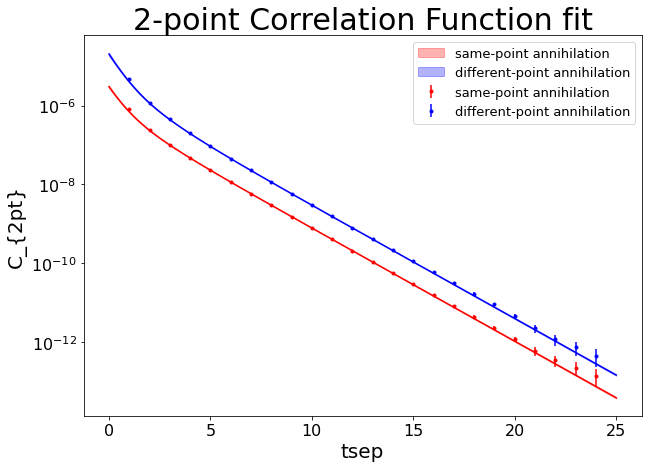

<Figure size 432x288 with 0 Axes>

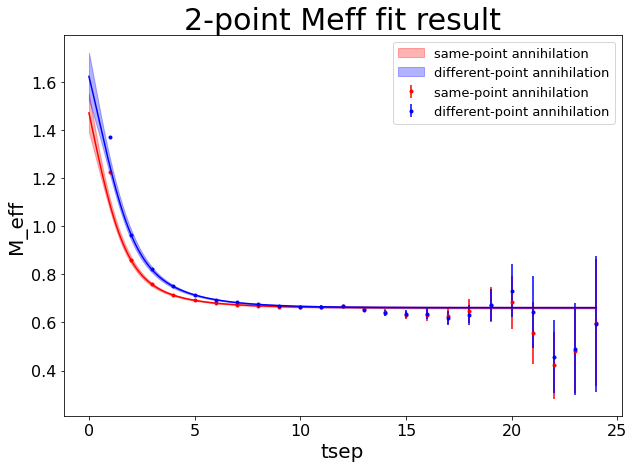

<Figure size 432x288 with 0 Axes>

In [101]:
# Plot the fits

t_plot = np.array([i for i in range(1, 25)])
x_raw2pt = np.array([t_plot, t_plot])
y_raw2pt_mean = np.array([[gv_avg_data['2pt_SS'][i].mean for i in t_plot], [gv_avg_data['2pt_PS'][i].mean for i in t_plot]])
y_raw2pt_sdev = np.array([[gv_avg_data['2pt_SS'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS'][i].sdev for i in t_plot]])
y_2ptmeff_mean = np.array([[gv_avg_data['2pt_SS_meff'][i].mean for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].mean for i in t_plot]])
y_2ptmeff_sdev = np.array([[gv_avg_data['2pt_SS_meff'][i].sdev for i in t_plot], [gv_avg_data['2pt_PS_meff'][i].sdev for i in t_plot]])

x_raw2pt_fit = np.array([tsep_model, tsep_model])
y_raw2pt_fit_mean = np.array([C2ptSS_model_mean, C2ptPS_model_mean])
y_raw2pt_fit_upper = np.array([C2ptSS_model_upbound, C2ptPS_model_upbound])
y_raw2pt_fit_lower = np.array([C2ptSS_model_lowbound, C2ptPS_model_lowbound])
h5_dm.fit_data_plot("2-point Correlation Function fit", "tsep", "C_{2pt}", x_raw2pt, y_raw2pt_mean, x_raw2pt_fit, y_raw2pt_fit_mean, y_raw2pt_fit_upper, y_raw2pt_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_raw2pt_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"], logy = True)

y_2ptmeff_fit_mean = np.array([SS_meff_model_mean, PS_meff_model_mean])
y_2ptmeff_fit_upper = np.array([SS_meff_model_upbound, PS_meff_model_upbound])
y_2ptmeff_fit_lower = np.array([SS_meff_model_lowbound, PS_meff_model_lowbound])

#print(np.shape(x_raw2pt))
#print(np.shape(y_2ptmeff_mean))
#print(np.shape(x_raw2pt_fit[:,:-step_up]))
#print(np.shape(y_2ptmeff_fit_mean))
#print(np.shape(y_2ptmeff_fit_upper))
#print(np.shape(y_2ptmeff_fit_lower))
#print(np.shape(y_2ptmeff_sdev))

h5_dm.fit_data_plot("2-point Meff fit result", "tsep", "M_eff", x_raw2pt, y_2ptmeff_mean, x_raw2pt_fit[:,:-step_up], y_2ptmeff_fit_mean, y_2ptmeff_fit_upper, y_2ptmeff_fit_lower, ['red', 'blue'], 30, 20, 16, 13, ylim = None, nplots = 2, ydat_error = y_2ptmeff_sdev, datalabels = ["same-point annihilation", "different-point annihilation"], fitlabels = ["same-point annihilation", "different-point annihilation"])

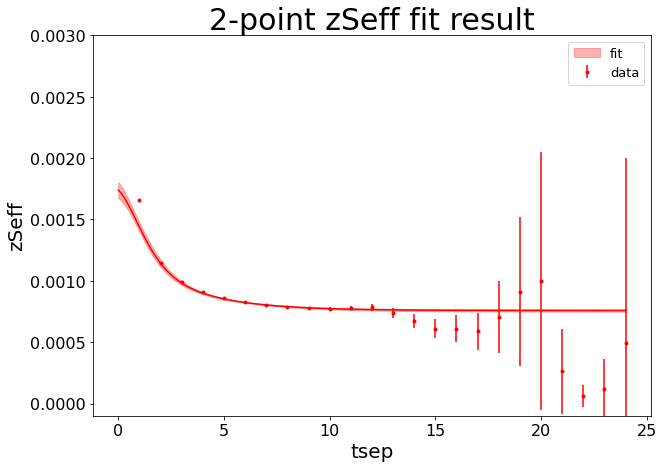

<Figure size 432x288 with 0 Axes>

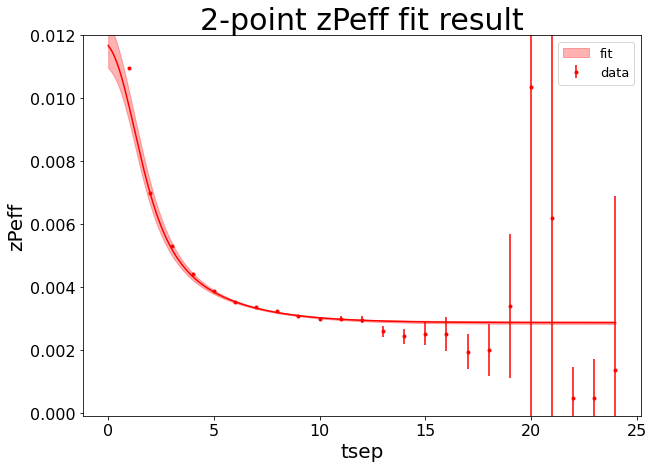

<Figure size 432x288 with 0 Axes>

In [102]:
h5_dm.fit_data_plot("2-point zSeff fit result", "tsep", "zSeff", x_raw2pt[0], [gv_avg_data['2pt_zSeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zSeff_model_mean, zSeff_model_upbound, zSeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.003], ydat_error = [gv_avg_data['2pt_zSeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")
h5_dm.fit_data_plot("2-point zPeff fit result", "tsep", "zPeff", x_raw2pt[1], [gv_avg_data['2pt_zPeff'][i].mean for i in t_plot], x_raw2pt_fit[0,:-step_up], zPeff_model_mean, zPeff_model_upbound, zPeff_model_lowbound, "red", 30, 20, 16, 13, ylim=[-0.0001, 0.012], ydat_error = [gv_avg_data['2pt_zPeff'][i].sdev for i in t_plot], datalabels = "data", fitlabels = "fit")

<ipython-input-103-0cb77ae660ac>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-103-0cb77ae660ac>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
<ipython-input-103-0cb77ae660ac>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of

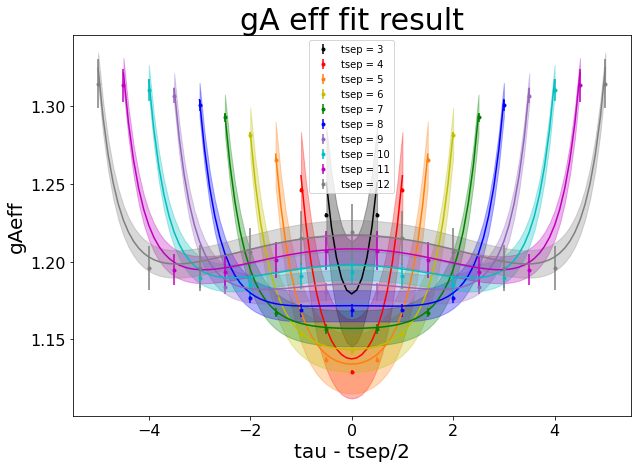

<Figure size 432x288 with 0 Axes>

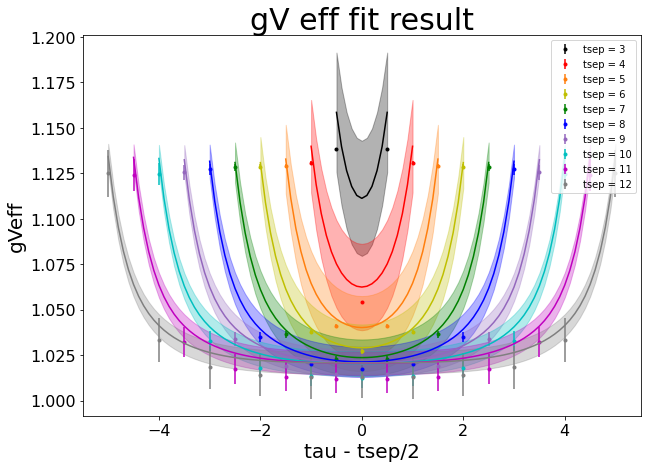

<Figure size 432x288 with 0 Axes>

In [103]:
# The color pallete for plotting the 3-point correlation function
colors_3pt = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey'])

# The raw dataset fitted to
x_3pt = np.array([[j - (i+3)/2. for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].mean for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_A3_err = np.array([ np.array([gv_avg_data['C_ratio_A3'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_A3'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4 = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].mean for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])
y_3pt_V4_err = np.array([ np.array([gv_avg_data['C_ratio_V4'][i][j].sdev for j in range(len(gv_avg_data['C_ratio_V4'][i]))]) for i in range(len(tsep_vals))])

h5_dm.fit_data_plot("gA eff fit result", "tau - tsep/2", "gAeff", x_3pt, y_3pt_A3, t_3pt_tseptau_diff, model_A3_ratio_2d_mean, model_A3_ratio_2d_upbound, model_A3_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_A3']), ydat_error=y_3pt_A3_err, datalabels = legendlabels_3pt) 
h5_dm.fit_data_plot("gV eff fit result", "tau - tsep/2", "gVeff", x_3pt, y_3pt_V4, t_3pt_tseptau_diff, model_V4_ratio_2d_mean, model_V4_ratio_2d_upbound, model_V4_ratio_2d_lowbound, colors_3pt, 30, 20, 16, 13, nplots = len(gv_avg_data['C_ratio_V4']), ydat_error=y_3pt_V4_err, datalabels = legendlabels_3pt) 

#### Now, vary the width of the first excited state, the tau-bounds (calculated as distance from 0 of the minimum and from tsep of the maximum

Set the arrays over which to loop over and the priors and 3-point data-sets to use at each iteration

In [106]:
# Create arrays for the parameters that will be varied
b = np.array([0.1, 0.3, 0.5, 0.7, 1.0])
#tsep_mins = np.array([3, 7, 10])
tau_cuts = np.arange(1,4,1)
n_z_vals = np.arange(3,8,1)
n_FH_vals = np.array([2, 3])

n_zFH_combined = np.arange(6, 16, 1) # these n-values are there to encode both num_zs and n_FH
zFH_splitted = 2 #The number such that n_zFH_combined/2 is num_zs and (n_zFH_combined % 2) + 2 is num_states_FH

In [52]:
# set priors for each dE-set, num-z set, and num-FH-set
priors = []
for i in range(3):
    priors.append([])
    for j in range(len(b)):
        priors[i].append([])
        for k in range(len(n_zFH_combined)):
            priors[i][j].append(gv.BufferDict())
            
            num_zs = n_zFH_combined[k]//2
            num_states_FH = n_zFH_combined[k] % 2 + 2
            e_decay_exp = i
            
            priors[i][j][k]['E0'] = gv.gvar(0.67, 0.02)
            priors[i][j][k]['Z0'] = gv.gvar(0.0008, 0.0003)
            priors[i][j][k]['Ztilde0'] = gv.gvar(0.003, 0.003)

            # Define some constants for prioring the higher-order energies
            dE0 = 2*mpi

            # Use constant dE to prior the energies
            energyvals = np.array([None]*num_zs)
            dEvals = np.array([None]*(num_zs - 1))

            #E0_errbar = 0.8
            energyvals[0] = gv.gvar(0.67, 0.02)
            for n in range(1, num_zs):
                dEvals[n-1] = dE0/np.power(n, e_decay_exp)
                energyvals[n] = energyvals[n-1] + dEvals[n-1]
            
            priors[i][j][k]['log(dE1)'] = gv.gvar(np.log(dEvals[0]), b[j])
            priors[i][j][k]['Z1'] = gv.gvar(0.0012, 0.0006)
            priors[i][j][k]['Ztilde1'] = gv.gvar(0, 0.01)
            
            for n in range(2, num_zs):
                priors[i][j][k]['log(dE{})'.format(n)] = gv.gvar(np.log(dEvals[n-1]), 0.7)
                priors[i][j][k]['Z{}'.format(n)] = gv.gvar(0.0012, 0.0006)
                priors[i][j][k]['Ztilde{}'.format(n)] = gv.gvar(0, 0.01)


            for n in range(num_zs):
                for m in range(num_zs):
        
                    priors[i][j][k]['gA3_{0}{1}'.format(n, m)] = gv.gvar(0, 2)
                    if n == m and n < num_zs-1:
                        priors[i][j][k]['gV4_{0}{1}'.format(n, m)] = gv.gvar(1, 0.1)
                    else:
                        priors[i][j][k]['gV4_{0}{1}'.format(n, m)] = gv.gvar(0, 2)

            priors[i][j][k]['gA3_00'] = gv.gvar(1.25, 0.15)
            priors[i][j][k]['gV4_00'] = gv.gvar(1.07, 0.07)

            # Set the "garbage can" for the Feynman Hellman fit
            #priors[i][j][k]['Z_FHmax'] = gv.gvar(0.0008, 0.0004)
            #if num_states_FH == 2:
                #priors[i][j][k]['log(FH_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), b[j])
            #else:
                #priors[i][j][k]['log(FH_dEmax)'] = gv.gvar(np.log(dEvals[num_states_FH - 2]), 0.7)

            #for n in range(num_states_FH-1):
                #priors[i][j][k]['gA3_FHmax{}'.format(n)] = gv.gvar(1, 2)
                #priors[i][j][k]['gA3_{}FHmax'.format(n)] = gv.gvar(1, 2)
                #priors[i][j][k]['gV4_FHmax{}'.format(n)] = gv.gvar(0, 2)
                #priors[i][j][k]['gV4_{}FHmax'.format(n)] = gv.gvar(0, 2)
    
            #priors[i][j][k]['gA3_FHmaxFHmax'] = gv.gvar(1, 2)
            #priors[i][j][k]['gV4_FHmaxFHmax'] = gv.gvar(0, 2)
            
            

In [53]:
list_LogGBF_a0_2pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_LogGBF_a0_3pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_Q_a0_2pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_Q_a0_3pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_E0_a0 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gA00_a0 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gV00_a0 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))

list_LogGBF_a1_2pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_LogGBF_a1_3pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_Q_a1_2pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_Q_a1_3pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_E0_a1 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gA00_a1 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gV00_a1 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))

list_LogGBF_a2_2pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_LogGBF_a2_3pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_Q_a2_2pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_Q_a2_3pt = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_E0_a2 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gA00_a2 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gV00_a2 = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))


In [54]:
# Create 3-point datasets for each tau-cut data set
tau_cut_to_min_tsep = np.array([3, 4, 6])
x_vals_3fit = []
y_vals_3fit = []

y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_A3 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_A3_2d)
y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
y_3pt_V4 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_V4_2d)

y_3pt = np.transpose(np.array([[y_3pt_A3], [y_3pt_V4]]), axes=[2,0,1])

for i in range(len(tau_cuts)):
    x_vals_3fit.append([])
    y_vals_3fit.append([])
    
    for k in range(len(t_1d_array)):
        if(t_1d_array[k][0] >= tau_cut_to_min_tsep[i]):
            if(t_1d_array[k][1] >= tau_cuts[i]):
                if(t_1d_array[k][1] <= t_1d_array[k][0] - tau_cuts[i]):
                    x_vals_3fit[i].append(t_1d_array[k].tolist())
                    y_vals_3fit[i].append(y_3pt[k].tolist())
                            
    x_vals_3fit[i] = np.array(x_vals_3fit[i])
    y_vals_3fit[i] = np.array(y_vals_3fit[i])

<ipython-input-54-08317326869e>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
<ipython-input-54-08317326869e>:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])


In [55]:
for i in range(len(b)):
    for j in range(len(tau_cuts)):
        for k in range(len(n_zFH_combined)):
            num_zs = n_zFH_combined[k]//2
            num_states_FH = n_zFH_combined[k] % 2 + 2
            
            fit_a0_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=priors[0][i][k],fcn=C_2pt,debug=True)
            fit_a1_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=priors[1][i][k],fcn=C_2pt,debug=True)
            fit_a2_2pt = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 13)]), np.array([[ [c] for c in gv_avg_data['2pt'][l]] for l in range(2,13)]) ), prior=priors[2][i][k],fcn=C_2pt,debug=True)
                
            fit_a0 = lsqfit.nonlinear_fit(data=(x_vals_3fit[j], y_vals_3fit[j]), prior=fit_a0_2pt.p,fcn=C_3pt,debug=True)
            fit_a1 = lsqfit.nonlinear_fit(data=(x_vals_3fit[j], y_vals_3fit[j]), prior=fit_a1_2pt.p,fcn=C_3pt,debug=True)
            fit_a2 = lsqfit.nonlinear_fit(data=(x_vals_3fit[j], y_vals_3fit[j]), prior=fit_a2_2pt.p,fcn=C_3pt,debug=True)
            
            print("dE constant, lod(dE1) bound = ", b[i], " tau_cuts = ", tau_cuts[j], " num_zs = ", num_zs, " num_states_FH = ", num_states_FH)
            print(fit_a0_2pt.format(pstyle='vv')) 
            print(fit_a0.format(pstyle='vv'))    
            list_LogGBF_a0_2pt[i][j][k] = fit_a0_2pt.logGBF
            list_LogGBF_a0_3pt[i][j][k] = fit_a0.logGBF
            list_Q_a0_2pt[i][j][k] = fit_a0_2pt.Q
            list_Q_a0_3pt[i][j][k] = fit_a0.Q
            list_E0_a0[i][j][k] = fit_a0.p['E0']
            list_gA00_a0[i][j][k] = fit_a0.p['gA3_00']
            list_gV00_a0[i][j][k] = fit_a0.p['gV4_00']
                
            print("dE proportional to 1/n, log(dE1) bound = ", b[i], " tau_cuts = ", tau_cuts[j], " num_zs = ", num_zs, " num_states_FH = ", num_states_FH)
            print(fit_a1_2pt.format(pstyle='vv')) 
            print(fit_a1.format(pstyle='vv')) 
            list_LogGBF_a1_2pt[i][j][k] = fit_a1_2pt.logGBF
            list_LogGBF_a1_3pt[i][j][k] = fit_a1.logGBF
            list_Q_a1_2pt[i][j][k] = fit_a1_2pt.Q
            list_Q_a1_3pt[i][j][k] = fit_a1.Q
            list_E0_a1[i][j][k] = fit_a1.p['E0']
            list_gA00_a1[i][j][k] = fit_a1.p['gA3_00']
            list_gV00_a1[i][j][k] = fit_a1.p['gV4_00']
                
            print("dE proportional to 1/n^2, log(dE1) bound = ", b[i], " tau_cuts = ", tau_cuts[j], " num_zs = ", num_zs, " num_states_FH = ", num_states_FH)
            print(fit_a2_2pt.format(pstyle='vv'))
            print(fit_a2.format(pstyle='vv'))
            list_LogGBF_a2_2pt[i][j][k] = fit_a2_2pt.logGBF
            list_LogGBF_a2_3pt[i][j][k] = fit_a2.logGBF
            list_Q_a2_2pt[i][j][k] = fit_a2_2pt.Q
            list_Q_a2_3pt[i][j][k] = fit_a2.Q
            list_E0_a2[i][j][k] = fit_a2.p['E0']
            list_gA00_a2[i][j][k] = fit_a2.p['gA3_00']
            list_gV00_a2[i][j][k] = fit_a2.p['gV4_00']
                


dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.4    logGBF = 485.58

Parameters:
             E0       0.660763 +- 0.00194013             [     0.67 +- 0.02 ]  
             Z0   0.000755481 +- 6.18476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285135 +- 2.8959e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.8198 +- 0.0578138             [  -0.97551 +- 0.1 ]  *
             Z1   0.000679381 +- 3.50719e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0045985 +- 0.000250554             [        0 +- 0.01 ]  
       log(dE2)       -0.125217 +- 0.0425782             [  -0.97551 +- 0.7 ]  *
             Z2    0.00132388 +- 1.75388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00984182 +- 0.000188411             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00             

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.4    logGBF = 485.58

Parameters:
             E0       0.660763 +- 0.00194013             [     0.67 +- 0.02 ]  
             Z0   0.000755481 +- 6.18476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285135 +- 2.8959e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.8198 +- 0.0578138             [  -0.97551 +- 0.1 ]  *
             Z1   0.000679381 +- 3.50719e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0045985 +- 0.000250554             [        0 +- 0.01 ]  
       log(dE2)       -0.125217 +- 0.0425782             [  -0.97551 +- 0.7 ]  *
             Z2    0.00132388 +- 1.75388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00984182 +- 0.000188411             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00             

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.77

Parameters:
             E0        0.66017 +- 0.00311819             [     0.67 +- 0.02 ]  
             Z0   0.000752509 +- 1.16599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283822 +- 4.98331e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.964082 +- 0.0958084             [  -0.97551 +- 0.1 ]  
             Z1   0.000558573 +- 9.46835e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00363474 +- 0.000563347             [        0 +- 0.01 ]  
       log(dE2)        -0.766081 +- 0.488679             [  -0.97551 +- 0.7 ]  
             Z2   0.000778734 +- 0.000296933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579599 +- 0.00217274             [        0 +- 0.01 ]  
       log(dE3)        -0.234379 +- 0.312777             [  -0.97551 +- 0.7 ]  *
             Z3     0.00

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.77

Parameters:
             E0        0.66017 +- 0.00311819             [     0.67 +- 0.02 ]  
             Z0   0.000752509 +- 1.16599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283822 +- 4.98331e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.964082 +- 0.0958084             [  -0.97551 +- 0.1 ]  
             Z1   0.000558573 +- 9.46835e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00363474 +- 0.000563347             [        0 +- 0.01 ]  
       log(dE2)        -0.766081 +- 0.488679             [  -0.97551 +- 0.7 ]  
             Z2   0.000778734 +- 0.000296933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579599 +- 0.00217274             [        0 +- 0.01 ]  
       log(dE3)        -0.234379 +- 0.312777             [  -0.97551 +- 0.7 ]  *
             Z3     0.00

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.87

Parameters:
             E0       0.659605 +- 0.00329025             [     0.67 +- 0.02 ]  
             Z0   0.000749922 +- 1.26049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282888 +- 5.29096e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.979227 +- 0.0971999             [  -0.97551 +- 0.1 ]  
             Z1   0.000569519 +- 8.43534e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00356033 +- 0.000528734             [        0 +- 0.01 ]  
       log(dE2)        -0.713988 +- 0.424306             [  -0.97551 +- 0.7 ]  
             Z2   0.000742327 +- 0.000315844             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649232 +- 0.00254085             [        0 +- 0.01 ]  
       log(dE3)        -0.698063 +- 0.559189             [  -0.97551 +- 0.7 ]  
             Z3   0.000825

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.87

Parameters:
             E0       0.659605 +- 0.00329025             [     0.67 +- 0.02 ]  
             Z0   0.000749922 +- 1.26049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282888 +- 5.29096e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.979227 +- 0.0971999             [  -0.97551 +- 0.1 ]  
             Z1   0.000569519 +- 8.43534e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00356033 +- 0.000528734             [        0 +- 0.01 ]  
       log(dE2)        -0.713988 +- 0.424306             [  -0.97551 +- 0.7 ]  
             Z2   0.000742327 +- 0.000315844             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649232 +- 0.00254085             [        0 +- 0.01 ]  
       log(dE3)        -0.698063 +- 0.559189             [  -0.97551 +- 0.7 ]  
             Z3   0.000825

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.5

Parameters:
             E0       0.659839 +- 0.00334305             [     0.67 +- 0.02 ]  
             Z0   0.000750893 +- 1.28799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283276 +- 5.40395e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.982934 +- 0.0975408             [  -0.97551 +- 0.1 ]  
             Z1   0.000559628 +- 9.08169e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00352605 +- 0.000536794             [        0 +- 0.01 ]  
       log(dE2)        -0.726969 +- 0.440483             [  -0.97551 +- 0.7 ]  
             Z2     0.000751501 +- 0.0003099             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00638306 +- 0.00277991             [        0 +- 0.01 ]  
       log(dE3)        -0.833254 +- 0.620911             [  -0.97551 +- 0.7 ]  
             Z3   0.000736

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.5

Parameters:
             E0       0.659839 +- 0.00334305             [     0.67 +- 0.02 ]  
             Z0   0.000750893 +- 1.28799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283276 +- 5.40395e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.982934 +- 0.0975408             [  -0.97551 +- 0.1 ]  
             Z1   0.000559628 +- 9.08169e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00352605 +- 0.000536794             [        0 +- 0.01 ]  
       log(dE2)        -0.726969 +- 0.440483             [  -0.97551 +- 0.7 ]  
             Z2     0.000751501 +- 0.0003099             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00638306 +- 0.00277991             [        0 +- 0.01 ]  
       log(dE3)        -0.833254 +- 0.620911             [  -0.97551 +- 0.7 ]  
             Z3   0.000736

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 484.01

Parameters:
             E0       0.660121 +- 0.00338817             [     0.67 +- 0.02 ]  
             Z0   0.000752082 +- 1.31002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283726 +- 5.49669e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.983415 +- 0.0975814             [  -0.97551 +- 0.1 ]  
             Z1   0.000550927 +- 9.69924e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351932 +- 0.000537723             [        0 +- 0.01 ]  
       log(dE2)        -0.722836 +- 0.434256             [  -0.97551 +- 0.7 ]  
             Z2   0.000780238 +- 0.000294295             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00632795 +- 0.00276443             [        0 +- 0.01 ]  
       log(dE3)        -0.856224 +- 0.650658             [  -0.97551 +- 0.7 ]  
             Z3   0.00071

dE constant, lod(dE1) bound =  0.1  tau_cuts =  1  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 484.01

Parameters:
             E0       0.660121 +- 0.00338817             [     0.67 +- 0.02 ]  
             Z0   0.000752082 +- 1.31002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283726 +- 5.49669e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.983415 +- 0.0975814             [  -0.97551 +- 0.1 ]  
             Z1   0.000550927 +- 9.69924e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351932 +- 0.000537723             [        0 +- 0.01 ]  
       log(dE2)        -0.722836 +- 0.434256             [  -0.97551 +- 0.7 ]  
             Z2   0.000780238 +- 0.000294295             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00632795 +- 0.00276443             [        0 +- 0.01 ]  
       log(dE3)        -0.856224 +- 0.650658             [  -0.97551 +- 0.7 ]  
             Z3   0.00071

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.4    logGBF = 485.58

Parameters:
             E0       0.660763 +- 0.00194013             [     0.67 +- 0.02 ]  
             Z0   0.000755481 +- 6.18476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285135 +- 2.8959e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.8198 +- 0.0578138             [  -0.97551 +- 0.1 ]  *
             Z1   0.000679381 +- 3.50719e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0045985 +- 0.000250554             [        0 +- 0.01 ]  
       log(dE2)       -0.125217 +- 0.0425782             [  -0.97551 +- 0.7 ]  *
             Z2    0.00132388 +- 1.75388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00984182 +- 0.000188411             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00             

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.4    logGBF = 485.58

Parameters:
             E0       0.660763 +- 0.00194013             [     0.67 +- 0.02 ]  
             Z0   0.000755481 +- 6.18476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285135 +- 2.8959e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.8198 +- 0.0578138             [  -0.97551 +- 0.1 ]  *
             Z1   0.000679381 +- 3.50719e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0045985 +- 0.000250554             [        0 +- 0.01 ]  
       log(dE2)       -0.125217 +- 0.0425782             [  -0.97551 +- 0.7 ]  *
             Z2    0.00132388 +- 1.75388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00984182 +- 0.000188411             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00             

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.77

Parameters:
             E0        0.66017 +- 0.00311819             [     0.67 +- 0.02 ]  
             Z0   0.000752509 +- 1.16599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283822 +- 4.98331e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.964082 +- 0.0958084             [  -0.97551 +- 0.1 ]  
             Z1   0.000558573 +- 9.46835e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00363474 +- 0.000563347             [        0 +- 0.01 ]  
       log(dE2)        -0.766081 +- 0.488679             [  -0.97551 +- 0.7 ]  
             Z2   0.000778734 +- 0.000296933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579599 +- 0.00217274             [        0 +- 0.01 ]  
       log(dE3)        -0.234379 +- 0.312777             [  -0.97551 +- 0.7 ]  *
             Z3     0.00

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.77

Parameters:
             E0        0.66017 +- 0.00311819             [     0.67 +- 0.02 ]  
             Z0   0.000752509 +- 1.16599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283822 +- 4.98331e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.964082 +- 0.0958084             [  -0.97551 +- 0.1 ]  
             Z1   0.000558573 +- 9.46835e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00363474 +- 0.000563347             [        0 +- 0.01 ]  
       log(dE2)        -0.766081 +- 0.488679             [  -0.97551 +- 0.7 ]  
             Z2   0.000778734 +- 0.000296933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579599 +- 0.00217274             [        0 +- 0.01 ]  
       log(dE3)        -0.234379 +- 0.312777             [  -0.97551 +- 0.7 ]  *
             Z3     0.00

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.87

Parameters:
             E0       0.659605 +- 0.00329025             [     0.67 +- 0.02 ]  
             Z0   0.000749922 +- 1.26049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282888 +- 5.29096e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.979227 +- 0.0971999             [  -0.97551 +- 0.1 ]  
             Z1   0.000569519 +- 8.43534e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00356033 +- 0.000528734             [        0 +- 0.01 ]  
       log(dE2)        -0.713988 +- 0.424306             [  -0.97551 +- 0.7 ]  
             Z2   0.000742327 +- 0.000315844             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649232 +- 0.00254085             [        0 +- 0.01 ]  
       log(dE3)        -0.698063 +- 0.559189             [  -0.97551 +- 0.7 ]  
             Z3   0.000825

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.87

Parameters:
             E0       0.659605 +- 0.00329025             [     0.67 +- 0.02 ]  
             Z0   0.000749922 +- 1.26049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282888 +- 5.29096e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.979227 +- 0.0971999             [  -0.97551 +- 0.1 ]  
             Z1   0.000569519 +- 8.43534e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00356033 +- 0.000528734             [        0 +- 0.01 ]  
       log(dE2)        -0.713988 +- 0.424306             [  -0.97551 +- 0.7 ]  
             Z2   0.000742327 +- 0.000315844             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649232 +- 0.00254085             [        0 +- 0.01 ]  
       log(dE3)        -0.698063 +- 0.559189             [  -0.97551 +- 0.7 ]  
             Z3   0.000825

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.5

Parameters:
             E0       0.659839 +- 0.00334305             [     0.67 +- 0.02 ]  
             Z0   0.000750893 +- 1.28799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283276 +- 5.40395e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.982934 +- 0.0975408             [  -0.97551 +- 0.1 ]  
             Z1   0.000559628 +- 9.08169e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00352605 +- 0.000536794             [        0 +- 0.01 ]  
       log(dE2)        -0.726969 +- 0.440483             [  -0.97551 +- 0.7 ]  
             Z2     0.000751501 +- 0.0003099             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00638306 +- 0.00277991             [        0 +- 0.01 ]  
       log(dE3)        -0.833254 +- 0.620911             [  -0.97551 +- 0.7 ]  
             Z3   0.000736

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.5

Parameters:
             E0       0.659839 +- 0.00334305             [     0.67 +- 0.02 ]  
             Z0   0.000750893 +- 1.28799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283276 +- 5.40395e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.982934 +- 0.0975408             [  -0.97551 +- 0.1 ]  
             Z1   0.000559628 +- 9.08169e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00352605 +- 0.000536794             [        0 +- 0.01 ]  
       log(dE2)        -0.726969 +- 0.440483             [  -0.97551 +- 0.7 ]  
             Z2     0.000751501 +- 0.0003099             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00638306 +- 0.00277991             [        0 +- 0.01 ]  
       log(dE3)        -0.833254 +- 0.620911             [  -0.97551 +- 0.7 ]  
             Z3   0.000736

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 484.01

Parameters:
             E0       0.660121 +- 0.00338817             [     0.67 +- 0.02 ]  
             Z0   0.000752082 +- 1.31002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283726 +- 5.49669e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.983415 +- 0.0975814             [  -0.97551 +- 0.1 ]  
             Z1   0.000550927 +- 9.69924e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351932 +- 0.000537723             [        0 +- 0.01 ]  
       log(dE2)        -0.722836 +- 0.434256             [  -0.97551 +- 0.7 ]  
             Z2   0.000780238 +- 0.000294295             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00632795 +- 0.00276443             [        0 +- 0.01 ]  
       log(dE3)        -0.856224 +- 0.650658             [  -0.97551 +- 0.7 ]  
             Z3   0.00071

dE constant, lod(dE1) bound =  0.1  tau_cuts =  2  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 484.01

Parameters:
             E0       0.660121 +- 0.00338817             [     0.67 +- 0.02 ]  
             Z0   0.000752082 +- 1.31002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283726 +- 5.49669e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.983415 +- 0.0975814             [  -0.97551 +- 0.1 ]  
             Z1   0.000550927 +- 9.69924e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351932 +- 0.000537723             [        0 +- 0.01 ]  
       log(dE2)        -0.722836 +- 0.434256             [  -0.97551 +- 0.7 ]  
             Z2   0.000780238 +- 0.000294295             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00632795 +- 0.00276443             [        0 +- 0.01 ]  
       log(dE3)        -0.856224 +- 0.650658             [  -0.97551 +- 0.7 ]  
             Z3   0.00071

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.4    logGBF = 485.58

Parameters:
             E0       0.660763 +- 0.00194013             [     0.67 +- 0.02 ]  
             Z0   0.000755481 +- 6.18476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285135 +- 2.8959e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.8198 +- 0.0578138             [  -0.97551 +- 0.1 ]  *
             Z1   0.000679381 +- 3.50719e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0045985 +- 0.000250554             [        0 +- 0.01 ]  
       log(dE2)       -0.125217 +- 0.0425782             [  -0.97551 +- 0.7 ]  *
             Z2    0.00132388 +- 1.75388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00984182 +- 0.000188411             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00             

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.4    logGBF = 485.58

Parameters:
             E0       0.660763 +- 0.00194013             [     0.67 +- 0.02 ]  
             Z0   0.000755481 +- 6.18476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285135 +- 2.8959e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.8198 +- 0.0578138             [  -0.97551 +- 0.1 ]  *
             Z1   0.000679381 +- 3.50719e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0045985 +- 0.000250554             [        0 +- 0.01 ]  
       log(dE2)       -0.125217 +- 0.0425782             [  -0.97551 +- 0.7 ]  *
             Z2    0.00132388 +- 1.75388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00984182 +- 0.000188411             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00             

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.77

Parameters:
             E0        0.66017 +- 0.00311819             [     0.67 +- 0.02 ]  
             Z0   0.000752509 +- 1.16599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283822 +- 4.98331e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.964082 +- 0.0958084             [  -0.97551 +- 0.1 ]  
             Z1   0.000558573 +- 9.46835e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00363474 +- 0.000563347             [        0 +- 0.01 ]  
       log(dE2)        -0.766081 +- 0.488679             [  -0.97551 +- 0.7 ]  
             Z2   0.000778734 +- 0.000296933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579599 +- 0.00217274             [        0 +- 0.01 ]  
       log(dE3)        -0.234379 +- 0.312777             [  -0.97551 +- 0.7 ]  *
             Z3     0.00

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.77

Parameters:
             E0        0.66017 +- 0.00311819             [     0.67 +- 0.02 ]  
             Z0   0.000752509 +- 1.16599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283822 +- 4.98331e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.964082 +- 0.0958084             [  -0.97551 +- 0.1 ]  
             Z1   0.000558573 +- 9.46835e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00363474 +- 0.000563347             [        0 +- 0.01 ]  
       log(dE2)        -0.766081 +- 0.488679             [  -0.97551 +- 0.7 ]  
             Z2   0.000778734 +- 0.000296933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579599 +- 0.00217274             [        0 +- 0.01 ]  
       log(dE3)        -0.234379 +- 0.312777             [  -0.97551 +- 0.7 ]  *
             Z3     0.00

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.87

Parameters:
             E0       0.659605 +- 0.00329025             [     0.67 +- 0.02 ]  
             Z0   0.000749922 +- 1.26049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282888 +- 5.29096e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.979227 +- 0.0971999             [  -0.97551 +- 0.1 ]  
             Z1   0.000569519 +- 8.43534e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00356033 +- 0.000528734             [        0 +- 0.01 ]  
       log(dE2)        -0.713988 +- 0.424306             [  -0.97551 +- 0.7 ]  
             Z2   0.000742327 +- 0.000315844             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649232 +- 0.00254085             [        0 +- 0.01 ]  
       log(dE3)        -0.698063 +- 0.559189             [  -0.97551 +- 0.7 ]  
             Z3   0.000825

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.87

Parameters:
             E0       0.659605 +- 0.00329025             [     0.67 +- 0.02 ]  
             Z0   0.000749922 +- 1.26049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282888 +- 5.29096e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.979227 +- 0.0971999             [  -0.97551 +- 0.1 ]  
             Z1   0.000569519 +- 8.43534e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00356033 +- 0.000528734             [        0 +- 0.01 ]  
       log(dE2)        -0.713988 +- 0.424306             [  -0.97551 +- 0.7 ]  
             Z2   0.000742327 +- 0.000315844             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649232 +- 0.00254085             [        0 +- 0.01 ]  
       log(dE3)        -0.698063 +- 0.559189             [  -0.97551 +- 0.7 ]  
             Z3   0.000825

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.5

Parameters:
             E0       0.659839 +- 0.00334305             [     0.67 +- 0.02 ]  
             Z0   0.000750893 +- 1.28799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283276 +- 5.40395e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.982934 +- 0.0975408             [  -0.97551 +- 0.1 ]  
             Z1   0.000559628 +- 9.08169e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00352605 +- 0.000536794             [        0 +- 0.01 ]  
       log(dE2)        -0.726969 +- 0.440483             [  -0.97551 +- 0.7 ]  
             Z2     0.000751501 +- 0.0003099             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00638306 +- 0.00277991             [        0 +- 0.01 ]  
       log(dE3)        -0.833254 +- 0.620911             [  -0.97551 +- 0.7 ]  
             Z3   0.000736

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.5

Parameters:
             E0       0.659839 +- 0.00334305             [     0.67 +- 0.02 ]  
             Z0   0.000750893 +- 1.28799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283276 +- 5.40395e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.982934 +- 0.0975408             [  -0.97551 +- 0.1 ]  
             Z1   0.000559628 +- 9.08169e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00352605 +- 0.000536794             [        0 +- 0.01 ]  
       log(dE2)        -0.726969 +- 0.440483             [  -0.97551 +- 0.7 ]  
             Z2     0.000751501 +- 0.0003099             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00638306 +- 0.00277991             [        0 +- 0.01 ]  
       log(dE3)        -0.833254 +- 0.620911             [  -0.97551 +- 0.7 ]  
             Z3   0.000736

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 484.01

Parameters:
             E0       0.660121 +- 0.00338817             [     0.67 +- 0.02 ]  
             Z0   0.000752082 +- 1.31002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283726 +- 5.49669e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.983415 +- 0.0975814             [  -0.97551 +- 0.1 ]  
             Z1   0.000550927 +- 9.69924e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351932 +- 0.000537723             [        0 +- 0.01 ]  
       log(dE2)        -0.722836 +- 0.434256             [  -0.97551 +- 0.7 ]  
             Z2   0.000780238 +- 0.000294295             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00632795 +- 0.00276443             [        0 +- 0.01 ]  
       log(dE3)        -0.856224 +- 0.650658             [  -0.97551 +- 0.7 ]  
             Z3   0.00071

dE constant, lod(dE1) bound =  0.1  tau_cuts =  3  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 484.01

Parameters:
             E0       0.660121 +- 0.00338817             [     0.67 +- 0.02 ]  
             Z0   0.000752082 +- 1.31002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283726 +- 5.49669e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.983415 +- 0.0975814             [  -0.97551 +- 0.1 ]  
             Z1   0.000550927 +- 9.69924e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351932 +- 0.000537723             [        0 +- 0.01 ]  
       log(dE2)        -0.722836 +- 0.434256             [  -0.97551 +- 0.7 ]  
             Z2   0.000780238 +- 0.000294295             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00632795 +- 0.00276443             [        0 +- 0.01 ]  
       log(dE3)        -0.856224 +- 0.650658             [  -0.97551 +- 0.7 ]  
             Z3   0.00071

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 486.38

Parameters:
             E0         0.661262 +- 0.001864             [     0.67 +- 0.02 ]  
             Z0   0.000758267 +- 5.88992e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286826 +- 2.81426e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.750973 +- 0.0636921             [  -0.97551 +- 0.3 ]  
             Z1   0.000717035 +- 4.13974e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00490633 +- 0.000310126             [        0 +- 0.01 ]  
       log(dE2)      -0.0946006 +- 0.0542591             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133282 +- 2.32641e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991329 +- 0.000234581             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 486.38

Parameters:
             E0         0.661262 +- 0.001864             [     0.67 +- 0.02 ]  
             Z0   0.000758267 +- 5.88992e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286826 +- 2.81426e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.750973 +- 0.0636921             [  -0.97551 +- 0.3 ]  
             Z1   0.000717035 +- 4.13974e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00490633 +- 0.000310126             [        0 +- 0.01 ]  
       log(dE2)      -0.0946006 +- 0.0542591             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133282 +- 2.32641e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991329 +- 0.000234581             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 484.95

Parameters:
             E0       0.660577 +- 0.00300591             [     0.67 +- 0.02 ]  
             Z0    0.000754708 +- 1.1433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284953 +- 5.12123e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.882707 +- 0.174874             [  -0.97551 +- 0.3 ]  
             Z1   0.000611861 +- 0.000126893             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0040643 +- 0.000960595             [        0 +- 0.01 ]  
       log(dE2)        -0.663524 +- 0.517413             [  -0.97551 +- 0.7 ]  
             Z2   0.000777956 +- 0.000357367             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00580809 +- 0.00263897             [        0 +- 0.01 ]  
       log(dE3)        -0.343374 +- 0.451878             [  -0.97551 +- 0.7 ]  
             Z3    0.00124

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 484.95

Parameters:
             E0       0.660577 +- 0.00300591             [     0.67 +- 0.02 ]  
             Z0    0.000754708 +- 1.1433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284953 +- 5.12123e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.882707 +- 0.174874             [  -0.97551 +- 0.3 ]  
             Z1   0.000611861 +- 0.000126893             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0040643 +- 0.000960595             [        0 +- 0.01 ]  
       log(dE2)        -0.663524 +- 0.517413             [  -0.97551 +- 0.7 ]  
             Z2   0.000777956 +- 0.000357367             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00580809 +- 0.00263897             [        0 +- 0.01 ]  
       log(dE3)        -0.343374 +- 0.451878             [  -0.97551 +- 0.7 ]  
             Z3    0.00124

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.59

Parameters:
             E0       0.659435 +- 0.00390573             [     0.67 +- 0.02 ]  
             Z0   0.000749046 +- 1.65637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 7.17336e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.99783 +- 0.248314             [  -0.97551 +- 0.3 ]  
             Z1    0.000561969 +- 0.00012922             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348387 +- 0.00110222             [        0 +- 0.01 ]  
       log(dE2)        -0.718406 +- 0.440565             [  -0.97551 +- 0.7 ]  
             Z2    0.00074424 +- 0.000309818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653126 +- 0.00249658             [        0 +- 0.01 ]  
       log(dE3)        -0.690859 +- 0.560515             [  -0.97551 +- 0.7 ]  
             Z3      0.000

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.59

Parameters:
             E0       0.659435 +- 0.00390573             [     0.67 +- 0.02 ]  
             Z0   0.000749046 +- 1.65637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 7.17336e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.99783 +- 0.248314             [  -0.97551 +- 0.3 ]  
             Z1    0.000561969 +- 0.00012922             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348387 +- 0.00110222             [        0 +- 0.01 ]  
       log(dE2)        -0.718406 +- 0.440565             [  -0.97551 +- 0.7 ]  
             Z2    0.00074424 +- 0.000309818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653126 +- 0.00249658             [        0 +- 0.01 ]  
       log(dE3)        -0.690859 +- 0.560515             [  -0.97551 +- 0.7 ]  
             Z3      0.000

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.15

Parameters:
             E0       0.659522 +- 0.00395257             [     0.67 +- 0.02 ]  
             Z0   0.000749254 +- 1.68334e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 7.28433e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01826 +- 0.257059             [  -0.97551 +- 0.3 ]  
             Z1   0.000546054 +- 0.000135628             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338666 +- 0.00110453             [        0 +- 0.01 ]  
       log(dE2)          -0.73134 +- 0.44665             [  -0.97551 +- 0.7 ]  
             Z2    0.000754253 +- 0.00030153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00646777 +- 0.00270635             [        0 +- 0.01 ]  
       log(dE3)        -0.824995 +- 0.618221             [  -0.97551 +- 0.7 ]  
             Z3      0.00

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.15

Parameters:
             E0       0.659522 +- 0.00395257             [     0.67 +- 0.02 ]  
             Z0   0.000749254 +- 1.68334e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 7.28433e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01826 +- 0.257059             [  -0.97551 +- 0.3 ]  
             Z1   0.000546054 +- 0.000135628             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338666 +- 0.00110453             [        0 +- 0.01 ]  
       log(dE2)          -0.73134 +- 0.44665             [  -0.97551 +- 0.7 ]  
             Z2    0.000754253 +- 0.00030153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00646777 +- 0.00270635             [        0 +- 0.01 ]  
       log(dE3)        -0.824995 +- 0.618221             [  -0.97551 +- 0.7 ]  
             Z3      0.00

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.66

Parameters:
             E0       0.659793 +- 0.00390366             [     0.67 +- 0.02 ]  
             Z0   0.000750389 +- 1.65108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282935 +- 7.16289e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02135 +- 0.258219             [  -0.97551 +- 0.3 ]  
             Z1   0.000536467 +- 0.000142419             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336976 +- 0.00110632             [        0 +- 0.01 ]  
       log(dE2)        -0.727832 +- 0.439049             [  -0.97551 +- 0.7 ]  
             Z2   0.000779732 +- 0.000290216             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00641512 +- 0.0026987             [        0 +- 0.01 ]  
       log(dE3)        -0.855403 +- 0.648734             [  -0.97551 +- 0.7 ]  
             Z3   0.000713

dE constant, lod(dE1) bound =  0.3  tau_cuts =  1  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.66

Parameters:
             E0       0.659793 +- 0.00390366             [     0.67 +- 0.02 ]  
             Z0   0.000750389 +- 1.65108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282935 +- 7.16289e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02135 +- 0.258219             [  -0.97551 +- 0.3 ]  
             Z1   0.000536467 +- 0.000142419             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336976 +- 0.00110632             [        0 +- 0.01 ]  
       log(dE2)        -0.727832 +- 0.439049             [  -0.97551 +- 0.7 ]  
             Z2   0.000779732 +- 0.000290216             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00641512 +- 0.0026987             [        0 +- 0.01 ]  
       log(dE3)        -0.855403 +- 0.648734             [  -0.97551 +- 0.7 ]  
             Z3   0.000713

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 486.38

Parameters:
             E0         0.661262 +- 0.001864             [     0.67 +- 0.02 ]  
             Z0   0.000758267 +- 5.88992e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286826 +- 2.81426e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.750973 +- 0.0636921             [  -0.97551 +- 0.3 ]  
             Z1   0.000717035 +- 4.13974e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00490633 +- 0.000310126             [        0 +- 0.01 ]  
       log(dE2)      -0.0946006 +- 0.0542591             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133282 +- 2.32641e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991329 +- 0.000234581             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 486.38

Parameters:
             E0         0.661262 +- 0.001864             [     0.67 +- 0.02 ]  
             Z0   0.000758267 +- 5.88992e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286826 +- 2.81426e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.750973 +- 0.0636921             [  -0.97551 +- 0.3 ]  
             Z1   0.000717035 +- 4.13974e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00490633 +- 0.000310126             [        0 +- 0.01 ]  
       log(dE2)      -0.0946006 +- 0.0542591             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133282 +- 2.32641e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991329 +- 0.000234581             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 484.95

Parameters:
             E0       0.660577 +- 0.00300591             [     0.67 +- 0.02 ]  
             Z0    0.000754708 +- 1.1433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284953 +- 5.12123e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.882707 +- 0.174874             [  -0.97551 +- 0.3 ]  
             Z1   0.000611861 +- 0.000126893             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0040643 +- 0.000960595             [        0 +- 0.01 ]  
       log(dE2)        -0.663524 +- 0.517413             [  -0.97551 +- 0.7 ]  
             Z2   0.000777956 +- 0.000357367             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00580809 +- 0.00263897             [        0 +- 0.01 ]  
       log(dE3)        -0.343374 +- 0.451878             [  -0.97551 +- 0.7 ]  
             Z3    0.00124

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 484.95

Parameters:
             E0       0.660577 +- 0.00300591             [     0.67 +- 0.02 ]  
             Z0    0.000754708 +- 1.1433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284953 +- 5.12123e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.882707 +- 0.174874             [  -0.97551 +- 0.3 ]  
             Z1   0.000611861 +- 0.000126893             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0040643 +- 0.000960595             [        0 +- 0.01 ]  
       log(dE2)        -0.663524 +- 0.517413             [  -0.97551 +- 0.7 ]  
             Z2   0.000777956 +- 0.000357367             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00580809 +- 0.00263897             [        0 +- 0.01 ]  
       log(dE3)        -0.343374 +- 0.451878             [  -0.97551 +- 0.7 ]  
             Z3    0.00124

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.59

Parameters:
             E0       0.659435 +- 0.00390573             [     0.67 +- 0.02 ]  
             Z0   0.000749046 +- 1.65637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 7.17336e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.99783 +- 0.248314             [  -0.97551 +- 0.3 ]  
             Z1    0.000561969 +- 0.00012922             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348387 +- 0.00110222             [        0 +- 0.01 ]  
       log(dE2)        -0.718406 +- 0.440565             [  -0.97551 +- 0.7 ]  
             Z2    0.00074424 +- 0.000309818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653126 +- 0.00249658             [        0 +- 0.01 ]  
       log(dE3)        -0.690859 +- 0.560515             [  -0.97551 +- 0.7 ]  
             Z3      0.000

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.59

Parameters:
             E0       0.659435 +- 0.00390573             [     0.67 +- 0.02 ]  
             Z0   0.000749046 +- 1.65637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 7.17336e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.99783 +- 0.248314             [  -0.97551 +- 0.3 ]  
             Z1    0.000561969 +- 0.00012922             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348387 +- 0.00110222             [        0 +- 0.01 ]  
       log(dE2)        -0.718406 +- 0.440565             [  -0.97551 +- 0.7 ]  
             Z2    0.00074424 +- 0.000309818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653126 +- 0.00249658             [        0 +- 0.01 ]  
       log(dE3)        -0.690859 +- 0.560515             [  -0.97551 +- 0.7 ]  
             Z3      0.000

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.15

Parameters:
             E0       0.659522 +- 0.00395257             [     0.67 +- 0.02 ]  
             Z0   0.000749254 +- 1.68334e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 7.28433e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01826 +- 0.257059             [  -0.97551 +- 0.3 ]  
             Z1   0.000546054 +- 0.000135628             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338666 +- 0.00110453             [        0 +- 0.01 ]  
       log(dE2)          -0.73134 +- 0.44665             [  -0.97551 +- 0.7 ]  
             Z2    0.000754253 +- 0.00030153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00646777 +- 0.00270635             [        0 +- 0.01 ]  
       log(dE3)        -0.824995 +- 0.618221             [  -0.97551 +- 0.7 ]  
             Z3      0.00

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.15

Parameters:
             E0       0.659522 +- 0.00395257             [     0.67 +- 0.02 ]  
             Z0   0.000749254 +- 1.68334e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 7.28433e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01826 +- 0.257059             [  -0.97551 +- 0.3 ]  
             Z1   0.000546054 +- 0.000135628             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338666 +- 0.00110453             [        0 +- 0.01 ]  
       log(dE2)          -0.73134 +- 0.44665             [  -0.97551 +- 0.7 ]  
             Z2    0.000754253 +- 0.00030153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00646777 +- 0.00270635             [        0 +- 0.01 ]  
       log(dE3)        -0.824995 +- 0.618221             [  -0.97551 +- 0.7 ]  
             Z3      0.00

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.66

Parameters:
             E0       0.659793 +- 0.00390366             [     0.67 +- 0.02 ]  
             Z0   0.000750389 +- 1.65108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282935 +- 7.16289e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02135 +- 0.258219             [  -0.97551 +- 0.3 ]  
             Z1   0.000536467 +- 0.000142419             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336976 +- 0.00110632             [        0 +- 0.01 ]  
       log(dE2)        -0.727832 +- 0.439049             [  -0.97551 +- 0.7 ]  
             Z2   0.000779732 +- 0.000290216             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00641512 +- 0.0026987             [        0 +- 0.01 ]  
       log(dE3)        -0.855403 +- 0.648734             [  -0.97551 +- 0.7 ]  
             Z3   0.000713

dE constant, lod(dE1) bound =  0.3  tau_cuts =  2  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.66

Parameters:
             E0       0.659793 +- 0.00390366             [     0.67 +- 0.02 ]  
             Z0   0.000750389 +- 1.65108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282935 +- 7.16289e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02135 +- 0.258219             [  -0.97551 +- 0.3 ]  
             Z1   0.000536467 +- 0.000142419             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336976 +- 0.00110632             [        0 +- 0.01 ]  
       log(dE2)        -0.727832 +- 0.439049             [  -0.97551 +- 0.7 ]  
             Z2   0.000779732 +- 0.000290216             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00641512 +- 0.0026987             [        0 +- 0.01 ]  
       log(dE3)        -0.855403 +- 0.648734             [  -0.97551 +- 0.7 ]  
             Z3   0.000713

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 486.38

Parameters:
             E0         0.661262 +- 0.001864             [     0.67 +- 0.02 ]  
             Z0   0.000758267 +- 5.88992e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286826 +- 2.81426e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.750973 +- 0.0636921             [  -0.97551 +- 0.3 ]  
             Z1   0.000717035 +- 4.13974e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00490633 +- 0.000310126             [        0 +- 0.01 ]  
       log(dE2)      -0.0946006 +- 0.0542591             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133282 +- 2.32641e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991329 +- 0.000234581             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 486.38

Parameters:
             E0         0.661262 +- 0.001864             [     0.67 +- 0.02 ]  
             Z0   0.000758267 +- 5.88992e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286826 +- 2.81426e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.750973 +- 0.0636921             [  -0.97551 +- 0.3 ]  
             Z1   0.000717035 +- 4.13974e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00490633 +- 0.000310126             [        0 +- 0.01 ]  
       log(dE2)      -0.0946006 +- 0.0542591             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133282 +- 2.32641e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991329 +- 0.000234581             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 484.95

Parameters:
             E0       0.660577 +- 0.00300591             [     0.67 +- 0.02 ]  
             Z0    0.000754708 +- 1.1433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284953 +- 5.12123e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.882707 +- 0.174874             [  -0.97551 +- 0.3 ]  
             Z1   0.000611861 +- 0.000126893             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0040643 +- 0.000960595             [        0 +- 0.01 ]  
       log(dE2)        -0.663524 +- 0.517413             [  -0.97551 +- 0.7 ]  
             Z2   0.000777956 +- 0.000357367             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00580809 +- 0.00263897             [        0 +- 0.01 ]  
       log(dE3)        -0.343374 +- 0.451878             [  -0.97551 +- 0.7 ]  
             Z3    0.00124

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 484.95

Parameters:
             E0       0.660577 +- 0.00300591             [     0.67 +- 0.02 ]  
             Z0    0.000754708 +- 1.1433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284953 +- 5.12123e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.882707 +- 0.174874             [  -0.97551 +- 0.3 ]  
             Z1   0.000611861 +- 0.000126893             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0040643 +- 0.000960595             [        0 +- 0.01 ]  
       log(dE2)        -0.663524 +- 0.517413             [  -0.97551 +- 0.7 ]  
             Z2   0.000777956 +- 0.000357367             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00580809 +- 0.00263897             [        0 +- 0.01 ]  
       log(dE3)        -0.343374 +- 0.451878             [  -0.97551 +- 0.7 ]  
             Z3    0.00124

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.59

Parameters:
             E0       0.659435 +- 0.00390573             [     0.67 +- 0.02 ]  
             Z0   0.000749046 +- 1.65637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 7.17336e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.99783 +- 0.248314             [  -0.97551 +- 0.3 ]  
             Z1    0.000561969 +- 0.00012922             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348387 +- 0.00110222             [        0 +- 0.01 ]  
       log(dE2)        -0.718406 +- 0.440565             [  -0.97551 +- 0.7 ]  
             Z2    0.00074424 +- 0.000309818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653126 +- 0.00249658             [        0 +- 0.01 ]  
       log(dE3)        -0.690859 +- 0.560515             [  -0.97551 +- 0.7 ]  
             Z3      0.000

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.59

Parameters:
             E0       0.659435 +- 0.00390573             [     0.67 +- 0.02 ]  
             Z0   0.000749046 +- 1.65637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 7.17336e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.99783 +- 0.248314             [  -0.97551 +- 0.3 ]  
             Z1    0.000561969 +- 0.00012922             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348387 +- 0.00110222             [        0 +- 0.01 ]  
       log(dE2)        -0.718406 +- 0.440565             [  -0.97551 +- 0.7 ]  
             Z2    0.00074424 +- 0.000309818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653126 +- 0.00249658             [        0 +- 0.01 ]  
       log(dE3)        -0.690859 +- 0.560515             [  -0.97551 +- 0.7 ]  
             Z3      0.000

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.15

Parameters:
             E0       0.659522 +- 0.00395257             [     0.67 +- 0.02 ]  
             Z0   0.000749254 +- 1.68334e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 7.28433e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01826 +- 0.257059             [  -0.97551 +- 0.3 ]  
             Z1   0.000546054 +- 0.000135628             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338666 +- 0.00110453             [        0 +- 0.01 ]  
       log(dE2)          -0.73134 +- 0.44665             [  -0.97551 +- 0.7 ]  
             Z2    0.000754253 +- 0.00030153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00646777 +- 0.00270635             [        0 +- 0.01 ]  
       log(dE3)        -0.824995 +- 0.618221             [  -0.97551 +- 0.7 ]  
             Z3      0.00

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.15

Parameters:
             E0       0.659522 +- 0.00395257             [     0.67 +- 0.02 ]  
             Z0   0.000749254 +- 1.68334e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 7.28433e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01826 +- 0.257059             [  -0.97551 +- 0.3 ]  
             Z1   0.000546054 +- 0.000135628             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338666 +- 0.00110453             [        0 +- 0.01 ]  
       log(dE2)          -0.73134 +- 0.44665             [  -0.97551 +- 0.7 ]  
             Z2    0.000754253 +- 0.00030153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00646777 +- 0.00270635             [        0 +- 0.01 ]  
       log(dE3)        -0.824995 +- 0.618221             [  -0.97551 +- 0.7 ]  
             Z3      0.00

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.66

Parameters:
             E0       0.659793 +- 0.00390366             [     0.67 +- 0.02 ]  
             Z0   0.000750389 +- 1.65108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282935 +- 7.16289e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02135 +- 0.258219             [  -0.97551 +- 0.3 ]  
             Z1   0.000536467 +- 0.000142419             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336976 +- 0.00110632             [        0 +- 0.01 ]  
       log(dE2)        -0.727832 +- 0.439049             [  -0.97551 +- 0.7 ]  
             Z2   0.000779732 +- 0.000290216             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00641512 +- 0.0026987             [        0 +- 0.01 ]  
       log(dE3)        -0.855403 +- 0.648734             [  -0.97551 +- 0.7 ]  
             Z3   0.000713

dE constant, lod(dE1) bound =  0.3  tau_cuts =  3  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.66

Parameters:
             E0       0.659793 +- 0.00390366             [     0.67 +- 0.02 ]  
             Z0   0.000750389 +- 1.65108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282935 +- 7.16289e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02135 +- 0.258219             [  -0.97551 +- 0.3 ]  
             Z1   0.000536467 +- 0.000142419             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336976 +- 0.00110632             [        0 +- 0.01 ]  
       log(dE2)        -0.727832 +- 0.439049             [  -0.97551 +- 0.7 ]  
             Z2   0.000779732 +- 0.000290216             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00641512 +- 0.0026987             [        0 +- 0.01 ]  
       log(dE3)        -0.855403 +- 0.648734             [  -0.97551 +- 0.7 ]  
             Z3   0.000713

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 486.08

Parameters:
             E0       0.661317 +- 0.00185626             [     0.67 +- 0.02 ]  
             Z0   0.000758562 +- 5.85835e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287004 +- 2.80409e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.743842 +- 0.0640593             [  -0.97551 +- 0.5 ]  
             Z1   0.000721193 +- 4.20203e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00494035 +- 0.000315795             [        0 +- 0.01 ]  
       log(dE2)      -0.0907287 +- 0.0557807             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133405 +- 2.40882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992262 +- 0.000240895             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 486.08

Parameters:
             E0       0.661317 +- 0.00185626             [     0.67 +- 0.02 ]  
             Z0   0.000758562 +- 5.85835e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287004 +- 2.80409e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.743842 +- 0.0640593             [  -0.97551 +- 0.5 ]  
             Z1   0.000721193 +- 4.20203e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00494035 +- 0.000315795             [        0 +- 0.01 ]  
       log(dE2)      -0.0907287 +- 0.0557807             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133405 +- 2.40882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992262 +- 0.000240895             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.86

Parameters:
             E0       0.660921 +- 0.00284682             [     0.67 +- 0.02 ]  
             Z0   0.000756459 +- 1.06079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 4.79919e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.825909 +- 0.145105             [  -0.97551 +- 0.5 ]  
             Z1   0.000652143 +- 0.000102702             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0043951 +- 0.000816383             [        0 +- 0.01 ]  
       log(dE2)        -0.550693 +- 0.462468             [  -0.97551 +- 0.7 ]  
             Z2   0.000792305 +- 0.000397396             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00589957 +- 0.00299159             [        0 +- 0.01 ]  
       log(dE3)        -0.480093 +- 0.559402             [  -0.97551 +- 0.7 ]  
             Z3     0.0011

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.86

Parameters:
             E0       0.660921 +- 0.00284682             [     0.67 +- 0.02 ]  
             Z0   0.000756459 +- 1.06079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 4.79919e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.825909 +- 0.145105             [  -0.97551 +- 0.5 ]  
             Z1   0.000652143 +- 0.000102702             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0043951 +- 0.000816383             [        0 +- 0.01 ]  
       log(dE2)        -0.550693 +- 0.462468             [  -0.97551 +- 0.7 ]  
             Z2   0.000792305 +- 0.000397396             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00589957 +- 0.00299159             [        0 +- 0.01 ]  
       log(dE3)        -0.480093 +- 0.559402             [  -0.97551 +- 0.7 ]  
             Z3     0.0011

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.29

Parameters:
             E0       0.659292 +- 0.00443945             [     0.67 +- 0.02 ]  
             Z0   0.000748305 +- 1.98721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282145 +- 8.70663e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01361 +- 0.341391             [  -0.97551 +- 0.5 ]  
             Z1   0.000555787 +- 0.000159759             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342155 +- 0.00143908             [        0 +- 0.01 ]  
       log(dE2)        -0.721526 +- 0.451979             [  -0.97551 +- 0.7 ]  
             Z2   0.000745932 +- 0.000304917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655971 +- 0.00246308             [        0 +- 0.01 ]  
       log(dE3)        -0.684863 +- 0.561324             [  -0.97551 +- 0.7 ]  
             Z3     0.0008

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.29

Parameters:
             E0       0.659292 +- 0.00443945             [     0.67 +- 0.02 ]  
             Z0   0.000748305 +- 1.98721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282145 +- 8.70663e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01361 +- 0.341391             [  -0.97551 +- 0.5 ]  
             Z1   0.000555787 +- 0.000159759             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342155 +- 0.00143908             [        0 +- 0.01 ]  
       log(dE2)        -0.721526 +- 0.451979             [  -0.97551 +- 0.7 ]  
             Z2   0.000745932 +- 0.000304917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655971 +- 0.00246308             [        0 +- 0.01 ]  
       log(dE3)        -0.684863 +- 0.561324             [  -0.97551 +- 0.7 ]  
             Z3     0.0008

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 483.84

Parameters:
             E0       0.659266 +- 0.00454049             [     0.67 +- 0.02 ]  
             Z0   0.000747906 +- 2.06135e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281895 +- 9.03927e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04727 +- 0.368686             [  -0.97551 +- 0.5 ]  
             Z1    0.00053565 +- 0.000168077             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328037 +- 0.00145635             [        0 +- 0.01 ]  
       log(dE2)        -0.733736 +- 0.450266             [  -0.97551 +- 0.7 ]  
             Z2   0.000756317 +- 0.000295678             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065203 +- 0.00265763             [        0 +- 0.01 ]  
       log(dE3)         -0.81868 +- 0.615784             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 483.84

Parameters:
             E0       0.659266 +- 0.00454049             [     0.67 +- 0.02 ]  
             Z0   0.000747906 +- 2.06135e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281895 +- 9.03927e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04727 +- 0.368686             [  -0.97551 +- 0.5 ]  
             Z1    0.00053565 +- 0.000168077             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328037 +- 0.00145635             [        0 +- 0.01 ]  
       log(dE2)        -0.733736 +- 0.450266             [  -0.97551 +- 0.7 ]  
             Z2   0.000756317 +- 0.000295678             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065203 +- 0.00265763             [        0 +- 0.01 ]  
       log(dE3)         -0.81868 +- 0.615784             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.34

Parameters:
             E0       0.659519 +- 0.00442344             [     0.67 +- 0.02 ]  
             Z0   0.000748943 +- 1.99588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282263 +- 8.80174e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05363 +- 0.373142             [  -0.97551 +- 0.5 ]  
             Z1   0.000525084 +- 0.000175445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325229 +- 0.00145967             [        0 +- 0.01 ]  
       log(dE2)        -0.730864 +- 0.441267             [  -0.97551 +- 0.7 ]  
             Z2   0.000779136 +- 0.000287889             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0064692 +- 0.00265596             [        0 +- 0.01 ]  
       log(dE3)        -0.854657 +- 0.646896             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.5  tau_cuts =  1  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.34

Parameters:
             E0       0.659519 +- 0.00442344             [     0.67 +- 0.02 ]  
             Z0   0.000748943 +- 1.99588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282263 +- 8.80174e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05363 +- 0.373142             [  -0.97551 +- 0.5 ]  
             Z1   0.000525084 +- 0.000175445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325229 +- 0.00145967             [        0 +- 0.01 ]  
       log(dE2)        -0.730864 +- 0.441267             [  -0.97551 +- 0.7 ]  
             Z2   0.000779136 +- 0.000287889             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0064692 +- 0.00265596             [        0 +- 0.01 ]  
       log(dE3)        -0.854657 +- 0.646896             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 486.08

Parameters:
             E0       0.661317 +- 0.00185626             [     0.67 +- 0.02 ]  
             Z0   0.000758562 +- 5.85835e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287004 +- 2.80409e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.743842 +- 0.0640593             [  -0.97551 +- 0.5 ]  
             Z1   0.000721193 +- 4.20203e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00494035 +- 0.000315795             [        0 +- 0.01 ]  
       log(dE2)      -0.0907287 +- 0.0557807             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133405 +- 2.40882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992262 +- 0.000240895             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 486.08

Parameters:
             E0       0.661317 +- 0.00185626             [     0.67 +- 0.02 ]  
             Z0   0.000758562 +- 5.85835e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287004 +- 2.80409e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.743842 +- 0.0640593             [  -0.97551 +- 0.5 ]  
             Z1   0.000721193 +- 4.20203e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00494035 +- 0.000315795             [        0 +- 0.01 ]  
       log(dE2)      -0.0907287 +- 0.0557807             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133405 +- 2.40882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992262 +- 0.000240895             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.86

Parameters:
             E0       0.660921 +- 0.00284682             [     0.67 +- 0.02 ]  
             Z0   0.000756459 +- 1.06079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 4.79919e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.825909 +- 0.145105             [  -0.97551 +- 0.5 ]  
             Z1   0.000652143 +- 0.000102702             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0043951 +- 0.000816383             [        0 +- 0.01 ]  
       log(dE2)        -0.550693 +- 0.462468             [  -0.97551 +- 0.7 ]  
             Z2   0.000792305 +- 0.000397396             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00589957 +- 0.00299159             [        0 +- 0.01 ]  
       log(dE3)        -0.480093 +- 0.559402             [  -0.97551 +- 0.7 ]  
             Z3     0.0011

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.86

Parameters:
             E0       0.660921 +- 0.00284682             [     0.67 +- 0.02 ]  
             Z0   0.000756459 +- 1.06079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 4.79919e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.825909 +- 0.145105             [  -0.97551 +- 0.5 ]  
             Z1   0.000652143 +- 0.000102702             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0043951 +- 0.000816383             [        0 +- 0.01 ]  
       log(dE2)        -0.550693 +- 0.462468             [  -0.97551 +- 0.7 ]  
             Z2   0.000792305 +- 0.000397396             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00589957 +- 0.00299159             [        0 +- 0.01 ]  
       log(dE3)        -0.480093 +- 0.559402             [  -0.97551 +- 0.7 ]  
             Z3     0.0011

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.29

Parameters:
             E0       0.659292 +- 0.00443945             [     0.67 +- 0.02 ]  
             Z0   0.000748305 +- 1.98721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282145 +- 8.70663e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01361 +- 0.341391             [  -0.97551 +- 0.5 ]  
             Z1   0.000555787 +- 0.000159759             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342155 +- 0.00143908             [        0 +- 0.01 ]  
       log(dE2)        -0.721526 +- 0.451979             [  -0.97551 +- 0.7 ]  
             Z2   0.000745932 +- 0.000304917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655971 +- 0.00246308             [        0 +- 0.01 ]  
       log(dE3)        -0.684863 +- 0.561324             [  -0.97551 +- 0.7 ]  
             Z3     0.0008

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.29

Parameters:
             E0       0.659292 +- 0.00443945             [     0.67 +- 0.02 ]  
             Z0   0.000748305 +- 1.98721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282145 +- 8.70663e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01361 +- 0.341391             [  -0.97551 +- 0.5 ]  
             Z1   0.000555787 +- 0.000159759             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342155 +- 0.00143908             [        0 +- 0.01 ]  
       log(dE2)        -0.721526 +- 0.451979             [  -0.97551 +- 0.7 ]  
             Z2   0.000745932 +- 0.000304917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655971 +- 0.00246308             [        0 +- 0.01 ]  
       log(dE3)        -0.684863 +- 0.561324             [  -0.97551 +- 0.7 ]  
             Z3     0.0008

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 483.84

Parameters:
             E0       0.659266 +- 0.00454049             [     0.67 +- 0.02 ]  
             Z0   0.000747906 +- 2.06135e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281895 +- 9.03927e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04727 +- 0.368686             [  -0.97551 +- 0.5 ]  
             Z1    0.00053565 +- 0.000168077             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328037 +- 0.00145635             [        0 +- 0.01 ]  
       log(dE2)        -0.733736 +- 0.450266             [  -0.97551 +- 0.7 ]  
             Z2   0.000756317 +- 0.000295678             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065203 +- 0.00265763             [        0 +- 0.01 ]  
       log(dE3)         -0.81868 +- 0.615784             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 483.84

Parameters:
             E0       0.659266 +- 0.00454049             [     0.67 +- 0.02 ]  
             Z0   0.000747906 +- 2.06135e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281895 +- 9.03927e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04727 +- 0.368686             [  -0.97551 +- 0.5 ]  
             Z1    0.00053565 +- 0.000168077             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328037 +- 0.00145635             [        0 +- 0.01 ]  
       log(dE2)        -0.733736 +- 0.450266             [  -0.97551 +- 0.7 ]  
             Z2   0.000756317 +- 0.000295678             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065203 +- 0.00265763             [        0 +- 0.01 ]  
       log(dE3)         -0.81868 +- 0.615784             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.34

Parameters:
             E0       0.659519 +- 0.00442344             [     0.67 +- 0.02 ]  
             Z0   0.000748943 +- 1.99588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282263 +- 8.80174e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05363 +- 0.373142             [  -0.97551 +- 0.5 ]  
             Z1   0.000525084 +- 0.000175445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325229 +- 0.00145967             [        0 +- 0.01 ]  
       log(dE2)        -0.730864 +- 0.441267             [  -0.97551 +- 0.7 ]  
             Z2   0.000779136 +- 0.000287889             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0064692 +- 0.00265596             [        0 +- 0.01 ]  
       log(dE3)        -0.854657 +- 0.646896             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.5  tau_cuts =  2  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.34

Parameters:
             E0       0.659519 +- 0.00442344             [     0.67 +- 0.02 ]  
             Z0   0.000748943 +- 1.99588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282263 +- 8.80174e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05363 +- 0.373142             [  -0.97551 +- 0.5 ]  
             Z1   0.000525084 +- 0.000175445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325229 +- 0.00145967             [        0 +- 0.01 ]  
       log(dE2)        -0.730864 +- 0.441267             [  -0.97551 +- 0.7 ]  
             Z2   0.000779136 +- 0.000287889             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0064692 +- 0.00265596             [        0 +- 0.01 ]  
       log(dE3)        -0.854657 +- 0.646896             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 486.08

Parameters:
             E0       0.661317 +- 0.00185626             [     0.67 +- 0.02 ]  
             Z0   0.000758562 +- 5.85835e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287004 +- 2.80409e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.743842 +- 0.0640593             [  -0.97551 +- 0.5 ]  
             Z1   0.000721193 +- 4.20203e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00494035 +- 0.000315795             [        0 +- 0.01 ]  
       log(dE2)      -0.0907287 +- 0.0557807             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133405 +- 2.40882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992262 +- 0.000240895             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.61    logGBF = 486.08

Parameters:
             E0       0.661317 +- 0.00185626             [     0.67 +- 0.02 ]  
             Z0   0.000758562 +- 5.85835e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287004 +- 2.80409e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.743842 +- 0.0640593             [  -0.97551 +- 0.5 ]  
             Z1   0.000721193 +- 4.20203e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00494035 +- 0.000315795             [        0 +- 0.01 ]  
       log(dE2)      -0.0907287 +- 0.0557807             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133405 +- 2.40882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992262 +- 0.000240895             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.86

Parameters:
             E0       0.660921 +- 0.00284682             [     0.67 +- 0.02 ]  
             Z0   0.000756459 +- 1.06079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 4.79919e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.825909 +- 0.145105             [  -0.97551 +- 0.5 ]  
             Z1   0.000652143 +- 0.000102702             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0043951 +- 0.000816383             [        0 +- 0.01 ]  
       log(dE2)        -0.550693 +- 0.462468             [  -0.97551 +- 0.7 ]  
             Z2   0.000792305 +- 0.000397396             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00589957 +- 0.00299159             [        0 +- 0.01 ]  
       log(dE3)        -0.480093 +- 0.559402             [  -0.97551 +- 0.7 ]  
             Z3     0.0011

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.86

Parameters:
             E0       0.660921 +- 0.00284682             [     0.67 +- 0.02 ]  
             Z0   0.000756459 +- 1.06079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 4.79919e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.825909 +- 0.145105             [  -0.97551 +- 0.5 ]  
             Z1   0.000652143 +- 0.000102702             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0043951 +- 0.000816383             [        0 +- 0.01 ]  
       log(dE2)        -0.550693 +- 0.462468             [  -0.97551 +- 0.7 ]  
             Z2   0.000792305 +- 0.000397396             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00589957 +- 0.00299159             [        0 +- 0.01 ]  
       log(dE3)        -0.480093 +- 0.559402             [  -0.97551 +- 0.7 ]  
             Z3     0.0011

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.29

Parameters:
             E0       0.659292 +- 0.00443945             [     0.67 +- 0.02 ]  
             Z0   0.000748305 +- 1.98721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282145 +- 8.70663e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01361 +- 0.341391             [  -0.97551 +- 0.5 ]  
             Z1   0.000555787 +- 0.000159759             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342155 +- 0.00143908             [        0 +- 0.01 ]  
       log(dE2)        -0.721526 +- 0.451979             [  -0.97551 +- 0.7 ]  
             Z2   0.000745932 +- 0.000304917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655971 +- 0.00246308             [        0 +- 0.01 ]  
       log(dE3)        -0.684863 +- 0.561324             [  -0.97551 +- 0.7 ]  
             Z3     0.0008

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.7    logGBF = 484.29

Parameters:
             E0       0.659292 +- 0.00443945             [     0.67 +- 0.02 ]  
             Z0   0.000748305 +- 1.98721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282145 +- 8.70663e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01361 +- 0.341391             [  -0.97551 +- 0.5 ]  
             Z1   0.000555787 +- 0.000159759             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342155 +- 0.00143908             [        0 +- 0.01 ]  
       log(dE2)        -0.721526 +- 0.451979             [  -0.97551 +- 0.7 ]  
             Z2   0.000745932 +- 0.000304917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655971 +- 0.00246308             [        0 +- 0.01 ]  
       log(dE3)        -0.684863 +- 0.561324             [  -0.97551 +- 0.7 ]  
             Z3     0.0008

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 483.84

Parameters:
             E0       0.659266 +- 0.00454049             [     0.67 +- 0.02 ]  
             Z0   0.000747906 +- 2.06135e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281895 +- 9.03927e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04727 +- 0.368686             [  -0.97551 +- 0.5 ]  
             Z1    0.00053565 +- 0.000168077             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328037 +- 0.00145635             [        0 +- 0.01 ]  
       log(dE2)        -0.733736 +- 0.450266             [  -0.97551 +- 0.7 ]  
             Z2   0.000756317 +- 0.000295678             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065203 +- 0.00265763             [        0 +- 0.01 ]  
       log(dE3)         -0.81868 +- 0.615784             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 483.84

Parameters:
             E0       0.659266 +- 0.00454049             [     0.67 +- 0.02 ]  
             Z0   0.000747906 +- 2.06135e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281895 +- 9.03927e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04727 +- 0.368686             [  -0.97551 +- 0.5 ]  
             Z1    0.00053565 +- 0.000168077             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328037 +- 0.00145635             [        0 +- 0.01 ]  
       log(dE2)        -0.733736 +- 0.450266             [  -0.97551 +- 0.7 ]  
             Z2   0.000756317 +- 0.000295678             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065203 +- 0.00265763             [        0 +- 0.01 ]  
       log(dE3)         -0.81868 +- 0.615784             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.34

Parameters:
             E0       0.659519 +- 0.00442344             [     0.67 +- 0.02 ]  
             Z0   0.000748943 +- 1.99588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282263 +- 8.80174e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05363 +- 0.373142             [  -0.97551 +- 0.5 ]  
             Z1   0.000525084 +- 0.000175445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325229 +- 0.00145967             [        0 +- 0.01 ]  
       log(dE2)        -0.730864 +- 0.441267             [  -0.97551 +- 0.7 ]  
             Z2   0.000779136 +- 0.000287889             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0064692 +- 0.00265596             [        0 +- 0.01 ]  
       log(dE3)        -0.854657 +- 0.646896             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.5  tau_cuts =  3  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.34

Parameters:
             E0       0.659519 +- 0.00442344             [     0.67 +- 0.02 ]  
             Z0   0.000748943 +- 1.99588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282263 +- 8.80174e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05363 +- 0.373142             [  -0.97551 +- 0.5 ]  
             Z1   0.000525084 +- 0.000175445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325229 +- 0.00145967             [        0 +- 0.01 ]  
       log(dE2)        -0.730864 +- 0.441267             [  -0.97551 +- 0.7 ]  
             Z2   0.000779136 +- 0.000287889             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0064692 +- 0.00265596             [        0 +- 0.01 ]  
       log(dE3)        -0.854657 +- 0.646896             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2   0.000746991 +- 0.000302079             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244518             [        0 +- 0.01 ]  
       log(dE3)        -0.681219 +- 0.561889             [  -0.97551 +- 0.7 ]  
             Z3   0.000822

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2   0.000746991 +- 0.000302079             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244518             [        0 +- 0.01 ]  
       log(dE3)        -0.681219 +- 0.561889             [  -0.97551 +- 0.7 ]  
             Z3   0.000822

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497707             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444697             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167507             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)         -0.81456 +- 0.614237             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497707             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444697             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167507             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)         -0.81456 +- 0.614237             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.7  tau_cuts =  1  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2   0.000746991 +- 0.000302079             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244518             [        0 +- 0.01 ]  
       log(dE3)        -0.681219 +- 0.561889             [  -0.97551 +- 0.7 ]  
             Z3   0.000822

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2   0.000746991 +- 0.000302079             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244518             [        0 +- 0.01 ]  
       log(dE3)        -0.681219 +- 0.561889             [  -0.97551 +- 0.7 ]  
             Z3   0.000822

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497707             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444697             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167507             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)         -0.81456 +- 0.614237             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497707             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444697             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167507             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)         -0.81456 +- 0.614237             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.7  tau_cuts =  2  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896115 +- 0.0562207             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46282e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764342             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438609             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)         -0.526875 +- 0.58489             [  -0.97551 +- 0.7 ]  
             Z3    0.00118

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2   0.000746991 +- 0.000302079             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244518             [        0 +- 0.01 ]  
       log(dE3)        -0.681219 +- 0.561889             [  -0.97551 +- 0.7 ]  
             Z3   0.000822

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2   0.000746991 +- 0.000302079             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244518             [        0 +- 0.01 ]  
       log(dE3)        -0.681219 +- 0.561889             [  -0.97551 +- 0.7 ]  
             Z3   0.000822

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497707             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444697             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167507             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)         -0.81456 +- 0.614237             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497707             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444697             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167507             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)         -0.81456 +- 0.614237             [  -0.97551 +- 0.7 ]  
             Z3   0.00073

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  0.7  tau_cuts =  3  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482406             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26286e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778871 +- 0.000287095             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0064959 +- 0.0026369             [        0 +- 0.01 ]  
       log(dE3)        -0.853576 +- 0.645681             [  -0.97551 +- 0.7 ]  
             Z3   0.000712

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 485.48

Parameters:
             E0       0.661341 +- 0.00185292             [     0.67 +- 0.02 ]  
             Z0    0.00075869 +- 5.84465e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287081 +- 2.7996e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.740758 +- 0.0642053             [    -0.97551 +- 1 ]  
             Z1   0.000723005 +- 4.22868e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00495518 +- 0.000318213             [        0 +- 0.01 ]  
       log(dE2)      -0.0890088 +- 0.0564582             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013346 +- 2.44618e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0099268 +- 0.00024374             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 485.48

Parameters:
             E0       0.661341 +- 0.00185292             [     0.67 +- 0.02 ]  
             Z0    0.00075869 +- 5.84465e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287081 +- 2.7996e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.740758 +- 0.0642053             [    -0.97551 +- 1 ]  
             Z1   0.000723005 +- 4.22868e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00495518 +- 0.000318213             [        0 +- 0.01 ]  
       log(dE2)      -0.0890088 +- 0.0564582             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013346 +- 2.44618e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0099268 +- 0.00024374             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 484.34

Parameters:
             E0       0.661081 +- 0.00278138             [     0.67 +- 0.02 ]  
             Z0   0.000757241 +- 1.02563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286258 +- 4.64913e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804477 +- 0.131428             [    -0.97551 +- 1 ]  
             Z1    0.00066718 +- 9.09453e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00452272 +- 0.000740712             [        0 +- 0.01 ]  
       log(dE2)        -0.500913 +- 0.426658             [  -0.97551 +- 0.7 ]  
             Z2   0.000803956 +- 0.000407062             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0059587 +- 0.00310442             [        0 +- 0.01 ]  
       log(dE3)        -0.550147 +- 0.595981             [  -0.97551 +- 0.7 ]  
             Z3    0.00117

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 484.34

Parameters:
             E0       0.661081 +- 0.00278138             [     0.67 +- 0.02 ]  
             Z0   0.000757241 +- 1.02563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286258 +- 4.64913e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804477 +- 0.131428             [    -0.97551 +- 1 ]  
             Z1    0.00066718 +- 9.09453e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00452272 +- 0.000740712             [        0 +- 0.01 ]  
       log(dE2)        -0.500913 +- 0.426658             [  -0.97551 +- 0.7 ]  
             Z2   0.000803956 +- 0.000407062             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0059587 +- 0.00310442             [        0 +- 0.01 ]  
       log(dE3)        -0.550147 +- 0.595981             [  -0.97551 +- 0.7 ]  
             Z3    0.00117

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 483.75

Parameters:
             E0       0.659136 +- 0.00509386             [     0.67 +- 0.02 ]  
             Z0   0.000747487 +- 2.38654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281769 +- 0.000105343             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03105 +- 0.443541             [    -0.97551 +- 1 ]  
             Z1   0.000549184 +- 0.000192378             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335531 +- 0.00178356             [        0 +- 0.01 ]  
       log(dE2)        -0.724384 +- 0.464104             [  -0.97551 +- 0.7 ]  
             Z2    0.000747851 +- 0.00029994             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658664 +- 0.00243281             [        0 +- 0.01 ]  
       log(dE3)         -0.67832 +- 0.562472             [  -0.97551 +- 0.7 ]  
             Z3    0.00082

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 483.75

Parameters:
             E0       0.659136 +- 0.00509386             [     0.67 +- 0.02 ]  
             Z0   0.000747487 +- 2.38654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281769 +- 0.000105343             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03105 +- 0.443541             [    -0.97551 +- 1 ]  
             Z1   0.000549184 +- 0.000192378             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335531 +- 0.00178356             [        0 +- 0.01 ]  
       log(dE2)        -0.724384 +- 0.464104             [  -0.97551 +- 0.7 ]  
             Z2    0.000747851 +- 0.00029994             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658664 +- 0.00243281             [        0 +- 0.01 ]  
       log(dE3)         -0.67832 +- 0.562472             [  -0.97551 +- 0.7 ]  
             Z3    0.00082

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.3

Parameters:
             E0       0.658981 +- 0.00539742             [     0.67 +- 0.02 ]  
             Z0   0.000746374 +- 2.61153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028119 +- 0.000115639             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08037 +- 0.515016             [    -0.97551 +- 1 ]  
             Z1   0.000524508 +- 0.000207789             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316752 +- 0.00186746             [        0 +- 0.01 ]  
       log(dE2)        -0.735388 +- 0.455166             [  -0.97551 +- 0.7 ]  
             Z2   0.000758648 +- 0.000290586             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00656406 +- 0.00262381             [        0 +- 0.01 ]  
       log(dE3)        -0.811147 +- 0.612993             [  -0.97551 +- 0.7 ]  
             Z3    0.00073

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.3

Parameters:
             E0       0.658981 +- 0.00539742             [     0.67 +- 0.02 ]  
             Z0   0.000746374 +- 2.61153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028119 +- 0.000115639             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08037 +- 0.515016             [    -0.97551 +- 1 ]  
             Z1   0.000524508 +- 0.000207789             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316752 +- 0.00186746             [        0 +- 0.01 ]  
       log(dE2)        -0.735388 +- 0.455166             [  -0.97551 +- 0.7 ]  
             Z2   0.000758648 +- 0.000290586             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00656406 +- 0.00262381             [        0 +- 0.01 ]  
       log(dE3)        -0.811147 +- 0.612993             [  -0.97551 +- 0.7 ]  
             Z3    0.00073

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.8

Parameters:
             E0       0.659204 +- 0.00522387             [     0.67 +- 0.02 ]  
             Z0   0.000747236 +- 2.52983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281472 +- 0.000113033             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09179 +- 0.530165             [    -0.97551 +- 1 ]  
             Z1   0.000512588 +- 0.000216765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00312422 +- 0.0018822             [        0 +- 0.01 ]  
       log(dE2)        -0.733078 +- 0.444072             [  -0.97551 +- 0.7 ]  
             Z2   0.000778632 +- 0.000287128             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00651426 +- 0.00262914             [        0 +- 0.01 ]  
       log(dE3)        -0.852674 +- 0.644655             [  -0.97551 +- 0.7 ]  
             Z3   0.0007123

dE constant, lod(dE1) bound =  1.0  tau_cuts =  1  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.8

Parameters:
             E0       0.659204 +- 0.00522387             [     0.67 +- 0.02 ]  
             Z0   0.000747236 +- 2.52983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281472 +- 0.000113033             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09179 +- 0.530165             [    -0.97551 +- 1 ]  
             Z1   0.000512588 +- 0.000216765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00312422 +- 0.0018822             [        0 +- 0.01 ]  
       log(dE2)        -0.733078 +- 0.444072             [  -0.97551 +- 0.7 ]  
             Z2   0.000778632 +- 0.000287128             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00651426 +- 0.00262914             [        0 +- 0.01 ]  
       log(dE3)        -0.852674 +- 0.644655             [  -0.97551 +- 0.7 ]  
             Z3   0.0007123

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 485.48

Parameters:
             E0       0.661341 +- 0.00185292             [     0.67 +- 0.02 ]  
             Z0    0.00075869 +- 5.84465e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287081 +- 2.7996e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.740758 +- 0.0642053             [    -0.97551 +- 1 ]  
             Z1   0.000723005 +- 4.22868e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00495518 +- 0.000318213             [        0 +- 0.01 ]  
       log(dE2)      -0.0890088 +- 0.0564582             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013346 +- 2.44618e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0099268 +- 0.00024374             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 485.48

Parameters:
             E0       0.661341 +- 0.00185292             [     0.67 +- 0.02 ]  
             Z0    0.00075869 +- 5.84465e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287081 +- 2.7996e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.740758 +- 0.0642053             [    -0.97551 +- 1 ]  
             Z1   0.000723005 +- 4.22868e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00495518 +- 0.000318213             [        0 +- 0.01 ]  
       log(dE2)      -0.0890088 +- 0.0564582             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013346 +- 2.44618e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0099268 +- 0.00024374             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 484.34

Parameters:
             E0       0.661081 +- 0.00278138             [     0.67 +- 0.02 ]  
             Z0   0.000757241 +- 1.02563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286258 +- 4.64913e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804477 +- 0.131428             [    -0.97551 +- 1 ]  
             Z1    0.00066718 +- 9.09453e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00452272 +- 0.000740712             [        0 +- 0.01 ]  
       log(dE2)        -0.500913 +- 0.426658             [  -0.97551 +- 0.7 ]  
             Z2   0.000803956 +- 0.000407062             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0059587 +- 0.00310442             [        0 +- 0.01 ]  
       log(dE3)        -0.550147 +- 0.595981             [  -0.97551 +- 0.7 ]  
             Z3    0.00117

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 484.34

Parameters:
             E0       0.661081 +- 0.00278138             [     0.67 +- 0.02 ]  
             Z0   0.000757241 +- 1.02563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286258 +- 4.64913e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804477 +- 0.131428             [    -0.97551 +- 1 ]  
             Z1    0.00066718 +- 9.09453e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00452272 +- 0.000740712             [        0 +- 0.01 ]  
       log(dE2)        -0.500913 +- 0.426658             [  -0.97551 +- 0.7 ]  
             Z2   0.000803956 +- 0.000407062             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0059587 +- 0.00310442             [        0 +- 0.01 ]  
       log(dE3)        -0.550147 +- 0.595981             [  -0.97551 +- 0.7 ]  
             Z3    0.00117

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 483.75

Parameters:
             E0       0.659136 +- 0.00509386             [     0.67 +- 0.02 ]  
             Z0   0.000747487 +- 2.38654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281769 +- 0.000105343             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03105 +- 0.443541             [    -0.97551 +- 1 ]  
             Z1   0.000549184 +- 0.000192378             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335531 +- 0.00178356             [        0 +- 0.01 ]  
       log(dE2)        -0.724384 +- 0.464104             [  -0.97551 +- 0.7 ]  
             Z2    0.000747851 +- 0.00029994             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658664 +- 0.00243281             [        0 +- 0.01 ]  
       log(dE3)         -0.67832 +- 0.562472             [  -0.97551 +- 0.7 ]  
             Z3    0.00082

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 483.75

Parameters:
             E0       0.659136 +- 0.00509386             [     0.67 +- 0.02 ]  
             Z0   0.000747487 +- 2.38654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281769 +- 0.000105343             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03105 +- 0.443541             [    -0.97551 +- 1 ]  
             Z1   0.000549184 +- 0.000192378             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335531 +- 0.00178356             [        0 +- 0.01 ]  
       log(dE2)        -0.724384 +- 0.464104             [  -0.97551 +- 0.7 ]  
             Z2    0.000747851 +- 0.00029994             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658664 +- 0.00243281             [        0 +- 0.01 ]  
       log(dE3)         -0.67832 +- 0.562472             [  -0.97551 +- 0.7 ]  
             Z3    0.00082

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.3

Parameters:
             E0       0.658981 +- 0.00539742             [     0.67 +- 0.02 ]  
             Z0   0.000746374 +- 2.61153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028119 +- 0.000115639             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08037 +- 0.515016             [    -0.97551 +- 1 ]  
             Z1   0.000524508 +- 0.000207789             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316752 +- 0.00186746             [        0 +- 0.01 ]  
       log(dE2)        -0.735388 +- 0.455166             [  -0.97551 +- 0.7 ]  
             Z2   0.000758648 +- 0.000290586             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00656406 +- 0.00262381             [        0 +- 0.01 ]  
       log(dE3)        -0.811147 +- 0.612993             [  -0.97551 +- 0.7 ]  
             Z3    0.00073

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.3

Parameters:
             E0       0.658981 +- 0.00539742             [     0.67 +- 0.02 ]  
             Z0   0.000746374 +- 2.61153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028119 +- 0.000115639             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08037 +- 0.515016             [    -0.97551 +- 1 ]  
             Z1   0.000524508 +- 0.000207789             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316752 +- 0.00186746             [        0 +- 0.01 ]  
       log(dE2)        -0.735388 +- 0.455166             [  -0.97551 +- 0.7 ]  
             Z2   0.000758648 +- 0.000290586             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00656406 +- 0.00262381             [        0 +- 0.01 ]  
       log(dE3)        -0.811147 +- 0.612993             [  -0.97551 +- 0.7 ]  
             Z3    0.00073

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.8

Parameters:
             E0       0.659204 +- 0.00522387             [     0.67 +- 0.02 ]  
             Z0   0.000747236 +- 2.52983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281472 +- 0.000113033             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09179 +- 0.530165             [    -0.97551 +- 1 ]  
             Z1   0.000512588 +- 0.000216765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00312422 +- 0.0018822             [        0 +- 0.01 ]  
       log(dE2)        -0.733078 +- 0.444072             [  -0.97551 +- 0.7 ]  
             Z2   0.000778632 +- 0.000287128             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00651426 +- 0.00262914             [        0 +- 0.01 ]  
       log(dE3)        -0.852674 +- 0.644655             [  -0.97551 +- 0.7 ]  
             Z3   0.0007123

dE constant, lod(dE1) bound =  1.0  tau_cuts =  2  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.8

Parameters:
             E0       0.659204 +- 0.00522387             [     0.67 +- 0.02 ]  
             Z0   0.000747236 +- 2.52983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281472 +- 0.000113033             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09179 +- 0.530165             [    -0.97551 +- 1 ]  
             Z1   0.000512588 +- 0.000216765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00312422 +- 0.0018822             [        0 +- 0.01 ]  
       log(dE2)        -0.733078 +- 0.444072             [  -0.97551 +- 0.7 ]  
             Z2   0.000778632 +- 0.000287128             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00651426 +- 0.00262914             [        0 +- 0.01 ]  
       log(dE3)        -0.852674 +- 0.644655             [  -0.97551 +- 0.7 ]  
             Z3   0.0007123

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  3  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 485.48

Parameters:
             E0       0.661341 +- 0.00185292             [     0.67 +- 0.02 ]  
             Z0    0.00075869 +- 5.84465e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287081 +- 2.7996e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.740758 +- 0.0642053             [    -0.97551 +- 1 ]  
             Z1   0.000723005 +- 4.22868e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00495518 +- 0.000318213             [        0 +- 0.01 ]  
       log(dE2)      -0.0890088 +- 0.0564582             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013346 +- 2.44618e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0099268 +- 0.00024374             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 485.48

Parameters:
             E0       0.661341 +- 0.00185292             [     0.67 +- 0.02 ]  
             Z0    0.00075869 +- 5.84465e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287081 +- 2.7996e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.740758 +- 0.0642053             [    -0.97551 +- 1 ]  
             Z1   0.000723005 +- 4.22868e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00495518 +- 0.000318213             [        0 +- 0.01 ]  
       log(dE2)      -0.0890088 +- 0.0564582             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013346 +- 2.44618e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0099268 +- 0.00024374             [        0 +- 0.01 ]  
         gA3_00                 1.25 +- 0.15             [     1.25 +- 0.15 ]  
         gV4_00          

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  4  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 484.34

Parameters:
             E0       0.661081 +- 0.00278138             [     0.67 +- 0.02 ]  
             Z0   0.000757241 +- 1.02563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286258 +- 4.64913e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804477 +- 0.131428             [    -0.97551 +- 1 ]  
             Z1    0.00066718 +- 9.09453e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00452272 +- 0.000740712             [        0 +- 0.01 ]  
       log(dE2)        -0.500913 +- 0.426658             [  -0.97551 +- 0.7 ]  
             Z2   0.000803956 +- 0.000407062             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0059587 +- 0.00310442             [        0 +- 0.01 ]  
       log(dE3)        -0.550147 +- 0.595981             [  -0.97551 +- 0.7 ]  
             Z3    0.00117

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 484.34

Parameters:
             E0       0.661081 +- 0.00278138             [     0.67 +- 0.02 ]  
             Z0   0.000757241 +- 1.02563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286258 +- 4.64913e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804477 +- 0.131428             [    -0.97551 +- 1 ]  
             Z1    0.00066718 +- 9.09453e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00452272 +- 0.000740712             [        0 +- 0.01 ]  
       log(dE2)        -0.500913 +- 0.426658             [  -0.97551 +- 0.7 ]  
             Z2   0.000803956 +- 0.000407062             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0059587 +- 0.00310442             [        0 +- 0.01 ]  
       log(dE3)        -0.550147 +- 0.595981             [  -0.97551 +- 0.7 ]  
             Z3    0.00117

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  5  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 483.75

Parameters:
             E0       0.659136 +- 0.00509386             [     0.67 +- 0.02 ]  
             Z0   0.000747487 +- 2.38654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281769 +- 0.000105343             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03105 +- 0.443541             [    -0.97551 +- 1 ]  
             Z1   0.000549184 +- 0.000192378             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335531 +- 0.00178356             [        0 +- 0.01 ]  
       log(dE2)        -0.724384 +- 0.464104             [  -0.97551 +- 0.7 ]  
             Z2    0.000747851 +- 0.00029994             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658664 +- 0.00243281             [        0 +- 0.01 ]  
       log(dE3)         -0.67832 +- 0.562472             [  -0.97551 +- 0.7 ]  
             Z3    0.00082

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 483.75

Parameters:
             E0       0.659136 +- 0.00509386             [     0.67 +- 0.02 ]  
             Z0   0.000747487 +- 2.38654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281769 +- 0.000105343             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03105 +- 0.443541             [    -0.97551 +- 1 ]  
             Z1   0.000549184 +- 0.000192378             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335531 +- 0.00178356             [        0 +- 0.01 ]  
       log(dE2)        -0.724384 +- 0.464104             [  -0.97551 +- 0.7 ]  
             Z2    0.000747851 +- 0.00029994             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658664 +- 0.00243281             [        0 +- 0.01 ]  
       log(dE3)         -0.67832 +- 0.562472             [  -0.97551 +- 0.7 ]  
             Z3    0.00082

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  6  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.3

Parameters:
             E0       0.658981 +- 0.00539742             [     0.67 +- 0.02 ]  
             Z0   0.000746374 +- 2.61153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028119 +- 0.000115639             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08037 +- 0.515016             [    -0.97551 +- 1 ]  
             Z1   0.000524508 +- 0.000207789             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316752 +- 0.00186746             [        0 +- 0.01 ]  
       log(dE2)        -0.735388 +- 0.455166             [  -0.97551 +- 0.7 ]  
             Z2   0.000758648 +- 0.000290586             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00656406 +- 0.00262381             [        0 +- 0.01 ]  
       log(dE3)        -0.811147 +- 0.612993             [  -0.97551 +- 0.7 ]  
             Z3    0.00073

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.3

Parameters:
             E0       0.658981 +- 0.00539742             [     0.67 +- 0.02 ]  
             Z0   0.000746374 +- 2.61153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028119 +- 0.000115639             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08037 +- 0.515016             [    -0.97551 +- 1 ]  
             Z1   0.000524508 +- 0.000207789             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316752 +- 0.00186746             [        0 +- 0.01 ]  
       log(dE2)        -0.735388 +- 0.455166             [  -0.97551 +- 0.7 ]  
             Z2   0.000758648 +- 0.000290586             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00656406 +- 0.00262381             [        0 +- 0.01 ]  
       log(dE3)        -0.811147 +- 0.612993             [  -0.97551 +- 0.7 ]  
             Z3    0.00073

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  7  num_states_FH =  2
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.8

Parameters:
             E0       0.659204 +- 0.00522387             [     0.67 +- 0.02 ]  
             Z0   0.000747236 +- 2.52983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281472 +- 0.000113033             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09179 +- 0.530165             [    -0.97551 +- 1 ]  
             Z1   0.000512588 +- 0.000216765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00312422 +- 0.0018822             [        0 +- 0.01 ]  
       log(dE2)        -0.733078 +- 0.444072             [  -0.97551 +- 0.7 ]  
             Z2   0.000778632 +- 0.000287128             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00651426 +- 0.00262914             [        0 +- 0.01 ]  
       log(dE3)        -0.852674 +- 0.644655             [  -0.97551 +- 0.7 ]  
             Z3   0.0007123

dE constant, lod(dE1) bound =  1.0  tau_cuts =  3  num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.8

Parameters:
             E0       0.659204 +- 0.00522387             [     0.67 +- 0.02 ]  
             Z0   0.000747236 +- 2.52983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281472 +- 0.000113033             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09179 +- 0.530165             [    -0.97551 +- 1 ]  
             Z1   0.000512588 +- 0.000216765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00312422 +- 0.0018822             [        0 +- 0.01 ]  
       log(dE2)        -0.733078 +- 0.444072             [  -0.97551 +- 0.7 ]  
             Z2   0.000778632 +- 0.000287128             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00651426 +- 0.00262914             [        0 +- 0.01 ]  
       log(dE3)        -0.852674 +- 0.644655             [  -0.97551 +- 0.7 ]  
             Z3   0.0007123

In [107]:
# Automate the read-out and read-in of the files
def dataset_to_CSV(file, dataset):
    for i in range(len(b)):
        for j in range(len(tau_cuts)):
            file.write("{}".format(dataset[i][j][0]))
            for k in range(1, len(n_zFH_combined)):
                file.write(", {}".format(dataset[i][j][k]))
                
            file.write("; ")
            
        file.write("\n")
    file.close()

def CSV_to_dataset(file):
    outdata = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
    
    i = 0
    j = 0
    for line in file:
        sublines = line.split(";")[:-1]
        for subline in sublines:
            vals = subline.split(',')
            
            for k in range(len(vals)):
                outdata[i][j][k] = float(vals[k])
                
            j += 1
            
        i += 1
        j = 0
        
    return outdata

In [57]:
# Write to file
F_logGBF_a0_2pt = open("chained2pt3pt_logGBF_a0_2pt_data.csv","w")
F_logGBF_a0_3pt = open("chained2pt3pt_logGBF_a0_3pt_data.csv","w")
F_Q_a0_2pt = open("chained2pt3pt_Q_a0_2pt_data.csv","w")
F_Q_a0_3pt = open("chained2pt3pt_Q_a0_3pt_data.csv","w")
F_E0_a0 = open("chained2pt3pt_E0_a0_data.csv","w")
F_E0_err_a0 = open("chained2pt3pt_E0_err_a0_data.csv","w")
F_gA00_a0 = open("chained2pt3pt_gA00_a0_data.csv","w")
F_gA00_err_a0 = open("chained2pt3pt_gA00_err_a0_data.csv","w")
F_gV00_a0 = open("chained2pt3pt_gV00_a0_data.csv","w")
F_gV00_err_a0 = open("chained2pt3pt_gV00_err_a0_data.csv","w")

F_logGBF_a1_2pt = open("chained2pt3pt_logGBF_a1_2pt_data.csv","w")
F_logGBF_a1_3pt = open("chained2pt3pt_logGBF_a1_3pt_data.csv","w")
F_Q_a1_2pt = open("chained2pt3pt_Q_a1_2pt_data.csv","w")
F_Q_a1_3pt = open("chained2pt3pt_Q_a1_3pt_data.csv","w")
F_E0_a1 = open("chained2pt3pt_E0_a1_data.csv","w")
F_E0_err_a1 = open("chained2pt3pt_E0_err_a1_data.csv","w")
F_gA00_a1 = open("chained2pt3pt_gA00_a1_data.csv","w")
F_gA00_err_a1 = open("chained2pt3pt_gA00_err_a1_data.csv","w")
F_gV00_a1 = open("chained2pt3pt_gV00_a1_data.csv","w")
F_gV00_err_a1 = open("chained2pt3pt_gV00_err_a1_data.csv","w")

F_logGBF_a2_2pt = open("chained2pt3pt_logGBF_a2_2pt_data.csv","w")
F_logGBF_a2_3pt = open("chained2pt3pt_logGBF_a2_3pt_data.csv","w")
F_Q_a2_2pt = open("chained2pt3pt_Q_a2_2pt_data.csv","w")
F_Q_a2_3pt = open("chained2pt3pt_Q_a2_3pt_data.csv","w")
F_E0_a2 = open("chained2pt3pt_E0_a2_data.csv","w")
F_E0_err_a2 = open("chained2pt3pt_E0_err_a2_data.csv","w")
F_gA00_a2 = open("chained2pt3pt_gA00_a2_data.csv","w")
F_gA00_err_a2 = open("chained2pt3pt_gA00_err_a2_data.csv","w")
F_gV00_a2 = open("chained2pt3pt_gV00_a2_data.csv","w")
F_gV00_err_a2 = open("chained2pt3pt_gV00_err_a2_data.csv","w")

dataset_to_CSV(F_logGBF_a0_2pt, list_LogGBF_a0_2pt)
dataset_to_CSV(F_logGBF_a0_3pt, list_LogGBF_a0_3pt)
dataset_to_CSV(F_Q_a0_2pt, list_Q_a0_2pt)
dataset_to_CSV(F_Q_a0_3pt, list_Q_a0_3pt)
dataset_to_CSV(F_E0_a0, np.array([ [ [list_E0_a0[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_E0_err_a0, np.array([ [ [list_E0_a0[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gA00_a0, np.array([ [ [list_gA00_a0[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gA00_err_a0, np.array([ [ [list_gA00_a0[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gV00_a0, np.array([ [ [list_gV00_a0[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gV00_err_a0, np.array([ [ [list_gV00_a0[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))

dataset_to_CSV(F_logGBF_a1_2pt, list_LogGBF_a1_2pt)
dataset_to_CSV(F_logGBF_a1_3pt, list_LogGBF_a1_3pt)
dataset_to_CSV(F_Q_a1_2pt, list_Q_a1_2pt)
dataset_to_CSV(F_Q_a1_3pt, list_Q_a1_3pt)
dataset_to_CSV(F_E0_a1, np.array([ [ [list_E0_a1[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_E0_err_a1, np.array([ [ [list_E0_a1[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gA00_a1, np.array([ [ [list_gA00_a1[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gA00_err_a1, np.array([ [ [list_gA00_a1[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gV00_a1, np.array([ [ [list_gV00_a1[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gV00_err_a1, np.array([ [ [list_gV00_a1[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))

dataset_to_CSV(F_logGBF_a2_2pt, list_LogGBF_a2_2pt)
dataset_to_CSV(F_logGBF_a2_3pt, list_LogGBF_a2_3pt)
dataset_to_CSV(F_Q_a2_2pt, list_Q_a2_2pt)
dataset_to_CSV(F_Q_a2_3pt, list_Q_a2_3pt)
dataset_to_CSV(F_E0_a2, np.array([ [ [list_E0_a2[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_E0_err_a2, np.array([ [ [list_E0_a2[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gA00_a2, np.array([ [ [list_gA00_a2[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gA00_err_a2, np.array([ [ [list_gA00_a2[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gV00_a2, np.array([ [ [list_gV00_a2[i][j][k].mean for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))
dataset_to_CSV(F_gV00_err_a2, np.array([ [ [list_gV00_a2[i][j][k].sdev for k in range(len(n_zFH_combined))] for j in range(len(tau_cuts))] for i in range(len(b))]))

In [108]:
F_logGBF_a0_2pt_read = open("chained2pt3pt_logGBF_a0_2pt_data.csv","r")
F_logGBF_a0_3pt_read = open("chained2pt3pt_logGBF_a0_3pt_data.csv","r")
F_Q_a0_2pt_read = open("chained2pt3pt_Q_a0_2pt_data.csv","r")
F_Q_a0_3pt_read = open("chained2pt3pt_Q_a0_3pt_data.csv","r")
F_E0_a0_read = open("chained2pt3pt_E0_a0_data.csv","r")
F_E0_err_a0_read = open("chained2pt3pt_E0_err_a0_data.csv","r")
F_gA00_a0_read = open("chained2pt3pt_gA00_a0_data.csv","r")
F_gA00_err_a0_read = open("chained2pt3pt_gA00_err_a0_data.csv","r")
F_gV00_a0_read = open("chained2pt3pt_gV00_a0_data.csv","r")
F_gV00_err_a0_read = open("chained2pt3pt_gV00_err_a0_data.csv","r")

F_logGBF_a1_2pt_read = open("chained2pt3pt_logGBF_a1_2pt_data.csv","r")
F_logGBF_a1_3pt_read = open("chained2pt3pt_logGBF_a1_3pt_data.csv","r")
F_Q_a1_2pt_read = open("chained2pt3pt_Q_a1_2pt_data.csv","r")
F_Q_a1_3pt_read = open("chained2pt3pt_Q_a1_3pt_data.csv","r")
F_E0_a1_read = open("chained2pt3pt_E0_a1_data.csv","r")
F_E0_err_a1_read = open("chained2pt3pt_E0_err_a1_data.csv","r")
F_gA00_a1_read = open("chained2pt3pt_gA00_a1_data.csv","r")
F_gA00_err_a1_read = open("chained2pt3pt_gA00_err_a1_data.csv","r")
F_gV00_a1_read = open("chained2pt3pt_gV00_a1_data.csv","r")
F_gV00_err_a1_read = open("chained2pt3pt_gV00_err_a1_data.csv","r")

F_logGBF_a2_2pt_read = open("chained2pt3pt_logGBF_a2_2pt_data.csv","r")
F_logGBF_a2_3pt_read = open("chained2pt3pt_logGBF_a2_3pt_data.csv","r")
F_Q_a2_2pt_read = open("chained2pt3pt_Q_a2_2pt_data.csv","r")
F_Q_a2_3pt_read = open("chained2pt3pt_Q_a2_3pt_data.csv","r")
F_E0_a2_read = open("chained2pt3pt_E0_a2_data.csv","r")
F_E0_err_a2_read = open("chained2pt3pt_E0_err_a2_data.csv","r")
F_gA00_a2_read = open("chained2pt3pt_gA00_a2_data.csv","r")
F_gA00_err_a2_read = open("chained2pt3pt_gA00_err_a2_data.csv","r")
F_gV00_a2_read = open("chained2pt3pt_gV00_a2_data.csv","r")
F_gV00_err_a2_read = open("chained2pt3pt_gV00_err_a2_data.csv","r")

list_logGBF_a0_2pt_read = CSV_to_dataset(F_logGBF_a0_2pt_read)
list_logGBF_a0_3pt_read = CSV_to_dataset(F_logGBF_a0_3pt_read)
list_Q_a0_2pt_read = CSV_to_dataset(F_Q_a0_2pt_read)
list_Q_a0_3pt_read = CSV_to_dataset(F_Q_a0_3pt_read)
list_E0_mean_a0_read = CSV_to_dataset(F_E0_a0_read)
list_E0_err_a0_read = CSV_to_dataset(F_E0_err_a0_read)
list_gA00_mean_a0_read = CSV_to_dataset(F_gA00_a0_read)
list_gA00_err_a0_read = CSV_to_dataset(F_gA00_err_a0_read)
list_gV00_mean_a0_read = CSV_to_dataset(F_gV00_a0_read)
list_gV00_err_a0_read = CSV_to_dataset(F_gV00_err_a0_read)

list_logGBF_a1_2pt_read = CSV_to_dataset(F_logGBF_a1_2pt_read)
list_logGBF_a1_3pt_read = CSV_to_dataset(F_logGBF_a1_3pt_read)
list_Q_a1_2pt_read = CSV_to_dataset(F_Q_a1_2pt_read)
list_Q_a1_3pt_read = CSV_to_dataset(F_Q_a1_3pt_read)
list_E0_mean_a1_read = CSV_to_dataset(F_E0_a1_read)
list_E0_err_a1_read = CSV_to_dataset(F_E0_err_a1_read)
list_gA00_mean_a1_read = CSV_to_dataset(F_gA00_a1_read)
list_gA00_err_a1_read = CSV_to_dataset(F_gA00_err_a1_read)
list_gV00_mean_a1_read = CSV_to_dataset(F_gV00_a1_read)
list_gV00_err_a1_read = CSV_to_dataset(F_gV00_err_a1_read)

list_logGBF_a2_2pt_read = CSV_to_dataset(F_logGBF_a2_2pt_read)
list_logGBF_a2_3pt_read = CSV_to_dataset(F_logGBF_a2_3pt_read)
list_Q_a2_2pt_read = CSV_to_dataset(F_Q_a2_2pt_read)
list_Q_a2_3pt_read = CSV_to_dataset(F_Q_a2_3pt_read)
list_E0_mean_a2_read = CSV_to_dataset(F_E0_a2_read)
list_E0_err_a2_read = CSV_to_dataset(F_E0_err_a2_read)
list_gA00_mean_a2_read = CSV_to_dataset(F_gA00_a2_read)
list_gA00_err_a2_read = CSV_to_dataset(F_gA00_err_a2_read)
list_gV00_mean_a2_read = CSV_to_dataset(F_gV00_a2_read)
list_gV00_err_a2_read = CSV_to_dataset(F_gV00_err_a2_read)

list_E0_a0_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gA00_a0_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gV00_a0_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))

list_E0_a1_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gA00_a1_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gV00_a1_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))

list_E0_a2_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gA00_a2_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))
list_gV00_a2_read = np.array([[[None]*len(n_zFH_combined)]*len(tau_cuts)]*len(b))



for i in range(len(b)):
    for j in range(len(tau_cuts)):
        for k in range(len(n_zFH_combined)):
            list_E0_a0_read[i][j][k] = gv.gvar(list_E0_mean_a0_read[i][j][k], list_E0_err_a0_read[i][j][k])
            list_gA00_a0_read[i][j][k] = gv.gvar(list_gA00_mean_a0_read[i][j][k], list_gA00_err_a0_read[i][j][k])
            list_gV00_a0_read[i][j][k] = gv.gvar(list_gV00_mean_a0_read[i][j][k], list_gV00_err_a0_read[i][j][k])
            
            list_E0_a1_read[i][j][k] = gv.gvar(list_E0_mean_a1_read[i][j][k], list_E0_err_a1_read[i][j][k])
            list_gA00_a1_read[i][j][k] = gv.gvar(list_gA00_mean_a1_read[i][j][k], list_gA00_err_a1_read[i][j][k])
            list_gV00_a1_read[i][j][k] = gv.gvar(list_gV00_mean_a1_read[i][j][k], list_gV00_err_a1_read[i][j][k])
            
            list_E0_a2_read[i][j][k] = gv.gvar(list_E0_mean_a2_read[i][j][k], list_E0_err_a2_read[i][j][k])
            list_gA00_a2_read[i][j][k] = gv.gvar(list_gA00_mean_a2_read[i][j][k], list_gA00_err_a2_read[i][j][k])
            list_gV00_a2_read[i][j][k] = gv.gvar(list_gV00_mean_a2_read[i][j][k], list_gV00_err_a2_read[i][j][k])




Now that the storage is taken care of, re-arrange the results from a 3-d array of {log(dE1) width; tau cuts; [num_zs, num_states_FH]} into a 2-d array of {[log(dE1) width, tau cuts]; [num_zs, num_states_FH]} and calculate Bayes factors.

In [109]:
# First, create a max logGBF array over tau cuts to calculate the Bayes factor
log_GBF_a0 = list_logGBF_a0_2pt_read + list_logGBF_a0_3pt_read
log_GBF_a1 = list_logGBF_a1_2pt_read + list_logGBF_a1_3pt_read
log_GBF_a2 = list_logGBF_a2_2pt_read + list_logGBF_a2_3pt_read

log_GBF_max_a0 = np.array([np.max(log_GBF_a0[:,i,:]) for i in range(len(tau_cuts))])
log_GBF_max_a1 = np.array([np.max(log_GBF_a1[:,i,:]) for i in range(len(tau_cuts))])
log_GBF_max_a2 = np.array([np.max(log_GBF_a2[:,i,:]) for i in range(len(tau_cuts))])

log_GBF_max = np.array([np.max(np.array([log_GBF_max_a0[i], log_GBF_max_a1[i], log_GBF_max_a2[i]])) for i in range(len(tau_cuts))])

#log_GBF_max_a0_2pt = np.array([np.max(list_logGBF_a0_2pt_read[:,i,:]) for i in range(len(tau_cuts))])
#log_GBF_max_a1_2pt = np.array([np.max(list_logGBF_a1_2pt_read[:,i,:]) for i in range(len(tau_cuts))])
#log_GBF_max_a2_2pt = np.array([np.max(list_logGBF_a2_2pt_read[:,i,:]) for i in range(len(tau_cuts))])

#log_GBF_max_2pt = np.array([np.max(np.array([log_GBF_max_a0_2pt[i], log_GBF_max_a1_2pt[i], log_GBF_max_a2_2pt[i]])) for i in range(len(tau_cuts))])


#log_GBF_max_a0_3pt = np.array([np.max(list_logGBF_a0_3pt_read[:,i,:]) for i in range(len(tau_cuts))])
#log_GBF_max_a1_3pt = np.array([np.max(list_logGBF_a1_3pt_read[:,i,:]) for i in range(len(tau_cuts))])
#log_GBF_max_a2_3pt = np.array([np.max(list_logGBF_a2_3pt_read[:,i,:]) for i in range(len(tau_cuts))])

#log_GBF_max_3pt = np.array([np.max(np.array([log_GBF_max_a0_3pt[i], log_GBF_max_a1_3pt[i], log_GBF_max_a2_3pt[i]])) for i in range(len(tau_cuts))])

In [110]:
# Now, calculate the Bayes factor
BF_a0 = np.exp(np.array([ [ [log_GBF_a0[i][j][k] - log_GBF_max[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))
BF_a1 = np.exp(np.array([ [ [log_GBF_a1[i][j][k] - log_GBF_max[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))
BF_a2 = np.exp(np.array([ [ [log_GBF_a2[i][j][k] - log_GBF_max[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))

#list_BF_a0_2pt_read = np.exp(np.array([ [ [list_logGBF_a0_2pt_read[i][j][k] - log_GBF_max_2pt[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))
#list_BF_a1_2pt_read = np.exp(np.array([ [ [list_logGBF_a1_2pt_read[i][j][k] - log_GBF_max_2pt[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))
#list_BF_a2_2pt_read = np.exp(np.array([ [ [list_logGBF_a2_2pt_read[i][j][k] - log_GBF_max_2pt[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))

#list_BF_a0_3pt_read = np.exp(np.array([ [ [list_logGBF_a0_3pt_read[i][j][k] - log_GBF_max_3pt[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))
#list_BF_a1_3pt_read = np.exp(np.array([ [ [list_logGBF_a1_3pt_read[i][j][k] - log_GBF_max_3pt[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))
#list_BF_a2_3pt_read = np.exp(np.array([ [ [list_logGBF_a2_3pt_read[i][j][k] - log_GBF_max_3pt[j] for k in range(len(n_zFH_combined)) ] for j in range(len(tau_cuts)) ] for i in range(len(b)) ]))

In [111]:
# Define a function to reshape the arrays
def shape3d_to_2d(arr_in):
    arr_out = np.array([[ None for j in range(len(arr_in[0][0])) ] for i in range(len(arr_in)*len(arr_in[0]))])
    
    for i in range(len(arr_in)):
        for j in range(len(arr_in[0])):
            for k in range(len(arr_in[0][0])):
                arr_out[len(arr_in)*j + i][k] = arr_in[i][j][k]
    
    return arr_out




In [112]:
# Now, flatten the arrays
Q_a0_2pt_graph = shape3d_to_2d(list_Q_a0_2pt_read)
Q_a0_3pt_graph = shape3d_to_2d(list_Q_a0_3pt_read)
BF_a0_graph = shape3d_to_2d(BF_a0)
#BF_a0_2pt_graph = shape3d_to_2d(list_BF_a0_2pt_read)
#BF_a0_3pt_graph = shape3d_to_2d(list_BF_a0_3pt_read)
E0_a0_graph = shape3d_to_2d(list_E0_a0_read)
gA00_a0_graph = shape3d_to_2d(list_gA00_a0_read)
gV00_a0_graph = shape3d_to_2d(list_gV00_a0_read)

Q_a1_2pt_graph = shape3d_to_2d(list_Q_a1_2pt_read)
Q_a1_3pt_graph = shape3d_to_2d(list_Q_a1_3pt_read)
BF_a1_graph = shape3d_to_2d(BF_a1)
#BF_a1_2pt_graph = shape3d_to_2d(list_BF_a1_2pt_read)
#BF_a1_3pt_graph = shape3d_to_2d(list_BF_a1_3pt_read)
E0_a1_graph = shape3d_to_2d(list_E0_a1_read)
gA00_a1_graph = shape3d_to_2d(list_gA00_a1_read)
gV00_a1_graph = shape3d_to_2d(list_gV00_a1_read)

Q_a2_2pt_graph = shape3d_to_2d(list_Q_a2_2pt_read)
Q_a2_3pt_graph = shape3d_to_2d(list_Q_a2_3pt_read)
BF_a2_graph = shape3d_to_2d(BF_a2)
#BF_a2_2pt_graph = shape3d_to_2d(list_BF_a2_2pt_read)
#BF_a2_3pt_graph = shape3d_to_2d(list_BF_a2_3pt_read)
E0_a2_graph = shape3d_to_2d(list_E0_a2_read)
gA00_a2_graph = shape3d_to_2d(list_gA00_a2_read)
gV00_a2_graph = shape3d_to_2d(list_gV00_a2_read)

### Now, create a graph of E0, gA00, gV00, Bayes Factor, and Q

Do it for dE constant, dE 1/n, dE 1/n^2

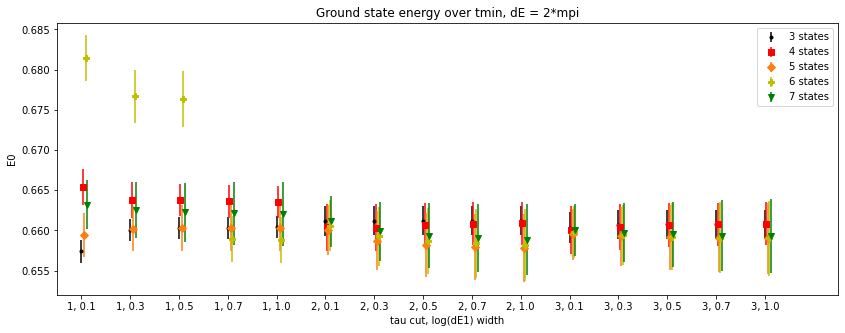

<Figure size 432x288 with 0 Axes>

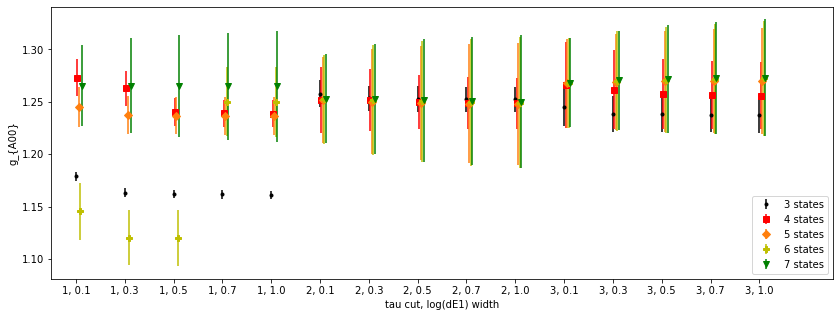

<Figure size 432x288 with 0 Axes>

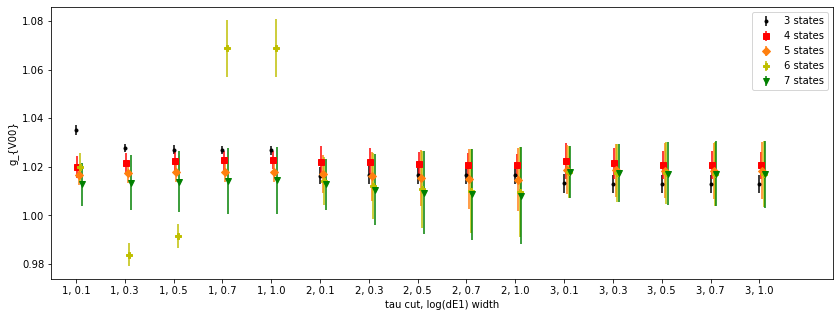

<Figure size 432x288 with 0 Axes>

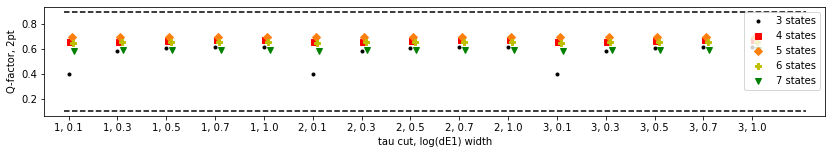

<Figure size 432x288 with 0 Axes>

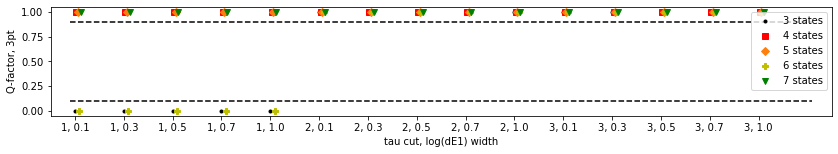

<Figure size 432x288 with 0 Axes>

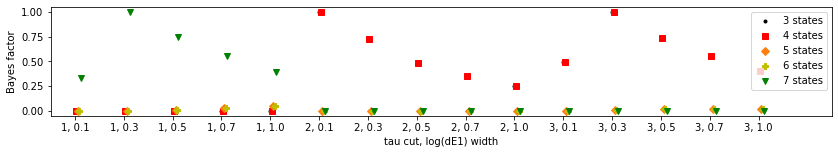

<Figure size 432x288 with 0 Axes>

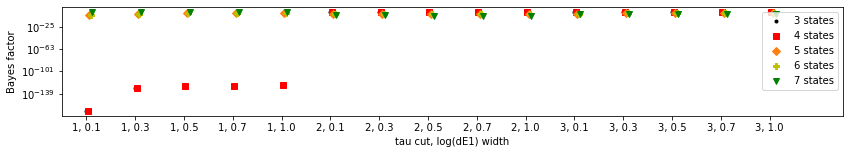

<Figure size 432x288 with 0 Axes>

In [113]:
# First, define colors, markers, and legend labels to be used for each number of states
ax_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^'])
ax_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c'])
ax_labels = np.array(["3 states", "4 states", "5 states", "6 states", "7 states"])





# Set an x-array to map the results to the graph
ax_ensemble_to_x_map = np.arange(0, 15, 1)
xticlocs = np.arange(0, 15, 1)
xticklabels = np.array(["1, 0.1", \
                        "1, 0.3", \
                        "1, 0.5", \
                        "1, 0.7", \
                        "1, 1.0", \
                        "2, 0.1", \
                        "2, 0.3", \
                        "2, 0.5", \
                        "2, 0.7", \
                        "2, 1.0", \
                        "3, 0.1", \
                        "3, 0.3", \
                        "3, 0.5", \
                        "3, 0.7", \
                        "3, 1.0"])



# Now create an "upper bound" and "lower bound" plot on Q
samp_line = np.linspace(-0.1,15.1,500)
Q_01_line = np.linspace(0.1,0.1,500)
Q_09_line = np.linspace(0.9,0.9,500)

# Next, create the figure
#E0
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

# Now loop over the number of states used in 3-point
for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [E0_a0_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [E0_a0_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.title("Ground state energy over tmin, dE = 2*mpi")
plt.ylabel("E0")

plt.legend()
plt.show()

plt.clf()

# Next, create the figure
#gA00
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [gA00_a0_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [gA00_a0_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.legend()
plt.ylabel("g_{A00}")
plt.show()

plt.clf()

# Next, create the figure
#gV00
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [gV00_a0_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [gV00_a0_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.legend()
plt.ylabel("g_{V00}")
plt.show()

plt.clf()

# Next, create the figure
#Q-factor
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [Q_a0_2pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 2pt")
plt.show()

plt.clf()

#Q-factor
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [Q_a0_3pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 3pt")
plt.show()

plt.clf()

# Next, create the figure
#Bayes
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a0_graph[i][k] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor")
plt.show()

plt.clf()

#Bayes
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.semilogy(ax_ensemble_to_x_map + k*0.03, [BF_a0_graph[i][k] for i in range(len(ax_ensemble_to_x_map))], '.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor")
plt.show()

plt.clf()


# Next, create the figure
#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for k in range(len(n_z_vals)):
    #plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a0_2pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend(loc = 'upper right')
#plt.ylabel("Bayes factor, 2pt")
#plt.show()

#plt.clf()

#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for k in range(len(n_z_vals)):
    #plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a0_3pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend(loc = 'upper right')
#plt.ylabel("Bayes factor, 3pt")
#plt.show()

<Figure size 432x288 with 0 Axes>

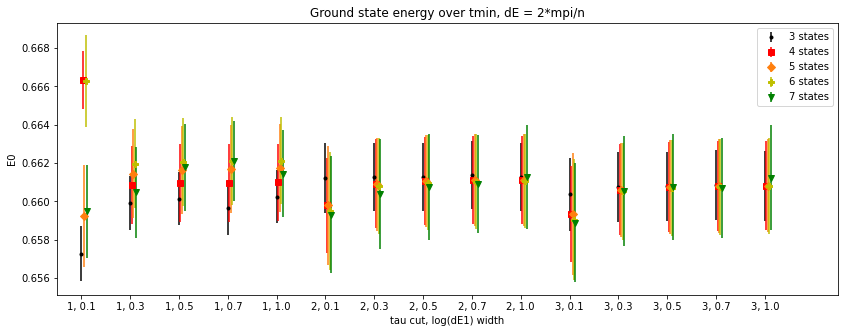

<Figure size 432x288 with 0 Axes>

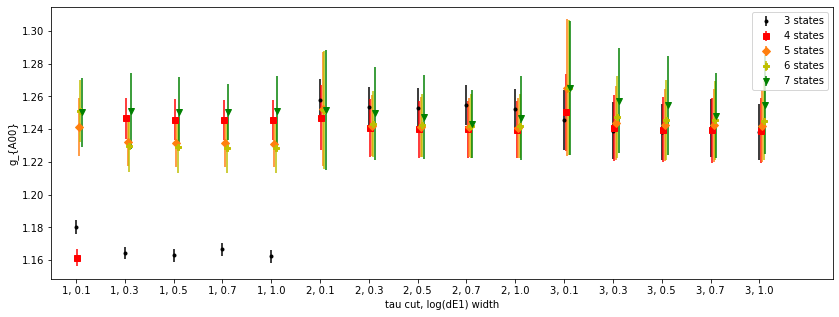

<Figure size 432x288 with 0 Axes>

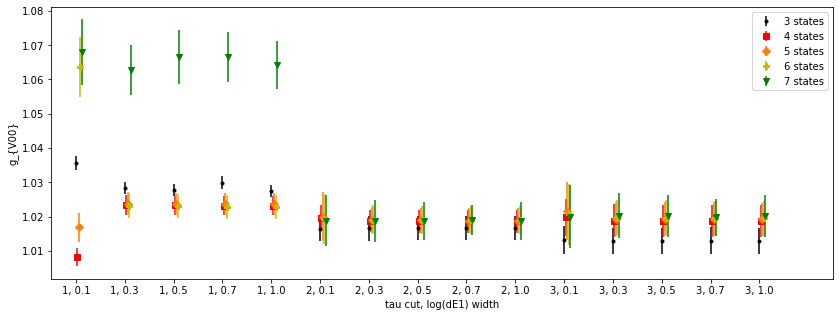

<Figure size 432x288 with 0 Axes>

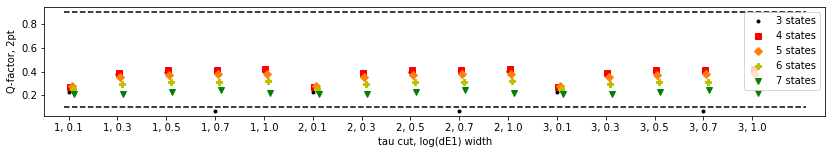

<Figure size 432x288 with 0 Axes>

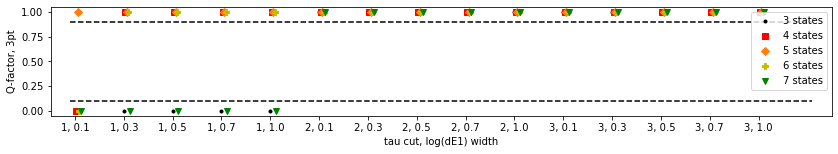

<Figure size 432x288 with 0 Axes>

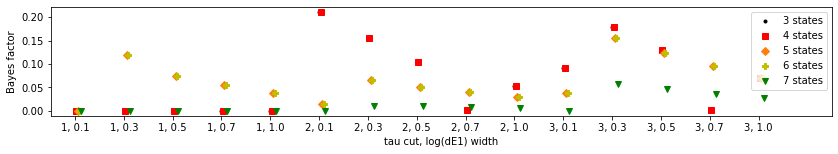

<Figure size 432x288 with 0 Axes>

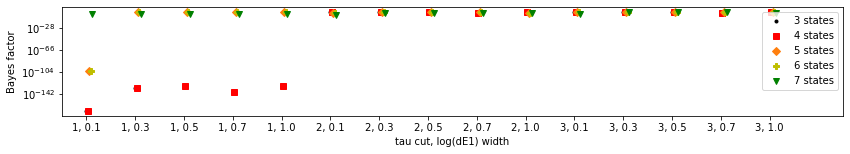

<Figure size 432x288 with 0 Axes>

In [114]:
# Now, 1/n
# Next, create the figure
#E0
plt.clf()
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

# Now loop over the number of states used in 3-point
for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [E0_a1_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [E0_a1_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.title("Ground state energy over tmin, dE = 2*mpi/n")
plt.ylabel("E0")

plt.legend()
plt.show()

plt.clf()

# Next, create the figure
#gA00
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [gA00_a1_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [gA00_a1_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.legend()
plt.ylabel("g_{A00}")
plt.show()

plt.clf()

# Next, create the figure
#gV00
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [gV00_a1_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [gV00_a1_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.legend()
plt.ylabel("g_{V00}")
plt.show()

plt.clf()

# Next, create the figure
#Q-factor
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [Q_a1_2pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 2pt")
plt.show()

plt.clf()

#Q-factor
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [Q_a1_3pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 3pt")
plt.show()

plt.clf()

# Next, create the figure
#Bayes
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a1_graph[i][k] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor")
plt.show()

plt.clf()

#Bayes
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.semilogy(ax_ensemble_to_x_map + k*0.03, [BF_a1_graph[i][k] for i in range(len(ax_ensemble_to_x_map))], '.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor")
plt.show()

plt.clf()



# Next, create the figure
#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for k in range(len(n_z_vals)):
    #plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a1_2pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend(loc = 'upper right')
#plt.ylabel("Bayes factor, 2pt")
#plt.show()

#plt.clf()

#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for k in range(len(n_z_vals)):
    #plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a1_3pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend(loc = 'upper right')
#plt.ylabel("Bayes factor, 3pt")
#plt.show()

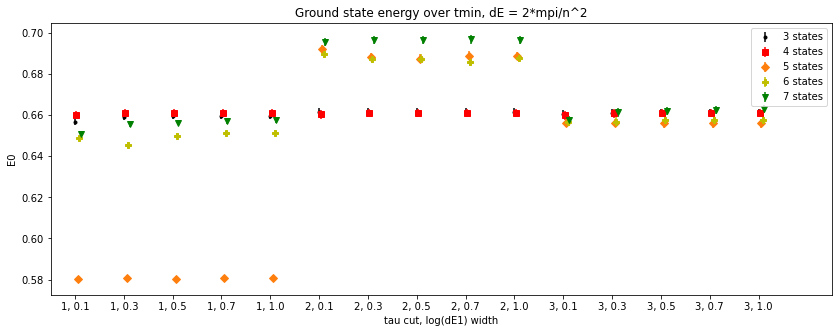

<Figure size 432x288 with 0 Axes>

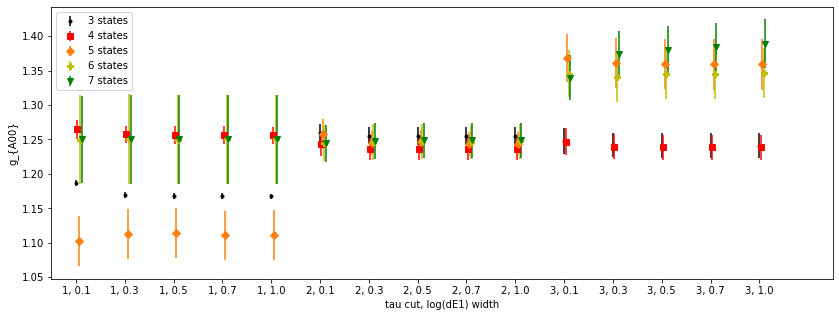

<Figure size 432x288 with 0 Axes>

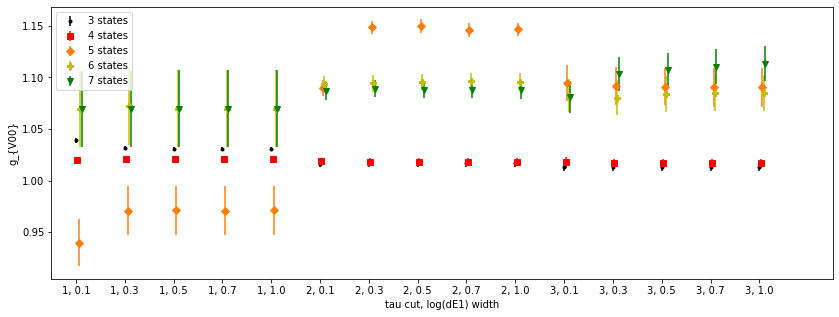

<Figure size 432x288 with 0 Axes>

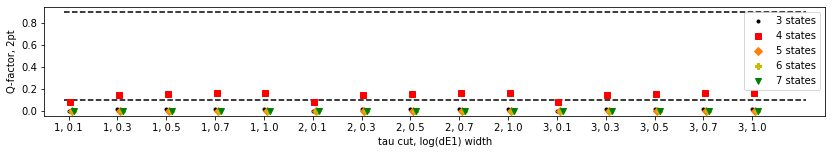

<Figure size 432x288 with 0 Axes>

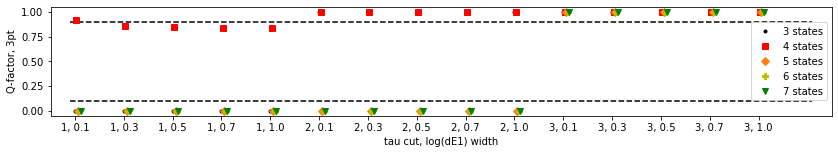

<Figure size 432x288 with 0 Axes>

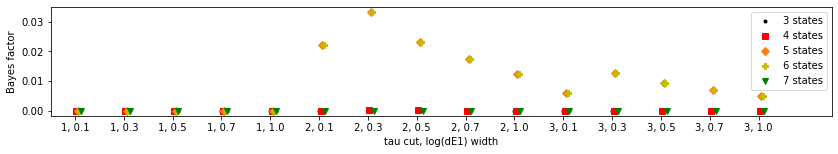

<Figure size 432x288 with 0 Axes>

In [115]:
# Now, 1/n^2
# Next, create the figure
#E0
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

# Now loop over the number of states used in 3-point
for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [E0_a2_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [E0_a2_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.title("Ground state energy over tmin, dE = 2*mpi/n^2")
plt.ylabel("E0")

plt.legend()
plt.show()

plt.clf()

# Next, create the figure
#gA00
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [gA00_a2_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [gA00_a2_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.legend()
plt.ylabel("g_{A00}")
plt.show()

plt.clf()

# Next, create the figure
#gV00
plt.figure(figsize = (14,5))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [gV00_a2_graph[i][k*2].mean for i in range(len(ax_ensemble_to_x_map))], yerr = [gV00_a2_graph[i][k*2].sdev for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
    
plt.legend()
plt.ylabel("g_{V00}")
plt.show()

plt.clf()

# Next, create the figure
#Q-factor
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [Q_a2_2pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
plt.legend()
plt.ylabel("Q-factor, 2pt")
plt.show()

plt.clf()

#Q-factor
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [Q_a2_3pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
plt.legend()
plt.ylabel("Q-factor, 3pt")
plt.show()

plt.clf()

# Next, create the figure
#Bayes
plt.figure(figsize = (14,2))
plt.xlim([-0.5, 15.5])
plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("tau cut, log(dE1) width")

for k in range(len(n_z_vals)):
    plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a2_graph[i][k] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor")
plt.show()

plt.clf()

# Next, create the figure
#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for k in range(len(n_z_vals)):
    #plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a2_2pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend()
#plt.ylabel("Bayes factor, 2pt")
#plt.show()

#plt.clf()

#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for k in range(len(n_z_vals)):
    #plt.errorbar(ax_ensemble_to_x_map + k*0.03, [BF_a2_3pt_graph[i][k*2] for i in range(len(ax_ensemble_to_x_map))], fmt='.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend()
#plt.ylabel("Bayes factor, 3pt")
#plt.show()

## Now, do an analysis over the effects of t_min and the number of states on the fit results

Also, create .obj files to use as p0 values for the simultaneous-fit version

In [90]:
# Parameters outlining the 3-point t_min and number of states sampled over
tmin_range = np.arange(3, 11, 1)
numstates_range = np.arange(3, 8, 1)

In [102]:
# Create the datasets for each of the tmins'
x_all_dicts_2pt = []
y_all_dicts_2pt = []
x_all_dicts_3pt = []
y_all_dicts_3pt = []

for i in range(len(tmin_range)):
    temp_x_2pt = gv.BufferDict()
    temp_y_2pt = gv.BufferDict()
    temp_x_3pt = gv.BufferDict()
    temp_y_3pt = gv.BufferDict()
    
    x_all_dicts_2pt.append(temp_x_2pt)
    y_all_dicts_2pt.append(temp_y_2pt)
    x_all_dicts_3pt.append(temp_x_3pt)
    y_all_dicts_3pt.append(temp_y_3pt)
    
    x_2pt = np.array([l for l in range(2, 13)])
    x_3pt_uncut = t_1d_array
    
    y_2pt_SS = np.array([ gv_avg_data['2pt_SS'][l] for l in range(2,13)])
    y_2pt_PS = np.array([ gv_avg_data['2pt_PS'][l] for l in range(2,13)])
    y_2pt_all = np.transpose(np.array([[y_2pt_SS], [y_2pt_PS]]), axes=[2,0,1])
    y_3pt_A3_2d = np.array([ [gv_avg_data['3pt_A3'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
    y_3pt_A3 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_A3_2d)
    y_3pt_V4_2d = np.array([ [gv_avg_data['3pt_V4'][i][j] for j in range(1, i+tsep_vals[0])] for i in range(len(tsep_vals))])
    y_3pt_V4 = convert_2dto1d(t_1d_array, t_2d_array, y_3pt_V4_2d)
    y_3pt_all_uncut = np.transpose(np.array([[y_3pt_A3], [y_3pt_V4]]), axes=[2,0,1])
    
    x_3pt = []
    y_3pt_all = []
    for k in range(len(x_3pt_uncut)):
        if x_3pt_uncut[k][1] <= x_3pt_uncut[k][0]/2.:
            if x_3pt_uncut[k][0] >= tmin_range[i]:
                x_3pt.append(x_3pt_uncut[k].tolist())
                y_3pt_all.append(y_3pt_all_uncut[k].tolist())
            
    x_3pt = np.array(x_3pt)
    y_3pt_all = np.array(y_3pt_all)


    x_all_dicts_2pt[i]['2pt'] = x_2pt
    x_all_dicts_3pt[i]['3pt'] = x_3pt

    y_all_dicts_2pt[i]['2pt'] = y_2pt_all
    y_all_dicts_3pt[i]['3pt'] = y_3pt_all
    


In [103]:
# Now, define the priors

priors = []

for i in range(len(numstates_range)):
    priors.append([])
    
    priors[i].append(gv.BufferDict())
    priors[i].append(gv.BufferDict())
    priors[i].append(gv.BufferDict())
    
    num_zs = numstates_range[i]
    
    priors[i][0] = h5_dm.prior(num_zs, 2, 0.7, 0)
    priors[i][1] = h5_dm.prior(num_zs, 2, 0.7, 1)
    priors[i][2] = h5_dm.prior(num_zs, 2, 0.7, 2)


In [115]:
list_LogGBF_2pt_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_LogGBF_3pt_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_Q_2pt_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_Q_3pt_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_E0_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gA00_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gV00_a0 = np.array([[None]*len(numstates_range)]*len(tmin_range))

list_LogGBF_2pt_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_LogGBF_3pt_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_Q_2pt_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_Q_3pt_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_E0_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gA00_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gV00_a1 = np.array([[None]*len(numstates_range)]*len(tmin_range))

list_LogGBF_2pt_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_LogGBF_3pt_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_Q_2pt_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_Q_3pt_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_E0_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gA00_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gV00_a2 = np.array([[None]*len(numstates_range)]*len(tmin_range))


In [116]:
#Now, do the fit
for i in range(len(tmin_range)):
    for j in range(len(numstates_range)):
            num_zs = numstates_range[j]
            
            #print(np.shape(x_all_dicts_2pt[i]))
            #print(np.shape(all_at_once_dict(x_all_dicts_2pt[i], priors[0][0])))
            #print(np.shape())
            
            fit_a0_2pt = lsqfit.nonlinear_fit(data=(x_all_dicts_2pt[i], y_all_dicts_2pt[i] ), prior=priors[j][0],fcn=all_at_once_dict,debug=True, maxit=10000)
            fit_a1_2pt = lsqfit.nonlinear_fit(data=(x_all_dicts_2pt[i], y_all_dicts_2pt[i] ), prior=priors[j][1],fcn=all_at_once_dict,debug=True, maxit=10000)
            fit_a2_2pt = lsqfit.nonlinear_fit(data=(x_all_dicts_2pt[i], y_all_dicts_2pt[i] ), prior=priors[j][2],fcn=all_at_once_dict,debug=True, maxit=10000)
                
            fit_a0 = lsqfit.nonlinear_fit(data=(x_all_dicts_3pt[i], y_all_dicts_3pt[i] ), prior=fit_a0_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000)
            fit_a1 = lsqfit.nonlinear_fit(data=(x_all_dicts_3pt[i], y_all_dicts_3pt[i] ), prior=fit_a1_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000)
            fit_a2 = lsqfit.nonlinear_fit(data=(x_all_dicts_3pt[i], y_all_dicts_3pt[i] ), prior=fit_a2_2pt.p,fcn=all_at_once_dict,debug=True, maxit=10000)
            
            print("dE constant, tmin range: (", tmin_range[i], ", 12); num_zs = ", num_zs, " num_states_FH = ", num_states_FH)
            print(fit_a0.format(100))    
            list_LogGBF_2pt_a0[i][j] = fit_a0_2pt.logGBF
            list_LogGBF_3pt_a0[i][j] = fit_a0.logGBF
            list_Q_2pt_a0[i][j] = fit_a0_2pt.Q
            list_Q_3pt_a0[i][j] = fit_a0.Q
            list_E0_a0[i][j] = fit_a0.p['E0']
            list_gA00_a0[i][j] = fit_a0.p['gA3_00']
            list_gV00_a0[i][j] = fit_a0.p['gV4_00']
            
            print("dE proportional to 1/n, tmin range: (", tmin_range[i], ", 12); num_zs = ", num_zs, " num_states_FH = ", num_states_FH)
            print(fit_a1.format(100)) 
            list_LogGBF_2pt_a1[i][j] = fit_a1_2pt.logGBF
            list_LogGBF_3pt_a1[i][j] = fit_a1.logGBF
            list_Q_2pt_a1[i][j] = fit_a1_2pt.Q
            list_Q_3pt_a1[i][j] = fit_a1.Q
            list_E0_a1[i][j] = fit_a1.p['E0']
            list_gA00_a1[i][j] = fit_a1.p['gA3_00']
            list_gV00_a1[i][j] = fit_a1.p['gV4_00']
                
            print("dE proportional to 1/n^2, tmin range: (", tmin_range[i], ", 12); num_zs = ", num_zs, " num_states_FH = ", num_states_FH)
            print(fit_a2.format(100)) 
            list_LogGBF_2pt_a2[i][j] = fit_a2_2pt.logGBF
            list_LogGBF_3pt_a2[i][j] = fit_a2.logGBF
            list_Q_2pt_a2[i][j] = fit_a2_2pt.Q
            list_Q_3pt_a2[i][j] = fit_a2.Q
            list_E0_a2[i][j] = fit_a2.p['E0']
            list_gA00_a2[i][j] = fit_a2.p['gA3_00']
            list_gV00_a2[i][j] = fit_a2.p['gV4_00']
            
            # Pickle the fit results for chained so that they can be used as p0 for simultaneous
            current_posterior_a0 = open('chained_2pt_3pt_dEconst_tmin_{0}_nstates_{1}.obj'.format(tmin_range[i], num_zs), 'wb')
            pickle.dump(fit_a0.p, current_posterior_a0)
            current_posterior_a0.close()
            
            current_posterior_a1 = open('chained_2pt_3pt_dE1overn_tmin_{0}_nstates_{1}.obj'.format(tmin_range[i], num_zs), 'wb')
            pickle.dump(fit_a1.p, current_posterior_a1)
            current_posterior_a1.close()
            
            current_posterior_a2 = open('chained_2pt_3pt_dE1overn2_tmin_{0}_nstates_{1}.obj'.format(tmin_range[i], num_zs), 'wb')
            pickle.dump(fit_a2.p, current_posterior_a2)
            current_posterior_a2.close()

dE constant, tmin range: ( 3 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 14 [70]    Q = 2.7e-157    logGBF = 1371.8

Parameters:
             E0         0.6594 (14)        [    0.6614 (18) ]  *
             Z0      0.0007448 (42)        [ 0.0007586 (59) ]  **
        Ztilde0       0.002818 (19)        [  0.002870 (28) ]  *
             Z1      0.0010003 (93)        [  0.000711 (42) ]  *****
        Ztilde1       0.006627 (81)        [   0.00487 (32) ]  *****
             Z2      0.0016499 (80)        [  0.001328 (22) ]  *****
        Ztilde2       0.012896 (77)        [   0.00986 (22) ]  *****
       log(dE1)         -0.537 (20)        [    -0.756 (66) ]  ***
       log(dE2)         0.5848 (51)        [    -0.107 (53) ]  *****
         gA3_10        -0.0123 (47)        [      0.0 (1.0) ]  
         gV4_10        0.05017 (96)        [      0.0 (1.0) ]  
         gA3_11          0.671 (11)        [      0.0 (1.0) ]  
         gV4_11         0.8335 (79)    

Least Square Fit:
  chi2/dof [dof] = 14 [70]    Q = 1.3e-161    logGBF = 1361

Parameters:
             E0         0.6589 (14)        [    0.6614 (19) ]  *
             Z0      0.0007427 (42)        [ 0.0007588 (59) ]  **
        Ztilde0       0.002808 (19)        [  0.002870 (28) ]  **
             Z1      0.0010011 (93)        [  0.000705 (43) ]  *****
        Ztilde1       0.006595 (80)        [   0.00484 (32) ]  *****
             Z2      0.0016424 (79)        [  0.001325 (21) ]  *****
        Ztilde2       0.012860 (75)        [   0.00983 (22) ]  *****
       log(dE1)         -0.549 (20)        [    -0.762 (66) ]  ***
       log(dE2)         0.5856 (51)        [    -0.114 (52) ]  *****
         gA3_10        -0.0138 (46)        [      0.0 (1.0) ]  
         gV4_10        0.04957 (94)        [      0.0 (1.0) ]  
         gA3_11          0.669 (10)        [      0.0 (1.0) ]  
         gV4_11         0.8260 (77)        [      1.00 (20) ]  
         gA3_20         0.7150 (74)        [

Least Square Fit:
  chi2/dof [dof] = 1.6 [70]    Q = 0.00055    logGBF = 1781.1

Parameters:
             E0         0.6598 (18)        [    0.6612 (20) ]  
             Z0      0.0007499 (56)        [ 0.0007581 (65) ]  *
        Ztilde0       0.002820 (26)        [  0.002867 (31) ]  *
             Z1       0.000585 (27)        [  0.000706 (43) ]  **
        Ztilde1        0.00377 (20)        [   0.00482 (34) ]  ***
             Z2       0.000931 (61)        [   0.00121 (15) ]  *
        Ztilde2        0.00899 (82)        [   0.00932 (84) ]  
       log(dE1)         -0.965 (44)        [    -0.765 (70) ]  **
       log(dE2)         -0.337 (37)        [    -0.129 (57) ]  ***
       log(dE3)          1.008 (65)        [     -2.05 (70) ]  ****
             Z3        0.00114 (15)        [   0.00056 (35) ]  *
        Ztilde3         0.0038 (19)        [    0.0033 (19) ]  
         gA3_10         -0.270 (40)        [      0.0 (1.0) ]  
         gV4_10        -0.0039 (55)        [      0.0 (1.

dE constant, tmin range: ( 3 , 12); num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 2.6e+03 [70]    Q = 0    logGBF = -90650

Parameters:
             E0         0.6600 (20)        [    0.6609 (23) ]  
             Z0      0.0006199 (68)        [ 0.0007567 (79) ]  *****
        Ztilde0       0.002281 (31)        [  0.002861 (37) ]  *****
             Z1       0.000456 (39)        [  0.000698 (46) ]  *****
        Ztilde1        0.00379 (32)        [   0.00472 (40) ]  **
             Z2        0.00099 (12)        [   0.00118 (13) ]  *
        Ztilde2        0.00808 (75)        [   0.00903 (79) ]  *
       log(dE1)         -0.781 (66)        [    -0.782 (83) ]  
       log(dE2)         -0.169 (72)        [    -0.178 (78) ]  
       log(dE3)          -1.08 (59)        [     -1.08 (70) ]  
             Z3        0.00072 (33)        [   0.00053 (34) ]  
        Ztilde3         0.0020 (19)        [    0.0033 (19) ]  
       log(dE4)          -1.05 (61)        [     -1.05

Least Square Fit:
  chi2/dof [dof] = 3.3e+02 [70]    Q = 0    logGBF = -9718.7

Parameters:
             E0        0.6955 (12)        [    0.6640 (14) ]  *****
             Z0     0.0008250 (31)        [ 0.0007771 (40) ]  *****
        Ztilde0      0.003255 (15)        [  0.002938 (18) ]  *****
             Z1     -0.000146 (50)        [  0.000098 (89) ]  **
        Ztilde1        0.0389 (30)        [    0.0127 (30) ]  *****
             Z2     -0.000652 (61)        [  -0.00016 (12) ]  ****
        Ztilde2       -0.0653 (30)        [    0.0145 (30) ]  *****
       log(dE1)        -0.036 (90)        [     -0.91 (24) ]  ***
       log(dE2)         -1.27 (44)        [     -1.63 (54) ]  
       log(dE3)         -1.76 (55)        [     -2.05 (59) ]  
             Z3       0.00002 (38)        [  -0.00003 (39) ]  
        Ztilde3       -0.0007 (20)        [    0.0026 (20) ]  *
       log(dE4)         -2.10 (62)        [     -2.34 (64) ]  
             Z4      0.001431 (10)        [  0.001214 

Least Square Fit:
  chi2/dof [dof] = 6.6e+03 [70]    Q = 0    logGBF = -2.2778e+05

Parameters:
             E0         0.6594 (14)        [    0.6736 (19) ]  *****
             Z0      0.0004726 (43)        [ 0.0008032 (58) ]  *****
        Ztilde0       0.001730 (19)        [  0.003080 (25) ]  *****
             Z1        0.00024 (10)        [   0.00049 (15) ]  *
        Ztilde1         0.0061 (11)        [    0.0061 (12) ]  
             Z2        0.00049 (23)        [   0.00065 (23) ]  
        Ztilde2        -0.0039 (28)        [   -0.0032 (28) ]  
       log(dE1)         -0.516 (84)        [    -0.520 (98) ]  
       log(dE2)          -0.93 (17)        [     -0.94 (19) ]  
       log(dE3)          -2.75 (63)        [     -2.75 (64) ]  
             Z3        0.00025 (38)        [   0.00032 (38) ]  
        Ztilde3         0.0030 (20)        [    0.0036 (20) ]  
       log(dE4)          -3.60 (69)        [     -3.60 (69) ]  
             Z4        0.00090 (19)        [   0.00101 (

dE constant, tmin range: ( 3 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.2e+03 [70]    Q = 0    logGBF = -39320

Parameters:
             E0         0.6701 (21)        [    0.6608 (23) ]  ***
             Z0      0.0006822 (72)        [ 0.0007562 (83) ]  *****
        Ztilde0       0.002588 (33)        [  0.002858 (38) ]  *****
             Z1       0.000539 (43)        [  0.000691 (48) ]  ***
        Ztilde1        0.00323 (35)        [   0.00466 (42) ]  ***
             Z2        0.00094 (13)        [   0.00114 (14) ]  *
        Ztilde2        0.00983 (83)        [   0.00877 (88) ]  *
       log(dE1)         -0.791 (73)        [    -0.792 (88) ]  
       log(dE2)         -0.193 (82)        [    -0.206 (87) ]  
       log(dE3)          -1.12 (62)        [     -1.12 (69) ]  
             Z3        0.00045 (34)        [   0.00052 (35) ]  
        Ztilde3         0.0021 (19)        [    0.0033 (19) ]  
       log(dE4)          -1.10 (62)        [     -1.

Least Square Fit:
  chi2/dof [dof] = 1.1e+04 [70]    Q = 0    logGBF = -3.8262e+05

Parameters:
             E0         0.6338 (11)        [    0.6421 (17) ]  ****
             Z0      0.0003226 (31)        [ 0.0006952 (47) ]  *****
        Ztilde0       0.001270 (15)        [  0.002651 (21) ]  *****
             Z1       -0.00005 (14)        [    -3(164)e-06 ]  
        Ztilde1         0.0048 (30)        [    0.0047 (30) ]  
             Z2      -0.000157 (75)        [ -0.000177 (81) ]  
        Ztilde2         0.0216 (30)        [    0.0213 (30) ]  
       log(dE1)          -0.86 (17)        [     -0.86 (17) ]  
       log(dE2)          -2.33 (68)        [     -2.33 (68) ]  
       log(dE3)          -3.16 (62)        [     -3.16 (65) ]  
             Z3       -0.00005 (38)        [  -0.00002 (39) ]  
        Ztilde3         0.0027 (20)        [    0.0026 (20) ]  
       log(dE4)          -3.74 (68)        [     -3.74 (68) ]  
             Z4       -0.00003 (38)        [    -1(390)e-0

dE constant, tmin range: ( 3 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 6.7e+02 [70]    Q = 0    logGBF = -21675

Parameters:
             E0        0.6811 (21)        [    0.6607 (24) ]  *****
             Z0     0.0007029 (74)        [ 0.0007559 (85) ]  *****
        Ztilde0      0.002705 (34)        [  0.002857 (39) ]  ***
             Z1      0.000596 (45)        [  0.000686 (50) ]  *
        Ztilde1       0.00294 (37)        [   0.00462 (43) ]  ***
             Z2       0.00091 (14)        [   0.00112 (15) ]  *
        Ztilde2       0.01036 (88)        [   0.00860 (95) ]  *
       log(dE1)        -0.800 (78)        [    -0.800 (91) ]  
       log(dE2)        -0.214 (88)        [    -0.226 (95) ]  
       log(dE3)         -1.15 (64)        [     -1.15 (69) ]  
             Z3       0.00036 (35)        [   0.00052 (35) ]  
        Ztilde3        0.0024 (19)        [    0.0034 (19) ]  
       log(dE4)         -1.14 (64)        [     -1.14 (70) ]  
   

Least Square Fit:
  chi2/dof [dof] = 1.1e+04 [70]    Q = 0    logGBF = -3.8919e+05

Parameters:
             E0         0.6342 (12)        [    0.6422 (17) ]  ****
             Z0      0.0003252 (32)        [ 0.0006957 (47) ]  *****
        Ztilde0       0.001286 (15)        [  0.002653 (21) ]  *****
             Z1       -0.00005 (13)        [     4(148)e-06 ]  
        Ztilde1         0.0049 (30)        [    0.0049 (30) ]  
             Z2      -0.000148 (76)        [ -0.000162 (83) ]  
        Ztilde2         0.0208 (30)        [    0.0205 (30) ]  
       log(dE1)          -0.88 (18)        [     -0.88 (18) ]  
       log(dE2)          -2.34 (68)        [     -2.34 (68) ]  
       log(dE3)          -3.16 (65)        [     -3.16 (66) ]  
             Z3       -0.00005 (37)        [  -0.00003 (39) ]  
        Ztilde3         0.0032 (20)        [    0.0031 (20) ]  
       log(dE4)          -3.74 (68)        [     -3.74 (69) ]  
             Z4       -0.00004 (38)        [  -0.00001 (39

dE constant, tmin range: ( 4 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 11 [68]    Q = 1.6e-110    logGBF = 1450.2

Parameters:
             E0         0.6607 (13)        [    0.6614 (18) ]  
             Z0      0.0007577 (39)        [ 0.0007586 (59) ]  
        Ztilde0       0.002898 (18)        [  0.002870 (28) ]  *
             Z1       0.001146 (13)        [  0.000711 (42) ]  *****
        Ztilde1        0.00787 (11)        [   0.00487 (32) ]  *****
             Z2      0.0016005 (85)        [  0.001328 (22) ]  *****
        Ztilde2       0.012468 (77)        [   0.00986 (22) ]  *****
       log(dE1)         -0.231 (26)        [    -0.756 (66) ]  *****
       log(dE2)         0.5812 (67)        [    -0.107 (53) ]  *****
         gA3_10         0.0252 (50)        [      0.0 (1.0) ]  
         gV4_10         0.0622 (20)        [      0.0 (1.0) ]  
         gA3_11          0.905 (33)        [      0.0 (1.0) ]  
         gV4_11          1.174 (45)     

dE constant, tmin range: ( 4 , 12); num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.3 [68]    Q = 0.059    logGBF = 1750.7

Parameters:
             E0         0.6589 (19)        [    0.6611 (21) ]  *
             Z0      0.0007468 (62)        [ 0.0007574 (73) ]  *
        Ztilde0       0.002810 (28)        [  0.002864 (34) ]  *
             Z1       0.000601 (30)        [  0.000705 (44) ]  **
        Ztilde1        0.00377 (22)        [   0.00479 (37) ]  **
             Z2       0.000938 (70)        [   0.00123 (11) ]  **
        Ztilde2        0.00871 (62)        [   0.00939 (65) ]  *
       log(dE1)         -0.958 (50)        [    -0.770 (76) ]  **
       log(dE2)         -0.373 (42)        [    -0.143 (66) ]  ***
       log(dE3)          1.035 (72)        [     -1.02 (70) ]  **
             Z3        0.00145 (21)        [   0.00054 (32) ]  **
        Ztilde3         0.0054 (18)        [    0.0032 (19) ]  *
         gA3_10         -0.278 (42)        [      0.0

dE constant, tmin range: ( 4 , 12); num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1 [68]    Q = 0.42    logGBF = 1753.2

Parameters:
             E0         0.6606 (21)        [    0.6609 (23) ]  
             Z0      0.0007549 (70)        [ 0.0007567 (79) ]  
        Ztilde0       0.002848 (32)        [  0.002861 (37) ]  
             Z1       0.000667 (36)        [  0.000698 (46) ]  
        Ztilde1        0.00453 (31)        [   0.00472 (40) ]  
             Z2        0.00134 (11)        [   0.00118 (13) ]  *
        Ztilde2        0.00904 (74)        [   0.00903 (79) ]  
       log(dE1)         -0.820 (64)        [    -0.782 (83) ]  
       log(dE2)         -0.203 (67)        [    -0.178 (78) ]  
       log(dE3)          -0.63 (57)        [     -1.08 (70) ]  
             Z3       -0.00033 (26)        [   0.00053 (34) ]  **
        Ztilde3         0.0033 (19)        [    0.0033 (19) ]  
       log(dE4)           0.38 (38)        [     -1.05 (70) ]  **
       

Least Square Fit:
  chi2/dof [dof] = 5.7e+03 [68]    Q = 0    logGBF = -1.9079e+05

Parameters:
             E0         0.6296 (10)        [    0.6640 (14) ]  *****
             Z0      0.0003205 (29)        [ 0.0007771 (40) ]  *****
        Ztilde0       0.001161 (15)        [  0.002938 (18) ]  *****
             Z1      -0.000014 (74)        [  0.000098 (89) ]  *
        Ztilde1         0.0106 (29)        [    0.0127 (30) ]  
             Z2       -0.00010 (11)        [  -0.00016 (12) ]  
        Ztilde2         0.0154 (30)        [    0.0145 (30) ]  
       log(dE1)          -0.91 (20)        [     -0.91 (24) ]  
       log(dE2)          -1.63 (48)        [     -1.63 (54) ]  
       log(dE3)          -2.05 (58)        [     -2.05 (59) ]  
             Z3        0.00001 (35)        [  -0.00003 (39) ]  
        Ztilde3         0.0026 (20)        [    0.0026 (20) ]  
       log(dE4)          -2.34 (64)        [     -2.34 (64) ]  
             Z4       0.000818 (16)        [  0.001214 (

dE constant, tmin range: ( 4 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [68]    Q = 0.71    logGBF = 1756.8

Parameters:
             E0         0.6596 (21)        [    0.6608 (23) ]  
             Z0      0.0007515 (72)        [ 0.0007562 (83) ]  
        Ztilde0       0.002836 (33)        [  0.002858 (38) ]  
             Z1       0.000680 (39)        [  0.000691 (48) ]  
        Ztilde1        0.00449 (32)        [   0.00466 (42) ]  
             Z2        0.00112 (11)        [   0.00114 (14) ]  
        Ztilde2        0.00876 (80)        [   0.00877 (88) ]  
       log(dE1)         -0.823 (67)        [    -0.792 (88) ]  
       log(dE2)         -0.247 (71)        [    -0.206 (87) ]  
       log(dE3)          -0.53 (54)        [     -1.12 (69) ]  
             Z3        0.00058 (30)        [   0.00052 (35) ]  
        Ztilde3         0.0039 (19)        [    0.0033 (19) ]  
       log(dE4)          -0.52 (63)        [     -1.11 (70) ]  
          

Least Square Fit:
  chi2/dof [dof] = 5.5e+03 [68]    Q = 0    logGBF = -1.8393e+05

Parameters:
             E0         0.6399 (11)        [    0.6693 (15) ]  *****
             Z0      0.0003462 (33)        [ 0.0007930 (44) ]  *****
        Ztilde0       0.001255 (15)        [  0.002998 (19) ]  *****
             Z1          -3(77)e-06        [  0.000114 (93) ]  *
        Ztilde1         0.0090 (29)        [    0.0112 (30) ]  
             Z2       -0.00010 (13)        [  -0.00015 (14) ]  
        Ztilde2         0.0118 (30)        [    0.0111 (30) ]  
       log(dE1)          -0.93 (19)        [     -0.93 (22) ]  
       log(dE2)          -1.65 (48)        [     -1.65 (52) ]  
       log(dE3)          -2.06 (61)        [     -2.06 (61) ]  
             Z3       -0.00002 (36)        [  -0.00006 (38) ]  
        Ztilde3         0.0033 (20)        [    0.0032 (20) ]  
       log(dE4)          -2.35 (65)        [     -2.35 (65) ]  
             Z4        0.00007 (34)        [  -0.00001 (

Least Square Fit:
  chi2/dof [dof] = 7.2e+03 [68]    Q = 0    logGBF = -2.4296e+05

Parameters:
             E0         0.6202 (12)        [    0.6421 (17) ]  *****
             Z0      0.0002733 (33)        [ 0.0006952 (47) ]  *****
        Ztilde0       0.001036 (15)        [  0.002651 (21) ]  *****
             Z1       -0.00005 (14)        [    -3(164)e-06 ]  
        Ztilde1         0.0048 (30)        [    0.0047 (30) ]  
             Z2      -0.000125 (75)        [ -0.000177 (81) ]  
        Ztilde2         0.0228 (30)        [    0.0213 (30) ]  
       log(dE1)          -0.86 (17)        [     -0.86 (17) ]  
       log(dE2)          -2.33 (68)        [     -2.33 (68) ]  
       log(dE3)          -3.16 (62)        [     -3.16 (65) ]  
             Z3       -0.00003 (38)        [  -0.00002 (39) ]  
        Ztilde3         0.0027 (20)        [    0.0026 (20) ]  
       log(dE4)          -3.74 (68)        [     -3.74 (68) ]  
             Z4       -0.00001 (38)        [    -1(390)e-

dE constant, tmin range: ( 4 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.87 [68]    Q = 0.78    logGBF = 1757

Parameters:
             E0         0.6598 (22)        [    0.6607 (24) ]  
             Z0      0.0007519 (74)        [ 0.0007559 (85) ]  
        Ztilde0       0.002837 (34)        [  0.002857 (39) ]  
             Z1       0.000673 (41)        [  0.000686 (50) ]  
        Ztilde1        0.00446 (33)        [   0.00462 (43) ]  
             Z2        0.00109 (12)        [   0.00112 (15) ]  
        Ztilde2        0.00844 (86)        [   0.00860 (95) ]  
       log(dE1)         -0.830 (71)        [    -0.800 (91) ]  
       log(dE2)         -0.266 (76)        [    -0.226 (95) ]  
       log(dE3)          -0.94 (63)        [     -1.15 (69) ]  
             Z3        0.00050 (32)        [   0.00052 (35) ]  
        Ztilde3         0.0038 (19)        [    0.0034 (19) ]  
       log(dE4)          -0.80 (63)        [     -1.14 (70) ]  
           

Least Square Fit:
  chi2/dof [dof] = 5.1e+03 [68]    Q = 0    logGBF = -1.6999e+05

Parameters:
             E0         0.6443 (13)        [    0.6732 (18) ]  *****
             Z0      0.0003694 (45)        [ 0.0008036 (57) ]  *****
        Ztilde0       0.001328 (19)        [  0.003037 (23) ]  *****
             Z1       0.000025 (86)        [   0.00017 (10) ]  *
        Ztilde1         0.0061 (27)        [    0.0085 (29) ]  
             Z2       -0.00011 (14)        [  -0.00017 (15) ]  
        Ztilde2         0.0082 (29)        [    0.0079 (30) ]  
       log(dE1)          -0.93 (16)        [     -0.93 (17) ]  
       log(dE2)          -1.64 (46)        [     -1.64 (48) ]  
       log(dE3)          -2.06 (62)        [     -2.06 (62) ]  
             Z3       -0.00004 (36)        [  -0.00007 (38) ]  
        Ztilde3         0.0029 (20)        [    0.0029 (20) ]  
       log(dE4)          -2.35 (65)        [     -2.35 (65) ]  
             Z4        0.00004 (36)        [  -0.00001 (

Least Square Fit:
  chi2/dof [dof] = 7.2e+03 [68]    Q = 0    logGBF = -2.4465e+05

Parameters:
             E0         0.6218 (12)        [    0.6422 (17) ]  *****
             Z0      0.0002755 (33)        [ 0.0006957 (47) ]  *****
        Ztilde0       0.001050 (15)        [  0.002653 (21) ]  *****
             Z1       -0.00004 (13)        [     4(148)e-06 ]  
        Ztilde1         0.0049 (30)        [    0.0049 (30) ]  
             Z2      -0.000119 (76)        [ -0.000162 (83) ]  
        Ztilde2         0.0220 (30)        [    0.0205 (30) ]  
       log(dE1)          -0.88 (18)        [     -0.88 (18) ]  
       log(dE2)          -2.34 (68)        [     -2.34 (68) ]  
       log(dE3)          -3.16 (64)        [     -3.16 (66) ]  
             Z3       -0.00003 (38)        [  -0.00003 (39) ]  
        Ztilde3         0.0033 (20)        [    0.0031 (20) ]  
       log(dE4)          -3.74 (68)        [     -3.74 (69) ]  
             Z4       -0.00002 (38)        [  -0.00001 (3

dE constant, tmin range: ( 5 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 8.5 [64]    Q = 9.7e-78    logGBF = 1444.2

Parameters:
             E0         0.6600 (14)        [    0.6614 (18) ]  
             Z0      0.0007581 (40)        [ 0.0007586 (59) ]  
        Ztilde0       0.002907 (18)        [  0.002870 (28) ]  *
             Z1       0.001199 (16)        [  0.000711 (42) ]  *****
        Ztilde1        0.00824 (12)        [   0.00487 (32) ]  *****
             Z2      0.0015706 (97)        [  0.001328 (22) ]  *****
        Ztilde2       0.012295 (82)        [   0.00986 (22) ]  *****
       log(dE1)         -0.143 (27)        [    -0.756 (66) ]  *****
       log(dE2)          0.573 (12)        [    -0.107 (53) ]  *****
         gA3_10         0.0274 (59)        [      0.0 (1.0) ]  
         gV4_10         0.0654 (27)        [      0.0 (1.0) ]  
         gA3_11          1.199 (81)        [      0.0 (1.0) ]  *
         gV4_11           1.78 (12)    

dE constant, tmin range: ( 5 , 12); num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.3 [64]    Q = 0.049    logGBF = 1659.1

Parameters:
             E0         0.6591 (19)        [    0.6611 (21) ]  
             Z0      0.0007480 (63)        [ 0.0007574 (73) ]  *
        Ztilde0       0.002816 (29)        [  0.002864 (34) ]  *
             Z1       0.000613 (31)        [  0.000705 (44) ]  **
        Ztilde1        0.00388 (23)        [   0.00479 (37) ]  **
             Z2       0.000946 (79)        [   0.00123 (11) ]  **
        Ztilde2        0.00866 (62)        [   0.00939 (65) ]  *
       log(dE1)         -0.934 (51)        [    -0.770 (76) ]  **
       log(dE2)         -0.365 (43)        [    -0.143 (66) ]  ***
       log(dE3)          1.036 (85)        [     -1.02 (70) ]  **
             Z3        0.00143 (24)        [   0.00054 (32) ]  **
        Ztilde3         0.0056 (18)        [    0.0032 (19) ]  *
         gA3_10         -0.260 (41)        [      0.0 

dE constant, tmin range: ( 5 , 12); num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1 [64]    Q = 0.41    logGBF = 1663.4

Parameters:
             E0        0.6611 (21)        [    0.6609 (23) ]  
             Z0     0.0007570 (70)        [ 0.0007567 (79) ]  
        Ztilde0      0.002858 (32)        [  0.002861 (37) ]  
             Z1      0.000672 (35)        [  0.000698 (46) ]  
        Ztilde1       0.00462 (30)        [   0.00472 (40) ]  
             Z2       0.00136 (10)        [   0.00118 (13) ]  *
        Ztilde2       0.00901 (74)        [   0.00903 (79) ]  
       log(dE1)        -0.800 (63)        [    -0.782 (83) ]  
       log(dE2)        -0.197 (65)        [    -0.178 (78) ]  
       log(dE3)         -0.63 (60)        [     -1.08 (70) ]  
             Z3      -0.00034 (25)        [   0.00053 (34) ]  **
        Ztilde3        0.0033 (19)        [    0.0033 (19) ]  
       log(dE4)          0.35 (41)        [     -1.05 (70) ]  **
             Z4     

dE constant, tmin range: ( 5 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.91 [64]    Q = 0.69    logGBF = 1666.9

Parameters:
             E0         0.6601 (21)        [    0.6608 (23) ]  
             Z0      0.0007534 (73)        [ 0.0007562 (83) ]  
        Ztilde0       0.002844 (33)        [  0.002858 (38) ]  
             Z1       0.000686 (38)        [  0.000691 (48) ]  
        Ztilde1        0.00458 (31)        [   0.00466 (42) ]  
             Z2        0.00113 (11)        [   0.00114 (14) ]  
        Ztilde2        0.00869 (80)        [   0.00877 (88) ]  
       log(dE1)         -0.804 (66)        [    -0.792 (88) ]  
       log(dE2)         -0.241 (70)        [    -0.206 (87) ]  
       log(dE3)          -0.68 (58)        [     -1.12 (69) ]  
             Z3        0.00059 (30)        [   0.00052 (35) ]  
        Ztilde3         0.0039 (19)        [    0.0033 (19) ]  
       log(dE4)          -0.49 (63)        [     -1.11 (70) ]  
         

Least Square Fit:
  chi2/dof [dof] = 2.7e+03 [64]    Q = 0    logGBF = -85715

Parameters:
             E0         0.6226 (12)        [    0.6693 (15) ]  *****
             Z0      0.0003502 (35)        [ 0.0007930 (44) ]  *****
        Ztilde0       0.001285 (16)        [  0.002998 (19) ]  *****
             Z1      -0.000013 (78)        [  0.000114 (93) ]  *
        Ztilde1         0.0062 (29)        [    0.0112 (30) ]  *
             Z2       -0.00013 (13)        [  -0.00015 (14) ]  
        Ztilde2         0.0132 (30)        [    0.0111 (30) ]  
       log(dE1)          -0.93 (19)        [     -0.93 (22) ]  
       log(dE2)          -1.64 (49)        [     -1.65 (52) ]  
       log(dE3)          -2.06 (61)        [     -2.06 (61) ]  
             Z3       -0.00002 (37)        [  -0.00006 (38) ]  
        Ztilde3         0.0035 (20)        [    0.0032 (20) ]  
       log(dE4)          -2.35 (65)        [     -2.35 (65) ]  
             Z4        0.00014 (35)        [  -0.00001 (39) 

dE constant, tmin range: ( 5 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.87 [64]    Q = 0.76    logGBF = 1667.4

Parameters:
             E0         0.6602 (22)        [    0.6607 (24) ]  
             Z0      0.0007538 (75)        [ 0.0007559 (85) ]  
        Ztilde0       0.002846 (34)        [  0.002857 (39) ]  
             Z1       0.000681 (40)        [  0.000686 (50) ]  
        Ztilde1        0.00456 (32)        [   0.00462 (43) ]  
             Z2        0.00110 (12)        [   0.00112 (15) ]  
        Ztilde2        0.00842 (86)        [   0.00860 (95) ]  
       log(dE1)         -0.808 (70)        [    -0.800 (91) ]  
       log(dE2)         -0.257 (75)        [    -0.226 (95) ]  
       log(dE3)          -0.98 (63)        [     -1.15 (69) ]  
             Z3        0.00056 (32)        [   0.00052 (35) ]  
        Ztilde3         0.0039 (19)        [    0.0034 (19) ]  
       log(dE4)          -0.83 (64)        [     -1.14 (70) ]  
         

Least Square Fit:
  chi2/dof [dof] = 2.6e+03 [64]    Q = 0    logGBF = -80651

Parameters:
             E0         0.6346 (14)        [    0.6732 (18) ]  *****
             Z0      0.0003929 (46)        [ 0.0008036 (57) ]  *****
        Ztilde0       0.001436 (20)        [  0.003037 (23) ]  *****
             Z1       0.000011 (83)        [   0.00017 (10) ]  *
        Ztilde1         0.0048 (26)        [    0.0085 (29) ]  *
             Z2       -0.00016 (15)        [  -0.00017 (15) ]  
        Ztilde2         0.0086 (29)        [    0.0079 (30) ]  
       log(dE1)          -0.93 (16)        [     -0.93 (17) ]  
       log(dE2)          -1.64 (47)        [     -1.64 (48) ]  
       log(dE3)          -2.06 (62)        [     -2.06 (62) ]  
             Z3       -0.00007 (37)        [  -0.00007 (38) ]  
        Ztilde3         0.0030 (20)        [    0.0029 (20) ]  
       log(dE4)          -2.35 (65)        [     -2.35 (65) ]  
             Z4        0.00008 (37)        [  -0.00001 (39) 

Least Square Fit:
  chi2/dof [dof] = 4.5e+03 [64]    Q = 0    logGBF = -1.4131e+05

Parameters:
             E0        0.6135 (12)        [    0.6422 (17) ]  *****
             Z0     0.0002561 (34)        [ 0.0006957 (47) ]  *****
        Ztilde0      0.000977 (16)        [  0.002653 (21) ]  *****
             Z1      -0.00005 (13)        [     4(148)e-06 ]  
        Ztilde1        0.0047 (30)        [    0.0049 (30) ]  
             Z2     -0.000134 (78)        [ -0.000162 (83) ]  
        Ztilde2        0.0238 (30)        [    0.0205 (30) ]  *
       log(dE1)         -0.88 (18)        [     -0.88 (18) ]  
       log(dE2)         -2.34 (68)        [     -2.34 (68) ]  
       log(dE3)         -3.16 (65)        [     -3.16 (66) ]  
             Z3      -0.00002 (38)        [  -0.00003 (39) ]  
        Ztilde3        0.0034 (20)        [    0.0031 (20) ]  
       log(dE4)         -3.74 (68)        [     -3.74 (69) ]  
             Z4         8(376)e-06        [  -0.00001 (39) ]  
      

dE constant, tmin range: ( 6 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 7.8 [60]    Q = 8.5e-65    logGBF = 1384.2

Parameters:
             E0         0.6583 (15)        [    0.6614 (18) ]  *
             Z0      0.0007532 (43)        [ 0.0007586 (59) ]  
        Ztilde0       0.002882 (20)        [  0.002870 (28) ]  
             Z1       0.001202 (16)        [  0.000711 (42) ]  *****
        Ztilde1        0.00818 (12)        [   0.00487 (32) ]  *****
             Z2      0.0015784 (98)        [  0.001328 (22) ]  *****
        Ztilde2       0.012444 (83)        [   0.00986 (22) ]  *****
       log(dE1)         -0.170 (27)        [    -0.756 (66) ]  *****
       log(dE2)          0.594 (11)        [    -0.107 (53) ]  *****
         gA3_10         0.0277 (56)        [      0.0 (1.0) ]  
         gV4_10         0.0642 (26)        [      0.0 (1.0) ]  
         gA3_11           0.95 (12)        [      0.0 (1.0) ]  
         gV4_11           1.76 (14)     

dE constant, tmin range: ( 6 , 12); num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.3 [60]    Q = 0.043    logGBF = 1563.6

Parameters:
             E0         0.6589 (19)        [    0.6611 (21) ]  *
             Z0      0.0007469 (64)        [ 0.0007574 (73) ]  *
        Ztilde0       0.002810 (29)        [  0.002864 (34) ]  *
             Z1       0.000603 (33)        [  0.000705 (44) ]  **
        Ztilde1        0.00378 (25)        [   0.00479 (37) ]  **
             Z2       0.000938 (81)        [   0.00123 (11) ]  **
        Ztilde2        0.00869 (62)        [   0.00939 (65) ]  *
       log(dE1)         -0.955 (53)        [    -0.770 (76) ]  **
       log(dE2)         -0.374 (45)        [    -0.143 (66) ]  ***
       log(dE3)          1.035 (83)        [     -1.02 (70) ]  **
             Z3        0.00145 (24)        [   0.00054 (32) ]  **
        Ztilde3         0.0054 (18)        [    0.0032 (19) ]  *
         gA3_10         -0.269 (43)        [      0.0

dE constant, tmin range: ( 6 , 12); num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.1 [60]    Q = 0.33    logGBF = 1567.7

Parameters:
             E0         0.6610 (21)        [    0.6609 (23) ]  
             Z0      0.0007570 (70)        [ 0.0007567 (79) ]  
        Ztilde0       0.002858 (32)        [  0.002861 (37) ]  
             Z1       0.000672 (39)        [  0.000698 (46) ]  
        Ztilde1        0.00461 (33)        [   0.00472 (40) ]  
             Z2        0.00135 (10)        [   0.00118 (13) ]  *
        Ztilde2        0.00897 (75)        [   0.00903 (79) ]  
       log(dE1)         -0.802 (68)        [    -0.782 (83) ]  
       log(dE2)         -0.203 (69)        [    -0.178 (78) ]  
       log(dE3)          -0.61 (60)        [     -1.08 (70) ]  
             Z3       -0.00033 (25)        [   0.00053 (34) ]  **
        Ztilde3         0.0034 (19)        [    0.0033 (19) ]  
       log(dE4)           0.31 (41)        [     -1.05 (70) ]  *
      

dE constant, tmin range: ( 6 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.93 [60]    Q = 0.63    logGBF = 1571.2

Parameters:
             E0        0.6601 (21)        [    0.6608 (23) ]  
             Z0     0.0007534 (73)        [ 0.0007562 (83) ]  
        Ztilde0      0.002844 (34)        [  0.002858 (38) ]  
             Z1      0.000684 (41)        [  0.000691 (48) ]  
        Ztilde1       0.00456 (33)        [   0.00466 (42) ]  
             Z2       0.00112 (11)        [   0.00114 (14) ]  
        Ztilde2       0.00866 (81)        [   0.00877 (88) ]  
       log(dE1)        -0.806 (70)        [    -0.792 (88) ]  
       log(dE2)        -0.251 (73)        [    -0.206 (87) ]  
       log(dE3)         -0.56 (55)        [     -1.12 (69) ]  
             Z3       0.00058 (30)        [   0.00052 (35) ]  
        Ztilde3        0.0039 (19)        [    0.0033 (19) ]  
       log(dE4)         -0.53 (63)        [     -1.11 (70) ]  
             Z4       

Least Square Fit:
  chi2/dof [dof] = 1.9e+03 [60]    Q = 0    logGBF = -54357

Parameters:
             E0         0.5998 (12)        [    0.6693 (15) ]  *****
             Z0      0.0003268 (37)        [ 0.0007930 (44) ]  *****
        Ztilde0       0.001186 (16)        [  0.002998 (19) ]  *****
             Z1      -0.000045 (83)        [  0.000114 (93) ]  *
        Ztilde1         0.0092 (29)        [    0.0112 (30) ]  
             Z2       -0.00024 (13)        [  -0.00015 (14) ]  
        Ztilde2         0.0085 (30)        [    0.0111 (30) ]  
       log(dE1)          -0.92 (20)        [     -0.93 (22) ]  
       log(dE2)          -1.64 (51)        [     -1.65 (52) ]  
       log(dE3)          -2.06 (61)        [     -2.06 (61) ]  
             Z3       -0.00010 (38)        [  -0.00006 (38) ]  
        Ztilde3         0.0024 (20)        [    0.0032 (20) ]  
       log(dE4)          -2.35 (65)        [     -2.35 (65) ]  
             Z4        0.00017 (36)        [  -0.00001 (39) ]

dE constant, tmin range: ( 6 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.9 [60]    Q = 0.69    logGBF = 1572

Parameters:
             E0         0.6602 (22)        [    0.6607 (24) ]  
             Z0      0.0007541 (75)        [ 0.0007559 (85) ]  
        Ztilde0       0.002847 (34)        [  0.002857 (39) ]  
             Z1       0.000681 (42)        [  0.000686 (50) ]  
        Ztilde1        0.00456 (34)        [   0.00462 (43) ]  
             Z2        0.00111 (12)        [   0.00112 (15) ]  
        Ztilde2        0.00847 (86)        [   0.00860 (95) ]  
       log(dE1)         -0.806 (72)        [    -0.800 (91) ]  
       log(dE2)         -0.261 (77)        [    -0.226 (95) ]  
       log(dE3)          -0.74 (59)        [     -1.15 (69) ]  
             Z3        0.00055 (31)        [   0.00052 (35) ]  
        Ztilde3         0.0039 (19)        [    0.0034 (19) ]  
       log(dE4)          -0.85 (66)        [     -1.14 (70) ]  
            

Least Square Fit:
  chi2/dof [dof] = 1.8e+03 [60]    Q = 0    logGBF = -51497

Parameters:
             E0         0.6143 (15)        [    0.6732 (18) ]  *****
             Z0      0.0003749 (48)        [ 0.0008036 (57) ]  *****
        Ztilde0       0.001357 (21)        [  0.003037 (23) ]  *****
             Z1      -0.000023 (90)        [   0.00017 (10) ]  *
        Ztilde1         0.0070 (28)        [    0.0085 (29) ]  
             Z2       -0.00032 (15)        [  -0.00017 (15) ]  
        Ztilde2         0.0042 (29)        [    0.0079 (30) ]  *
       log(dE1)          -0.92 (16)        [     -0.93 (17) ]  
       log(dE2)          -1.64 (46)        [     -1.64 (48) ]  
       log(dE3)          -2.05 (61)        [     -2.06 (62) ]  
             Z3       -0.00019 (37)        [  -0.00007 (38) ]  
        Ztilde3         0.0016 (20)        [    0.0029 (20) ]  
       log(dE4)          -2.35 (65)        [     -2.35 (65) ]  
             Z4        0.00007 (38)        [  -0.00001 (39) 

Least Square Fit:
  chi2/dof [dof] = 2.8e+03 [60]    Q = 0    logGBF = -82513

Parameters:
             E0         0.6027 (13)        [    0.6422 (17) ]  *****
             Z0      0.0002528 (35)        [ 0.0006957 (47) ]  *****
        Ztilde0       0.000972 (16)        [  0.002653 (21) ]  *****
             Z1       -0.00007 (14)        [     4(148)e-06 ]  
        Ztilde1         0.0046 (30)        [    0.0049 (30) ]  
             Z2      -0.000167 (79)        [ -0.000162 (83) ]  
        Ztilde2         0.0254 (30)        [    0.0205 (30) ]  *
       log(dE1)          -0.88 (18)        [     -0.88 (18) ]  
       log(dE2)          -2.34 (68)        [     -2.34 (68) ]  
       log(dE3)          -3.16 (66)        [     -3.16 (66) ]  
             Z3         -7(382)e-06        [  -0.00003 (39) ]  
        Ztilde3         0.0036 (20)        [    0.0031 (20) ]  
       log(dE4)          -3.74 (69)        [     -3.74 (69) ]  
             Z4        0.00003 (38)        [  -0.00001 (39) ]

dE constant, tmin range: ( 7 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 6.3 [54]    Q = 2.2e-43    logGBF = 1293.3

Parameters:
             E0        0.6602 (16)        [    0.6614 (18) ]  
             Z0     0.0007592 (48)        [ 0.0007586 (59) ]  
        Ztilde0      0.002908 (23)        [  0.002870 (28) ]  *
             Z1      0.001148 (19)        [  0.000711 (42) ]  *****
        Ztilde1       0.00791 (16)        [   0.00487 (32) ]  *****
             Z2      0.001546 (11)        [  0.001328 (22) ]  *****
        Ztilde2       0.01204 (10)        [   0.00986 (22) ]  *****
       log(dE1)        -0.206 (38)        [    -0.756 (66) ]  *****
       log(dE2)         0.500 (14)        [    -0.107 (53) ]  *****
         gA3_10       -0.0060 (76)        [      0.0 (1.0) ]  
         gV4_10        0.0567 (34)        [      0.0 (1.0) ]  
         gA3_11          0.29 (31)        [      0.0 (1.0) ]  
         gV4_11          1.56 (16)        [      1.0

dE constant, tmin range: ( 7 , 12); num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.2 [54]    Q = 0.11    logGBF = 1416

Parameters:
             E0         0.6591 (20)        [    0.6611 (21) ]  
             Z0      0.0007477 (66)        [ 0.0007574 (73) ]  *
        Ztilde0       0.002815 (30)        [  0.002864 (34) ]  *
             Z1       0.000613 (34)        [  0.000705 (44) ]  **
        Ztilde1        0.00388 (26)        [   0.00479 (37) ]  **
             Z2       0.000980 (85)        [   0.00123 (11) ]  **
        Ztilde2        0.00888 (63)        [   0.00939 (65) ]  
       log(dE1)         -0.940 (57)        [    -0.770 (76) ]  **
       log(dE2)         -0.344 (47)        [    -0.143 (66) ]  ***
       log(dE3)           0.97 (10)        [     -1.02 (70) ]  **
             Z3        0.00135 (25)        [   0.00054 (32) ]  **
        Ztilde3         0.0050 (18)        [    0.0032 (19) ]  
         gA3_10         -0.248 (43)        [      0.0 (1.0)

Least Square Fit:
  chi2/dof [dof] = 1.8 [54]    Q = 0.00017    logGBF = 1401.4

Parameters:
             E0        0.6610 (18)        [    0.6614 (19) ]  
             Z0     0.0007548 (57)        [ 0.0007586 (60) ]  
        Ztilde0      0.002843 (27)        [  0.002869 (29) ]  
             Z1      0.000598 (34)        [  0.000705 (43) ]  **
        Ztilde1       0.00398 (25)        [   0.00483 (32) ]  **
             Z2       0.00081 (14)        [   0.00121 (16) ]  **
        Ztilde2       0.00933 (89)        [   0.00931 (89) ]  
       log(dE1)        -0.923 (54)        [    -0.763 (67) ]  **
       log(dE2)        -0.287 (42)        [    -0.121 (53) ]  ***
       log(dE3)          0.98 (12)        [     -3.16 (70) ]  *****
             Z3       0.00136 (32)        [   0.00054 (37) ]  **
        Ztilde3        0.0034 (19)        [    0.0032 (19) ]  
         gA3_10        -0.243 (42)        [      0.0 (1.0) ]  
         gV4_10        0.0074 (67)        [      0.0 (1.0) ]  
       

Least Square Fit:
  chi2/dof [dof] = 2.6 [54]    Q = 1.8e-09    logGBF = 1388.2

Parameters:
             E0         0.6625 (13)        [    0.6640 (14) ]  *
             Z0      0.0007712 (35)        [ 0.0007771 (40) ]  *
        Ztilde0       0.002906 (16)        [  0.002938 (18) ]  *
             Z1       0.000253 (48)        [  0.000098 (89) ]  *
        Ztilde1         0.0086 (29)        [    0.0127 (30) ]  *
             Z2      -0.000389 (68)        [  -0.00016 (12) ]  *
        Ztilde2         0.0110 (29)        [    0.0145 (30) ]  *
       log(dE1)          -0.73 (11)        [     -0.91 (24) ]  
       log(dE2)          -2.22 (27)        [     -1.63 (54) ]  *
       log(dE3)          0.803 (36)        [     -2.05 (59) ]  ****
             Z3        0.00098 (35)        [  -0.00003 (39) ]  **
        Ztilde3         0.0024 (20)        [    0.0026 (20) ]  
       log(dE4)          -5.53 (46)        [     -2.34 (64) ]  ****
             Z4       0.001201 (12)        [  0.001214 (1

dE constant, tmin range: ( 7 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.88 [54]    Q = 0.73    logGBF = 1421.8

Parameters:
             E0        0.6598 (22)        [    0.6608 (23) ]  
             Z0     0.0007521 (75)        [ 0.0007562 (83) ]  
        Ztilde0      0.002839 (34)        [  0.002858 (38) ]  
             Z1      0.000678 (41)        [  0.000691 (48) ]  
        Ztilde1       0.00448 (34)        [   0.00466 (42) ]  
             Z2       0.00109 (12)        [   0.00114 (14) ]  
        Ztilde2       0.00862 (81)        [   0.00877 (88) ]  
       log(dE1)        -0.825 (73)        [    -0.792 (88) ]  
       log(dE2)        -0.261 (74)        [    -0.206 (87) ]  
       log(dE3)         -0.71 (58)        [     -1.12 (69) ]  
             Z3       0.00064 (30)        [   0.00052 (35) ]  
        Ztilde3        0.0039 (19)        [    0.0033 (19) ]  
       log(dE4)         -0.48 (62)        [     -1.11 (70) ]  
             Z4       

Least Square Fit:
  chi2/dof [dof] = 6.2e+02 [54]    Q = 0    logGBF = -15240

Parameters:
             E0         0.6886 (14)        [    0.6693 (15) ]  *****
             Z0      0.0007120 (42)        [ 0.0007930 (44) ]  *****
        Ztilde0       0.002659 (18)        [  0.002998 (19) ]  *****
             Z1      -0.000441 (82)        [  0.000114 (93) ]  *****
        Ztilde1         0.0780 (30)        [    0.0112 (30) ]  *****
             Z2       -0.00163 (12)        [  -0.00015 (14) ]  *****
        Ztilde2        -0.0721 (30)        [    0.0111 (30) ]  *****
       log(dE1)          -0.79 (18)        [     -0.93 (22) ]  
       log(dE2)          -1.58 (50)        [     -1.65 (52) ]  
       log(dE3)          -2.00 (57)        [     -2.06 (61) ]  
             Z3       -0.00010 (38)        [  -0.00006 (38) ]  
        Ztilde3        -0.0111 (20)        [    0.0032 (20) ]  *****
       log(dE4)          -2.31 (63)        [     -2.35 (65) ]  
             Z4        0.00291 (37)  

Least Square Fit:
  chi2/dof [dof] = 1.9e+03 [54]    Q = 0    logGBF = -50757

Parameters:
             E0         0.5804 (13)        [    0.6421 (17) ]  *****
             Z0      0.0002408 (37)        [ 0.0006952 (47) ]  *****
        Ztilde0       0.000917 (17)        [  0.002651 (21) ]  *****
             Z1       -0.00011 (16)        [    -3(164)e-06 ]  
        Ztilde1         0.0053 (30)        [    0.0047 (30) ]  
             Z2      -0.000255 (78)        [ -0.000177 (81) ]  
        Ztilde2         0.0307 (30)        [    0.0213 (30) ]  ***
       log(dE1)          -0.85 (17)        [     -0.86 (17) ]  
       log(dE2)          -2.33 (67)        [     -2.33 (68) ]  
       log(dE3)          -3.16 (64)        [     -3.16 (65) ]  
             Z3       -0.00001 (39)        [  -0.00002 (39) ]  
        Ztilde3         0.0031 (20)        [    0.0026 (20) ]  
       log(dE4)          -3.74 (68)        [     -3.74 (68) ]  
             Z4        0.00006 (38)        [    -1(390)e-06

dE constant, tmin range: ( 7 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.84 [54]    Q = 0.79    logGBF = 1422.6

Parameters:
             E0         0.6599 (22)        [    0.6607 (24) ]  
             Z0      0.0007526 (77)        [ 0.0007559 (85) ]  
        Ztilde0       0.002841 (35)        [  0.002857 (39) ]  
             Z1       0.000675 (42)        [  0.000686 (50) ]  
        Ztilde1        0.00448 (35)        [   0.00462 (43) ]  
             Z2        0.00108 (13)        [   0.00112 (15) ]  
        Ztilde2        0.00845 (86)        [   0.00860 (95) ]  
       log(dE1)         -0.825 (75)        [    -0.800 (91) ]  
       log(dE2)         -0.273 (79)        [    -0.226 (95) ]  
       log(dE3)          -0.79 (59)        [     -1.15 (69) ]  
             Z3        0.00063 (31)        [   0.00052 (35) ]  
        Ztilde3         0.0038 (19)        [    0.0034 (19) ]  
       log(dE4)          -0.84 (66)        [     -1.14 (70) ]  
         

Least Square Fit:
  chi2/dof [dof] = 6.9 [54]    Q = 7.6e-49    logGBF = 1286.1

Parameters:
             E0         0.6755 (12)        [    0.6732 (18) ]  *
             Z0      0.0008144 (32)        [ 0.0008036 (57) ]  *
        Ztilde0       0.003149 (16)        [  0.003037 (23) ]  ****
             Z1      -0.000049 (20)        [   0.00017 (10) ]  **
        Ztilde1         0.0286 (19)        [    0.0085 (29) ]  *****
             Z2       -0.00083 (12)        [  -0.00017 (15) ]  ****
        Ztilde2         0.0050 (30)        [    0.0079 (30) ]  
       log(dE1)         -0.021 (54)        [     -0.93 (17) ]  *****
       log(dE2)           0.29 (10)        [     -1.64 (48) ]  ****
       log(dE3)          -5.54 (49)        [     -2.06 (62) ]  *****
             Z3       -0.00034 (36)        [  -0.00007 (38) ]  
        Ztilde3         0.0027 (20)        [    0.0029 (20) ]  
       log(dE4)          -4.85 (60)        [     -2.35 (65) ]  ***
             Z4        0.00040 (37)      

dE constant, tmin range: ( 8 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 6.2 [48]    Q = 5.7e-38    logGBF = 1157.9

Parameters:
             E0         0.6593 (15)        [    0.6614 (18) ]  *
             Z0      0.0007573 (46)        [ 0.0007586 (59) ]  
        Ztilde0       0.002902 (21)        [  0.002870 (28) ]  *
             Z1       0.001173 (22)        [  0.000711 (42) ]  *****
        Ztilde1        0.00805 (17)        [   0.00487 (32) ]  *****
             Z2       0.001543 (11)        [  0.001328 (22) ]  *****
        Ztilde2        0.01205 (11)        [   0.00986 (22) ]  *****
       log(dE1)         -0.178 (38)        [    -0.756 (66) ]  *****
       log(dE2)          0.514 (19)        [    -0.107 (53) ]  *****
         gA3_10        -0.0025 (87)        [      0.0 (1.0) ]  
         gV4_10         0.0587 (36)        [      0.0 (1.0) ]  
         gA3_11          -1.79 (74)        [      0.0 (1.0) ]  *
         gV4_11           1.10 (19)   

Least Square Fit:
  chi2/dof [dof] = 6.4 [48]    Q = 1.3e-39    logGBF = 1153.5

Parameters:
             E0        0.6590 (16)        [    0.6614 (19) ]  *
             Z0     0.0007561 (46)        [ 0.0007588 (59) ]  
        Ztilde0      0.002897 (21)        [  0.002870 (28) ]  
             Z1      0.001178 (22)        [  0.000705 (43) ]  *****
        Ztilde1       0.00806 (17)        [   0.00484 (32) ]  *****
             Z2      0.001534 (11)        [  0.001325 (21) ]  *****
        Ztilde2       0.01199 (11)        [   0.00983 (22) ]  *****
       log(dE1)        -0.175 (38)        [    -0.762 (66) ]  *****
       log(dE2)         0.509 (19)        [    -0.114 (52) ]  *****
         gA3_10       -0.0032 (87)        [      0.0 (1.0) ]  
         gV4_10        0.0584 (37)        [      0.0 (1.0) ]  
         gA3_11         -1.79 (75)        [      0.0 (1.0) ]  *
         gV4_11          1.10 (19)        [      1.00 (20) ]  
         gA3_20         0.829 (24)        [      0.0 (1.

Least Square Fit:
  chi2/dof [dof] = 1.5 [48]    Q = 0.016    logGBF = 1258.1

Parameters:
             E0         0.6599 (19)        [    0.6612 (20) ]  
             Z0      0.0007509 (61)        [ 0.0007581 (65) ]  *
        Ztilde0       0.002829 (28)        [  0.002867 (31) ]  *
             Z1       0.000620 (36)        [  0.000706 (43) ]  **
        Ztilde1        0.00400 (27)        [   0.00482 (34) ]  **
             Z2        0.00087 (13)        [   0.00121 (15) ]  **
        Ztilde2        0.00916 (84)        [   0.00932 (84) ]  
       log(dE1)         -0.918 (58)        [    -0.765 (70) ]  **
       log(dE2)         -0.304 (47)        [    -0.129 (57) ]  ***
       log(dE3)           0.95 (12)        [     -2.05 (70) ]  ****
             Z3        0.00133 (30)        [   0.00056 (35) ]  **
        Ztilde3         0.0040 (19)        [    0.0033 (19) ]  
         gA3_10         -0.223 (43)        [      0.0 (1.0) ]  
         gV4_10         0.0064 (80)        [      0.0 (1.0

dE constant, tmin range: ( 8 , 12); num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1 [48]    Q = 0.42    logGBF = 1265.6

Parameters:
             E0         0.6612 (21)        [    0.6609 (23) ]  
             Z0      0.0007572 (72)        [ 0.0007567 (79) ]  
        Ztilde0       0.002858 (33)        [  0.002861 (37) ]  
             Z1       0.000663 (41)        [  0.000698 (46) ]  
        Ztilde1        0.00455 (35)        [   0.00472 (40) ]  
             Z2        0.00135 (11)        [   0.00118 (13) ]  *
        Ztilde2        0.00893 (75)        [   0.00903 (79) ]  
       log(dE1)         -0.816 (72)        [    -0.782 (83) ]  
       log(dE2)         -0.209 (72)        [    -0.178 (78) ]  
       log(dE3)          -0.72 (63)        [     -1.08 (70) ]  
             Z3       -0.00031 (25)        [   0.00053 (34) ]  **
        Ztilde3         0.0034 (19)        [    0.0033 (19) ]  
       log(dE4)           0.29 (43)        [     -1.05 (70) ]  *
        

dE constant, tmin range: ( 8 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.84 [48]    Q = 0.77    logGBF = 1269.5

Parameters:
             E0         0.6601 (22)        [    0.6608 (23) ]  
             Z0      0.0007530 (75)        [ 0.0007562 (83) ]  
        Ztilde0       0.002842 (34)        [  0.002858 (38) ]  
             Z1       0.000676 (42)        [  0.000691 (48) ]  
        Ztilde1        0.00449 (34)        [   0.00466 (42) ]  
             Z2        0.00109 (12)        [   0.00114 (14) ]  
        Ztilde2        0.00857 (81)        [   0.00877 (88) ]  
       log(dE1)         -0.824 (73)        [    -0.792 (88) ]  
       log(dE2)         -0.261 (74)        [    -0.206 (87) ]  
       log(dE3)          -0.74 (58)        [     -1.12 (69) ]  
             Z3        0.00062 (30)        [   0.00052 (35) ]  
        Ztilde3         0.0040 (19)        [    0.0033 (19) ]  
       log(dE4)          -0.48 (62)        [     -1.11 (70) ]  
         

Least Square Fit:
  chi2/dof [dof] = 3.3 [48]    Q = 1.4e-13    logGBF = 1229.7

Parameters:
             E0        0.6639 (13)        [    0.6693 (15) ]  ***
             Z0     0.0007730 (35)        [ 0.0007930 (44) ]  ****
        Ztilde0      0.002965 (18)        [  0.002998 (19) ]  *
             Z1      0.000681 (42)        [  0.000114 (93) ]  *****
        Ztilde1        0.0117 (30)        [    0.0112 (30) ]  
             Z2     -0.000543 (74)        [  -0.00015 (14) ]  **
        Ztilde2        0.0114 (30)        [    0.0111 (30) ]  
       log(dE1)         0.358 (67)        [     -0.93 (22) ]  *****
       log(dE2)         -5.34 (31)        [     -1.65 (52) ]  *****
       log(dE3)         -0.80 (53)        [     -2.06 (61) ]  **
             Z3      -0.00067 (29)        [  -0.00006 (38) ]  *
        Ztilde3        0.0031 (20)        [    0.0032 (20) ]  
       log(dE4)         -0.16 (46)        [     -2.35 (65) ]  ***
             Z4       0.00019 (38)        [  -0.00001 (39

dE constant, tmin range: ( 8 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.81 [48]    Q = 0.83    logGBF = 1270.3

Parameters:
             E0        0.6602 (22)        [    0.6607 (24) ]  
             Z0     0.0007536 (77)        [ 0.0007559 (85) ]  
        Ztilde0      0.002845 (35)        [  0.002857 (39) ]  
             Z1      0.000674 (43)        [  0.000686 (50) ]  
        Ztilde1       0.00449 (35)        [   0.00462 (43) ]  
             Z2       0.00108 (12)        [   0.00112 (15) ]  
        Ztilde2       0.00841 (86)        [   0.00860 (95) ]  
       log(dE1)        -0.823 (75)        [    -0.800 (91) ]  
       log(dE2)        -0.272 (79)        [    -0.226 (95) ]  
       log(dE3)         -0.81 (59)        [     -1.15 (69) ]  
             Z3       0.00061 (31)        [   0.00052 (35) ]  
        Ztilde3        0.0039 (19)        [    0.0034 (19) ]  
       log(dE4)         -0.83 (66)        [     -1.14 (70) ]  
             Z4       

Least Square Fit:
  chi2/dof [dof] = 1.5 [48]    Q = 0.0087    logGBF = 1261.8

Parameters:
             E0         0.6707 (16)        [    0.6732 (18) ]  *
             Z0      0.0007938 (50)        [ 0.0008036 (57) ]  *
        Ztilde0       0.002996 (21)        [  0.003037 (23) ]  *
             Z1       0.000330 (86)        [   0.00017 (10) ]  *
        Ztilde1         0.0081 (28)        [    0.0085 (29) ]  
             Z2       -0.00025 (14)        [  -0.00017 (15) ]  
        Ztilde2         0.0073 (30)        [    0.0079 (30) ]  
       log(dE1)          -0.82 (13)        [     -0.93 (17) ]  
       log(dE2)          -2.79 (42)        [     -1.64 (48) ]  **
       log(dE3)          -2.12 (59)        [     -2.06 (62) ]  
             Z3        0.00002 (37)        [  -0.00007 (38) ]  
        Ztilde3         0.0028 (20)        [    0.0029 (20) ]  
       log(dE4)          -2.46 (64)        [     -2.35 (65) ]  
             Z4        0.00042 (26)        [  -0.00001 (39) ]  *
     

dE constant, tmin range: ( 9 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 5.7 [40]    Q = 3.1e-28    logGBF = 975.42

Parameters:
             E0         0.6595 (17)        [    0.6614 (18) ]  
             Z0      0.0007581 (52)        [ 0.0007586 (59) ]  
        Ztilde0       0.002902 (25)        [  0.002870 (28) ]  *
             Z1       0.001134 (23)        [  0.000711 (42) ]  *****
        Ztilde1        0.00781 (19)        [   0.00487 (32) ]  *****
             Z2       0.001529 (13)        [  0.001328 (22) ]  *****
        Ztilde2        0.01186 (13)        [   0.00986 (22) ]  *****
       log(dE1)         -0.220 (45)        [    -0.756 (66) ]  *****
       log(dE2)          0.463 (21)        [    -0.107 (53) ]  *****
         gA3_10         -0.013 (11)        [      0.0 (1.0) ]  
         gV4_10         0.0513 (41)        [      0.0 (1.0) ]  
         gA3_11          -0.38 (92)        [      0.0 (1.0) ]  
         gV4_11           1.02 (20)     

dE constant, tmin range: ( 9 , 12); num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 1.1 [40]    Q = 0.34    logGBF = 1056.1

Parameters:
             E0         0.6597 (20)        [    0.6611 (21) ]  
             Z0      0.0007507 (67)        [ 0.0007574 (73) ]  
        Ztilde0       0.002830 (31)        [  0.002864 (34) ]  
             Z1       0.000639 (39)        [  0.000705 (44) ]  *
        Ztilde1        0.00415 (31)        [   0.00479 (37) ]  *
             Z2       0.001073 (89)        [   0.00123 (11) ]  *
        Ztilde2        0.00906 (64)        [   0.00939 (65) ]  
       log(dE1)         -0.889 (65)        [    -0.770 (76) ]  *
       log(dE2)         -0.288 (56)        [    -0.143 (66) ]  **
       log(dE3)           0.83 (16)        [     -1.02 (70) ]  **
             Z3        0.00110 (26)        [   0.00054 (32) ]  *
        Ztilde3         0.0045 (18)        [    0.0032 (19) ]  
         gA3_10         -0.239 (50)        [      0.0 (1.0) ]  
 

Least Square Fit:
  chi2/dof [dof] = 1.8 [40]    Q = 0.0019    logGBF = 1043.3

Parameters:
             E0         0.6611 (18)        [    0.6614 (19) ]  
             Z0      0.0007560 (57)        [ 0.0007586 (60) ]  
        Ztilde0       0.002853 (27)        [  0.002869 (29) ]  
             Z1       0.000647 (40)        [  0.000705 (43) ]  *
        Ztilde1        0.00436 (29)        [   0.00483 (32) ]  *
             Z2        0.00095 (14)        [   0.00121 (16) ]  *
        Ztilde2        0.00936 (89)        [   0.00931 (89) ]  
       log(dE1)         -0.851 (61)        [    -0.763 (67) ]  *
       log(dE2)         -0.220 (49)        [    -0.121 (53) ]  *
       log(dE3)           0.76 (19)        [     -3.16 (70) ]  *****
             Z3        0.00109 (32)        [   0.00054 (37) ]  *
        Ztilde3         0.0034 (19)        [    0.0032 (19) ]  
         gA3_10         -0.217 (46)        [      0.0 (1.0) ]  
         gV4_10         0.0201 (83)        [      0.0 (1.0) ]  
 

Least Square Fit:
  chi2/dof [dof] = 2 [40]    Q = 0.00015    logGBF = 1046.4

Parameters:
             E0         0.6733 (17)        [    0.6736 (19) ]  
             Z0      0.0008032 (52)        [ 0.0008032 (58) ]  
        Ztilde0       0.003074 (22)        [  0.003080 (25) ]  
             Z1        0.00049 (13)        [   0.00049 (15) ]  
        Ztilde1        0.00844 (85)        [    0.0061 (12) ]  **
             Z2        0.00049 (19)        [   0.00065 (23) ]  
        Ztilde2        -0.0019 (26)        [   -0.0032 (28) ]  
       log(dE1)         -0.445 (81)        [    -0.520 (98) ]  
       log(dE2)          -1.51 (13)        [     -0.94 (19) ]  **
       log(dE3)           0.88 (10)        [     -2.75 (64) ]  *****
             Z3        0.00030 (38)        [   0.00032 (38) ]  
        Ztilde3         0.0030 (20)        [    0.0036 (20) ]  
       log(dE4)          -4.17 (69)        [     -3.60 (69) ]  
             Z4        0.00110 (17)        [   0.00101 (19) ]  
    

Least Square Fit:
  chi2/dof [dof] = 2.1 [40]    Q = 3.4e-05    logGBF = 1028.2

Parameters:
             E0         0.6415 (16)        [    0.6421 (17) ]  
             Z0      0.0006930 (45)        [ 0.0006952 (47) ]  
        Ztilde0       0.002628 (18)        [  0.002651 (21) ]  *
             Z1       0.000629 (61)        [    -3(164)e-06 ]  ***
        Ztilde1         0.0048 (30)        [    0.0047 (30) ]  
             Z2      -0.000213 (66)        [ -0.000177 (81) ]  
        Ztilde2         0.0215 (30)        [    0.0213 (30) ]  
       log(dE1)         -1.573 (87)        [     -0.86 (17) ]  ****
       log(dE2)          -0.54 (33)        [     -2.33 (68) ]  **
       log(dE3)          -2.65 (52)        [     -3.16 (65) ]  
             Z3        0.00022 (29)        [  -0.00002 (39) ]  
        Ztilde3         0.0026 (20)        [    0.0026 (20) ]  
       log(dE4)          0.673 (89)        [     -3.74 (68) ]  *****
             Z4       -0.00010 (39)        [    -1(390)e-06 

Least Square Fit:
  chi2/dof [dof] = 2.2 [40]    Q = 2.1e-05    logGBF = 1026.6

Parameters:
             E0         0.6414 (16)        [    0.6422 (17) ]  
             Z0      0.0006928 (45)        [ 0.0006957 (47) ]  
        Ztilde0       0.002626 (19)        [  0.002653 (21) ]  *
             Z1       0.000624 (68)        [     4(148)e-06 ]  ****
        Ztilde1         0.0049 (30)        [    0.0049 (30) ]  
             Z2      -0.000135 (64)        [ -0.000162 (83) ]  
        Ztilde2         0.0205 (30)        [    0.0205 (30) ]  
       log(dE1)          -1.54 (13)        [     -0.88 (18) ]  ***
       log(dE2)          -1.24 (58)        [     -2.34 (68) ]  *
       log(dE3)          -1.74 (53)        [     -3.16 (66) ]  **
             Z3       -0.00034 (28)        [  -0.00003 (39) ]  
        Ztilde3         0.0031 (20)        [    0.0031 (20) ]  
       log(dE4)          0.741 (69)        [     -3.74 (69) ]  *****
             Z4       -0.00004 (39)        [  -0.00001 (39)

dE constant, tmin range: ( 10 , 12); num_zs =  3  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 5.2 [32]    Q = 3.6e-20    logGBF = 786.17

Parameters:
             E0        0.6589 (17)        [    0.6614 (18) ]  *
             Z0     0.0007558 (55)        [ 0.0007586 (59) ]  
        Ztilde0      0.002887 (26)        [  0.002870 (28) ]  
             Z1      0.001091 (23)        [  0.000711 (42) ]  *****
        Ztilde1       0.00748 (19)        [   0.00487 (32) ]  *****
             Z2      0.001509 (13)        [  0.001328 (22) ]  *****
        Ztilde2       0.01171 (14)        [   0.00986 (22) ]  *****
       log(dE1)        -0.287 (46)        [    -0.756 (66) ]  *****
       log(dE2)         0.410 (23)        [    -0.107 (53) ]  *****
         gA3_10        -0.030 (14)        [      0.0 (1.0) ]  
         gV4_10        0.0413 (39)        [      0.0 (1.0) ]  
         gA3_11         -0.38 (98)        [      0.0 (1.0) ]  
         gV4_11          1.00 (20)        [      1.

dE constant, tmin range: ( 10 , 12); num_zs =  4  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.98 [32]    Q = 0.5    logGBF = 844.46

Parameters:
             E0         0.6594 (20)        [    0.6611 (21) ]  
             Z0      0.0007499 (66)        [ 0.0007574 (73) ]  *
        Ztilde0       0.002828 (31)        [  0.002864 (34) ]  *
             Z1       0.000656 (40)        [  0.000705 (44) ]  *
        Ztilde1        0.00425 (31)        [   0.00479 (37) ]  *
             Z2       0.001099 (91)        [   0.00123 (11) ]  *
        Ztilde2        0.00925 (64)        [   0.00939 (65) ]  
       log(dE1)         -0.872 (65)        [    -0.770 (76) ]  *
       log(dE2)         -0.252 (58)        [    -0.143 (66) ]  *
       log(dE3)           0.66 (21)        [     -1.02 (70) ]  **
             Z3        0.00104 (26)        [   0.00054 (32) ]  *
        Ztilde3         0.0041 (18)        [    0.0032 (19) ]  
         gA3_10         -0.206 (54)        [      0.0 (1.0) ]  

dE constant, tmin range: ( 10 , 12); num_zs =  5  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.74 [32]    Q = 0.85    logGBF = 846.57

Parameters:
             E0         0.6595 (21)        [    0.6609 (23) ]  
             Z0      0.0007508 (72)        [ 0.0007567 (79) ]  
        Ztilde0       0.002833 (33)        [  0.002861 (37) ]  
             Z1       0.000670 (42)        [  0.000698 (46) ]  
        Ztilde1        0.00437 (35)        [   0.00472 (40) ]  
             Z2        0.00108 (12)        [   0.00118 (13) ]  
        Ztilde2        0.00880 (76)        [   0.00903 (79) ]  
       log(dE1)         -0.848 (72)        [    -0.782 (83) ]  
       log(dE2)         -0.251 (70)        [    -0.178 (78) ]  
       log(dE3)          -0.82 (63)        [     -1.08 (70) ]  
             Z3        0.00060 (30)        [   0.00053 (34) ]  
        Ztilde3         0.0039 (19)        [    0.0033 (19) ]  
       log(dE4)          -0.08 (50)        [     -1.05 (70) ]  *
       

dE constant, tmin range: ( 10 , 12); num_zs =  6  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.68 [32]    Q = 0.91    logGBF = 847.42

Parameters:
             E0        0.6597 (22)        [    0.6608 (23) ]  
             Z0     0.0007515 (75)        [ 0.0007562 (83) ]  
        Ztilde0      0.002836 (34)        [  0.002858 (38) ]  
             Z1      0.000665 (44)        [  0.000691 (48) ]  
        Ztilde1       0.00437 (36)        [   0.00466 (42) ]  
             Z2       0.00107 (13)        [   0.00114 (14) ]  
        Ztilde2       0.00858 (84)        [   0.00877 (88) ]  
       log(dE1)        -0.849 (76)        [    -0.792 (88) ]  
       log(dE2)        -0.269 (79)        [    -0.206 (87) ]  
       log(dE3)         -0.86 (62)        [     -1.12 (69) ]  
             Z3       0.00061 (32)        [   0.00052 (35) ]  
        Ztilde3        0.0038 (19)        [    0.0033 (19) ]  
       log(dE4)         -0.59 (62)        [     -1.11 (70) ]  
             Z4      

dE constant, tmin range: ( 10 , 12); num_zs =  7  num_states_FH =  3
Least Square Fit:
  chi2/dof [dof] = 0.64 [32]    Q = 0.94    logGBF = 847.98

Parameters:
             E0         0.6598 (22)        [    0.6607 (24) ]  
             Z0      0.0007519 (77)        [ 0.0007559 (85) ]  
        Ztilde0       0.002837 (35)        [  0.002857 (39) ]  
             Z1       0.000662 (45)        [  0.000686 (50) ]  
        Ztilde1        0.00436 (38)        [   0.00462 (43) ]  
             Z2        0.00106 (14)        [   0.00112 (15) ]  
        Ztilde2        0.00839 (90)        [   0.00860 (95) ]  
       log(dE1)         -0.851 (79)        [    -0.800 (91) ]  
       log(dE2)         -0.284 (86)        [    -0.226 (95) ]  
       log(dE3)          -0.94 (63)        [     -1.15 (69) ]  
             Z3        0.00060 (32)        [   0.00052 (35) ]  
        Ztilde3         0.0037 (19)        [    0.0034 (19) ]  
       log(dE4)          -0.89 (66)        [     -1.14 (70) ]  
        

In [122]:
# Automate the read-out and read-in of the files
dim_1 = len([list_gV00_a0])
dim_2 = len(list_gV00_a0)
dim_3 = len(list_gV00_a0[0])

print("dim_1 = ", dim_1)
print("dim_2 = ", dim_2)
print("dim_3 = ", dim_3)

def dataset_to_CSV(file, dataset):
    for i in range(len(dataset)):
        for j in range(len(dataset[i])):
            file.write("{}".format(dataset[i][j][0]))
            for k in range(1, len(dataset[i][j])):
                file.write(", {}".format(dataset[i][j][k]))
                
            file.write("; ")
            
        file.write("\n")
    file.close()

def CSV_to_dataset(file):
    outdata = np.array([[[None]*dim_3]*dim_2]*dim_1)
    
    i = 0
    j = 0
    for line in file:
        sublines = line.split(";")[:-1]
        for subline in sublines:
            vals = subline.split(',')
            
            for k in range(len(vals)):
                outdata[i][j][k] = float(vals[k])
                
            j += 1
            
        i += 1
        j = 0
        
    return outdata

dim_1 =  1
dim_2 =  8
dim_3 =  5


In [130]:
# Write to file
F_logGBF_2pt_a0_tmin = open("tmincomp_chained2pt3pt_logGBF_a0_2pt_data.csv","w")
F_logGBF_3pt_a0_tmin = open("tmincomp_chained2pt3pt_logGBF_a0_3pt_data.csv","w")
F_Q_2pt_a0_tmin = open("tmincomp_chained2pt3pt_Q_a0_2pt_data.csv","w")
F_Q_3pt_a0_tmin = open("tmincomp_chained2pt3pt_Q_a0_3pt_data.csv","w")
F_E0_a0_tmin = open("tmincomp_chained2pt3pt_E0_a0_data.csv","w")
F_E0_err_a0_tmin = open("tmincomp_chained2pt3pt_E0_err_a0_data.csv","w")
F_gA00_a0_tmin = open("tmincomp_chained2pt3pt_gA00_a0_data.csv","w")
F_gA00_err_a0_tmin = open("tmincomp_chained2pt3pt_gA00_err_a0_data.csv","w")
F_gV00_a0_tmin = open("tmincomp_chained2pt3pt_gV00_a0_data.csv","w")
F_gV00_err_a0_tmin = open("tmincomp_chained2pt3pt_gV00_err_a0_data.csv","w")

F_logGBF_2pt_a1_tmin = open("tmincomp_chained2pt3pt_logGBF_a1_2pt_data.csv","w")
F_logGBF_3pt_a1_tmin = open("tmincomp_chained2pt3pt_logGBF_a1_3pt_data.csv","w")
F_Q_2pt_a1_tmin = open("tmincomp_chained2pt3pt_Q_a1_2pt_data.csv","w")
F_Q_3pt_a1_tmin = open("tmincomp_chained2pt3pt_Q_a1_3pt_data.csv","w")
F_E0_a1_tmin = open("tmincomp_chained2pt3pt_E0_a1_data.csv","w")
F_E0_err_a1_tmin = open("tmincomp_chained2pt3pt_E0_err_a1_data.csv","w")
F_gA00_a1_tmin = open("tmincomp_chained2pt3pt_gA00_a1_data.csv","w")
F_gA00_err_a1_tmin = open("tmincomp_chained2pt3pt_gA00_err_a1_data.csv","w")
F_gV00_a1_tmin = open("tmincomp_chained2pt3pt_gV00_a1_data.csv","w")
F_gV00_err_a1_tmin = open("tmincomp_chained2pt3pt_gV00_err_a1_data.csv","w")

F_logGBF_2pt_a2_tmin = open("tmincomp_chained2pt3pt_logGBF_a2_2pt_data.csv","w")
F_logGBF_3pt_a2_tmin = open("tmincomp_chained2pt3pt_logGBF_a2_3pt_data.csv","w")
F_Q_2pt_a2_tmin = open("tmincomp_chained2pt3pt_Q_a2_2pt_data.csv","w")
F_Q_3pt_a2_tmin = open("tmincomp_chained2pt3pt_Q_a2_3pt_data.csv","w")
F_E0_a2_tmin = open("tmincomp_chained2pt3pt_E0_a2_data.csv","w")
F_E0_err_a2_tmin = open("tmincomp_chained2pt3pt_E0_err_a2_data.csv","w")
F_gA00_a2_tmin = open("tmincomp_chained2pt3pt_gA00_a2_data.csv","w")
F_gA00_err_a2_tmin = open("tmincomp_chained2pt3pt_gA00_err_a2_data.csv","w")
F_gV00_a2_tmin = open("tmincomp_chained2pt3pt_gV00_a2_data.csv","w")
F_gV00_err_a2_tmin = open("tmincomp_chained2pt3pt_gV00_err_a2_data.csv","w")

dataset_to_CSV(F_logGBF_2pt_a0_tmin, np.array([list_LogGBF_2pt_a0]))
dataset_to_CSV(F_logGBF_3pt_a0_tmin, np.array([list_LogGBF_3pt_a0]))
dataset_to_CSV(F_Q_2pt_a0_tmin, np.array([list_Q_2pt_a0]))
dataset_to_CSV(F_Q_3pt_a0_tmin, np.array([list_Q_3pt_a0]))
dataset_to_CSV(F_E0_a0_tmin, np.array([ [ [ list_E0_a0[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_E0_err_a0_tmin, np.array([ [ [list_E0_a0[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gA00_a0_tmin, np.array([ [ [list_gA00_a0[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gA00_err_a0_tmin, np.array([ [ [list_gA00_a0[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gV00_a0_tmin, np.array([ [ [list_gV00_a0[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gV00_err_a0_tmin, np.array([ [ [list_gV00_a0[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))

dataset_to_CSV(F_logGBF_2pt_a1_tmin, np.array([list_LogGBF_2pt_a1]))
dataset_to_CSV(F_logGBF_3pt_a1_tmin, np.array([list_LogGBF_3pt_a1]))
dataset_to_CSV(F_Q_2pt_a1_tmin, np.array([list_Q_2pt_a1]))
dataset_to_CSV(F_Q_3pt_a1_tmin, np.array([list_Q_3pt_a1]))
dataset_to_CSV(F_E0_a1_tmin, np.array([ [ [list_E0_a1[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_E0_err_a1_tmin, np.array([ [ [list_E0_a1[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gA00_a1_tmin, np.array([ [ [list_gA00_a1[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gA00_err_a1_tmin, np.array([ [ [list_gA00_a1[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gV00_a1_tmin, np.array([ [ [list_gV00_a1[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gV00_err_a1_tmin, np.array([ [ [list_gV00_a1[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))

    
dataset_to_CSV(F_logGBF_2pt_a2_tmin, np.array([list_LogGBF_2pt_a2]))
dataset_to_CSV(F_logGBF_3pt_a2_tmin, np.array([list_LogGBF_3pt_a2]))
dataset_to_CSV(F_Q_2pt_a2_tmin, np.array([list_Q_2pt_a2]))
dataset_to_CSV(F_Q_3pt_a2_tmin, np.array([list_Q_3pt_a2]))
dataset_to_CSV(F_E0_a2_tmin, np.array([ [ [list_E0_a2[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_E0_err_a2_tmin, np.array([ [ [list_E0_a2[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gA00_a2_tmin, np.array([ [ [list_gA00_a2[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gA00_err_a2_tmin, np.array([ [ [list_gA00_a2[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gV00_a2_tmin, np.array([ [ [list_gV00_a2[i][j].mean for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))
dataset_to_CSV(F_gV00_err_a2_tmin, np.array([ [ [list_gV00_a2[i][j].sdev for j in range(len(numstates_range))] for i in range(len(tmin_range))] ]))

In [131]:
# Read in files

F_logGBF_2pt_a0_tmin_read = open("tmincomp_chained2pt3pt_logGBF_a0_2pt_data.csv","r")
F_logGBF_3pt_a0_tmin_read = open("tmincomp_chained2pt3pt_logGBF_a0_3pt_data.csv","r")
F_Q_2pt_a0_tmin_read = open("tmincomp_chained2pt3pt_Q_a0_2pt_data.csv","r")
F_Q_3pt_a0_tmin_read = open("tmincomp_chained2pt3pt_Q_a0_3pt_data.csv","r")
F_E0_a0_tmin_read = open("tmincomp_chained2pt3pt_E0_a0_data.csv","r")
F_E0_err_a0_tmin_read = open("tmincomp_chained2pt3pt_E0_err_a0_data.csv","r")
F_gA00_a0_tmin_read = open("tmincomp_chained2pt3pt_gA00_a0_data.csv","r")
F_gA00_err_a0_tmin_read = open("tmincomp_chained2pt3pt_gA00_err_a0_data.csv","r")
F_gV00_a0_tmin_read = open("tmincomp_chained2pt3pt_gV00_a0_data.csv","r")
F_gV00_err_a0_tmin_read = open("tmincomp_chained2pt3pt_gV00_err_a0_data.csv","r")

F_logGBF_2pt_a1_tmin_read = open("tmincomp_chained2pt3pt_logGBF_a1_2pt_data.csv","r")
F_logGBF_3pt_a1_tmin_read = open("tmincomp_chained2pt3pt_logGBF_a1_3pt_data.csv","r")
F_Q_2pt_a1_tmin_read = open("tmincomp_chained2pt3pt_Q_a1_2pt_data.csv","r")
F_Q_3pt_a1_tmin_read = open("tmincomp_chained2pt3pt_Q_a1_3pt_data.csv","r")
F_E0_a1_tmin_read = open("tmincomp_chained2pt3pt_E0_a1_data.csv","r")
F_E0_err_a1_tmin_read = open("tmincomp_chained2pt3pt_E0_err_a1_data.csv","r")
F_gA00_a1_tmin_read = open("tmincomp_chained2pt3pt_gA00_a1_data.csv","r")
F_gA00_err_a1_tmin_read = open("tmincomp_chained2pt3pt_gA00_err_a1_data.csv","r")
F_gV00_a1_tmin_read = open("tmincomp_chained2pt3pt_gV00_a1_data.csv","r")
F_gV00_err_a1_tmin_read = open("tmincomp_chained2pt3pt_gV00_err_a1_data.csv","r")

F_logGBF_2pt_a2_tmin_read = open("tmincomp_chained2pt3pt_logGBF_a2_2pt_data.csv","r")
F_logGBF_3pt_a2_tmin_read = open("tmincomp_chained2pt3pt_logGBF_a2_3pt_data.csv","r")
F_Q_2pt_a2_tmin_read = open("tmincomp_chained2pt3pt_Q_a2_2pt_data.csv","r")
F_Q_3pt_a2_tmin_read = open("tmincomp_chained2pt3pt_Q_a2_3pt_data.csv","r")
F_E0_a2_tmin_read = open("tmincomp_chained2pt3pt_E0_a2_data.csv","r")
F_E0_err_a2_tmin_read = open("tmincomp_chained2pt3pt_E0_err_a2_data.csv","r")
F_gA00_a2_tmin_read = open("tmincomp_chained2pt3pt_gA00_a2_data.csv","r")
F_gA00_err_a2_tmin_read = open("tmincomp_chained2pt3pt_gA00_err_a2_data.csv","r")
F_gV00_a2_tmin_read = open("tmincomp_chained2pt3pt_gV00_a2_data.csv","r")
F_gV00_err_a2_tmin_read = open("tmincomp_chained2pt3pt_gV00_err_a2_data.csv","r")

list_logGBF_2pt_a0_tmin_read = CSV_to_dataset(F_logGBF_2pt_a0_tmin_read)[0]
list_logGBF_3pt_a0_tmin_read = CSV_to_dataset(F_logGBF_3pt_a0_tmin_read)[0]
list_Q_2pt_a0_tmin_read = CSV_to_dataset(F_Q_2pt_a0_tmin_read)[0]
list_Q_3pt_a0_tmin_read = CSV_to_dataset(F_Q_3pt_a0_tmin_read)[0]
list_E0_mean_a0_tmin_read = CSV_to_dataset(F_E0_a0_tmin_read)[0]
list_E0_err_a0_tmin_read = CSV_to_dataset(F_E0_err_a0_tmin_read)[0]
list_gA00_mean_a0_tmin_read = CSV_to_dataset(F_gA00_a0_tmin_read)[0]
list_gA00_err_a0_tmin_read = CSV_to_dataset(F_gA00_err_a0_tmin_read)[0]
list_gV00_mean_a0_tmin_read = CSV_to_dataset(F_gV00_a0_tmin_read)[0]
list_gV00_err_a0_tmin_read = CSV_to_dataset(F_gV00_err_a0_tmin_read)[0]

list_logGBF_2pt_a1_tmin_read = CSV_to_dataset(F_logGBF_2pt_a1_tmin_read)[0]
list_logGBF_3pt_a1_tmin_read = CSV_to_dataset(F_logGBF_3pt_a1_tmin_read)[0]
list_Q_2pt_a1_tmin_read = CSV_to_dataset(F_Q_2pt_a1_tmin_read)[0]
list_Q_3pt_a1_tmin_read = CSV_to_dataset(F_Q_3pt_a1_tmin_read)[0]
list_E0_mean_a1_tmin_read = CSV_to_dataset(F_E0_a1_tmin_read)[0]
list_E0_err_a1_tmin_read = CSV_to_dataset(F_E0_err_a1_tmin_read)[0]
list_gA00_mean_a1_tmin_read = CSV_to_dataset(F_gA00_a1_tmin_read)[0]
list_gA00_err_a1_tmin_read = CSV_to_dataset(F_gA00_err_a1_tmin_read)[0]
list_gV00_mean_a1_tmin_read = CSV_to_dataset(F_gV00_a1_tmin_read)[0]
list_gV00_err_a1_tmin_read = CSV_to_dataset(F_gV00_err_a1_tmin_read)[0]

list_logGBF_2pt_a2_tmin_read = CSV_to_dataset(F_logGBF_2pt_a2_tmin_read)[0]
list_logGBF_3pt_a2_tmin_read = CSV_to_dataset(F_logGBF_3pt_a2_tmin_read)[0]
list_Q_2pt_a2_tmin_read = CSV_to_dataset(F_Q_2pt_a2_tmin_read)[0]
list_Q_3pt_a2_tmin_read = CSV_to_dataset(F_Q_3pt_a2_tmin_read)[0]
list_E0_mean_a2_tmin_read = CSV_to_dataset(F_E0_a2_tmin_read)[0]
list_E0_err_a2_tmin_read = CSV_to_dataset(F_E0_err_a2_tmin_read)[0]
list_gA00_mean_a2_tmin_read = CSV_to_dataset(F_gA00_a2_tmin_read)[0]
list_gA00_err_a2_tmin_read = CSV_to_dataset(F_gA00_err_a2_tmin_read)[0]
list_gV00_mean_a2_tmin_read = CSV_to_dataset(F_gV00_a2_tmin_read)[0]
list_gV00_err_a2_tmin_read = CSV_to_dataset(F_gV00_err_a2_tmin_read)[0]

list_E0_a0_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gA00_a0_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gV00_a0_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))

list_E0_a1_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gA00_a1_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gV00_a1_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))

list_E0_a2_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gA00_a2_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))
list_gV00_a2_tmin_read = np.array([[None]*len(numstates_range)]*len(tmin_range))


for i in range(len(tmin_range)):
    for j in range(len(numstates_range)):
        list_E0_a0_tmin_read[i][j] = gv.gvar(list_E0_mean_a0_tmin_read[i][j], list_E0_err_a0_tmin_read[i][j])
        list_gA00_a0_tmin_read[i][j] = gv.gvar(list_gA00_mean_a0_tmin_read[i][j], list_gA00_err_a0_tmin_read[i][j])
        list_gV00_a0_tmin_read[i][j] = gv.gvar(list_gV00_mean_a0_tmin_read[i][j], list_gV00_err_a0_tmin_read[i][j])
            
        list_E0_a1_tmin_read[i][j] = gv.gvar(list_E0_mean_a1_tmin_read[i][j], list_E0_err_a1_tmin_read[i][j])
        list_gA00_a1_tmin_read[i][j] = gv.gvar(list_gA00_mean_a1_tmin_read[i][j], list_gA00_err_a1_tmin_read[i][j])
        list_gV00_a1_tmin_read[i][j] = gv.gvar(list_gV00_mean_a1_tmin_read[i][j], list_gV00_err_a1_tmin_read[i][j])
            
        list_E0_a2_tmin_read[i][j] = gv.gvar(list_E0_mean_a2_tmin_read[i][j], list_E0_err_a2_tmin_read[i][j])
        list_gA00_a2_tmin_read[i][j] = gv.gvar(list_gA00_mean_a2_tmin_read[i][j], list_gA00_err_a2_tmin_read[i][j])
        list_gV00_a2_tmin_read[i][j] = gv.gvar(list_gV00_mean_a2_tmin_read[i][j], list_gV00_err_a2_tmin_read[i][j])



In [132]:
# First, create a max logGBF array over tau cuts to calculate the Bayes factor
log_GBF_a0_tmin = list_logGBF_2pt_a0_tmin_read + list_logGBF_3pt_a0_tmin_read
log_GBF_a1_tmin = list_logGBF_2pt_a1_tmin_read + list_logGBF_3pt_a1_tmin_read
log_GBF_a2_tmin = list_logGBF_2pt_a2_tmin_read + list_logGBF_3pt_a2_tmin_read

log_GBF_max_a0_tmin = np.array([np.max(log_GBF_a0_tmin[i]) for i in range(len(tmin_range))])
log_GBF_max_a1_tmin = np.array([np.max(log_GBF_a1_tmin[i]) for i in range(len(tmin_range))])
log_GBF_max_a2_tmin = np.array([np.max(log_GBF_a2_tmin[i]) for i in range(len(tmin_range))])

log_GBF_max_tmin = np.array([np.max(np.array([log_GBF_max_a0_tmin[i], log_GBF_max_a1_tmin[i], log_GBF_max_a2_tmin[i]])) for i in range(len(tmin_range))])



In [133]:
# Now, calculate the Bayes factor
BF_a0_tmin = np.exp(np.array([ [log_GBF_a0_tmin[i][j] - log_GBF_max_tmin[i] for j in range(len(numstates_range)) ] for i in range(len(tmin_range)) ]))
BF_a1_tmin = np.exp(np.array([ [log_GBF_a1_tmin[i][j] - log_GBF_max_tmin[i] for j in range(len(numstates_range)) ] for i in range(len(tmin_range)) ]))
BF_a2_tmin = np.exp(np.array([ [log_GBF_a2_tmin[i][j] - log_GBF_max_tmin[i] for j in range(len(numstates_range)) ] for i in range(len(tmin_range)) ]))



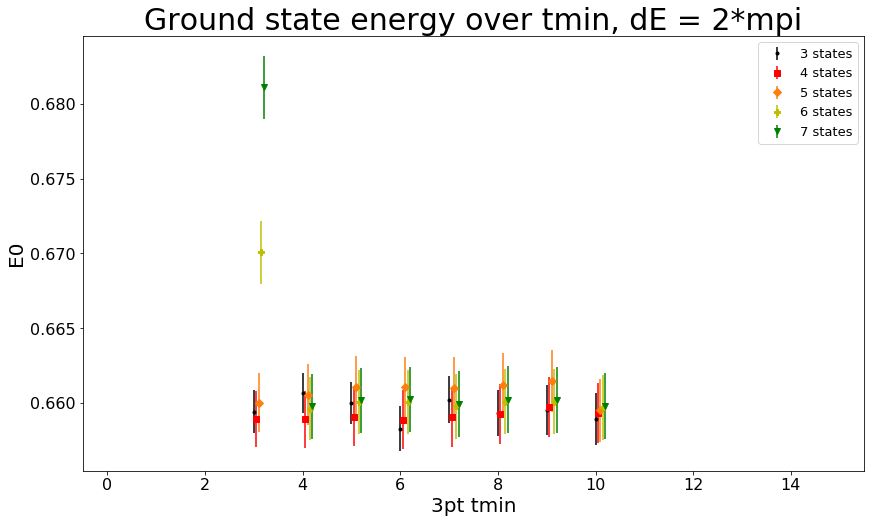

<Figure size 432x288 with 0 Axes>

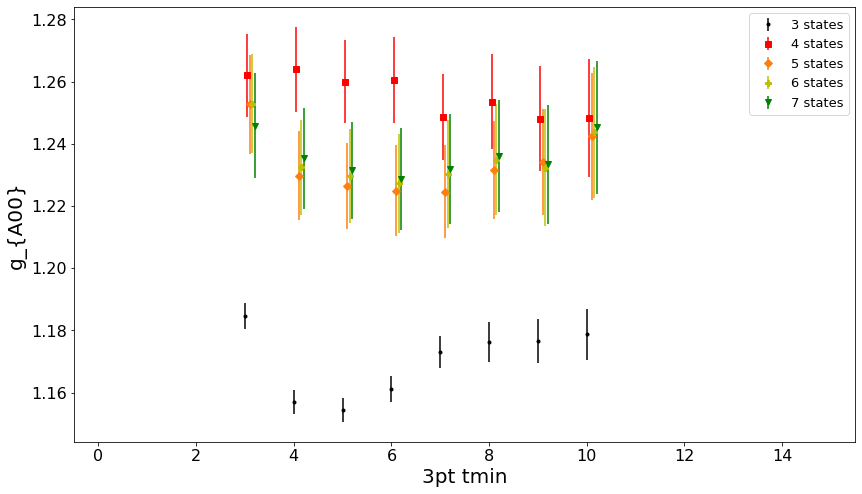

<Figure size 432x288 with 0 Axes>

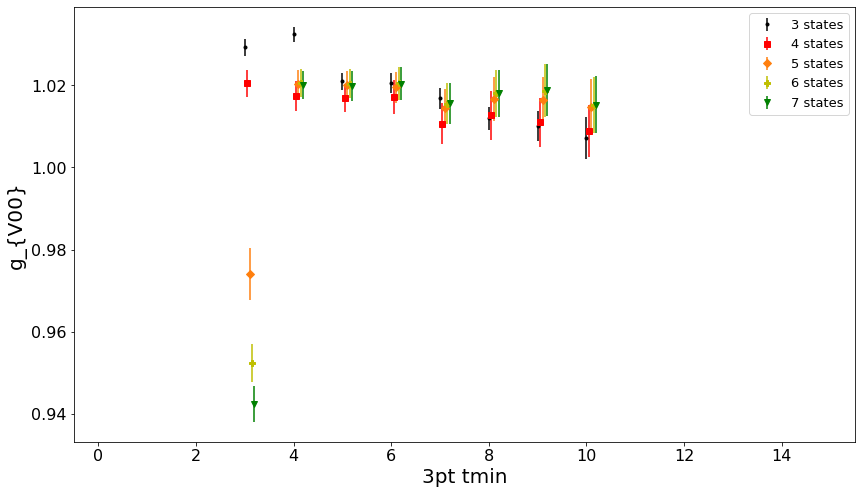

<Figure size 432x288 with 0 Axes>

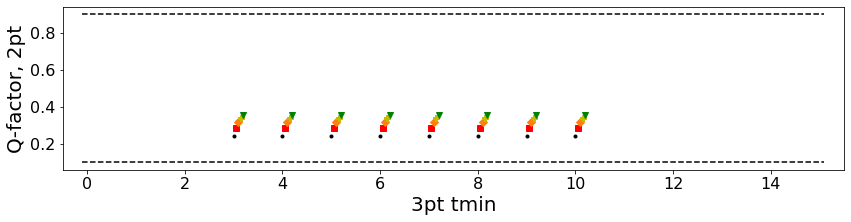

<Figure size 432x288 with 0 Axes>

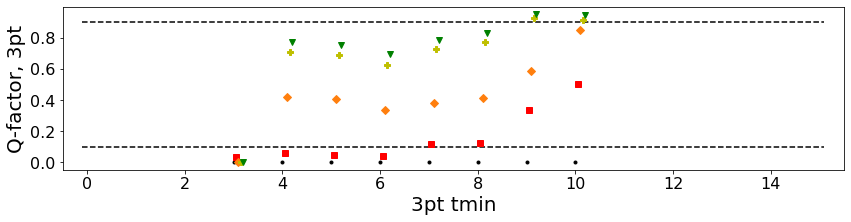

<Figure size 432x288 with 0 Axes>

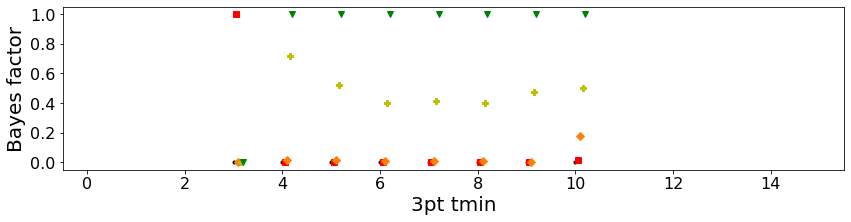

<Figure size 432x288 with 0 Axes>

In [134]:
# First, define colors, markers, and legend labels to be used for each number of states
ax_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
ax_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])
ax_labels = np.array(["3 states", "4 states", "5 states", "6 states", "7 states"])


# Now create an "upper bound" and "lower bound" plot on Q
samp_line = np.linspace(-0.1,15.1,500)
Q_01_line = np.linspace(0.1,0.1,500)
Q_09_line = np.linspace(0.9,0.9,500)

# Next, create the figure
#E0
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

# Now loop over the number of states used in 3-point
for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_E0_a0_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_E0_a0_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.title("Ground state energy over tmin, dE = 2*mpi", fontsize=30)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=13)
plt.show()

plt.clf()

# Next, create the figure
#gA00
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_gA00_a0_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_gA00_a0_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.legend(fontsize=13)
plt.ylabel("g_{A00}", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#gV00
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_gV00_a0_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_gV00_a0_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.legend(fontsize=13)
plt.ylabel("g_{V00}", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#Q-factor
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_Q_2pt_a0_tmin_read[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
   
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
#plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 2pt", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

#Q-factor
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_Q_3pt_a0_tmin_read[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
#plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 3pt", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#Bayes
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [BF_a0_tmin[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
#plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

#Bayes
#plt.figure(figsize = (14,2))
#plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
#plt.xlabel("tau cut, log(dE1) width")

#for j in range(len(numstates_range)):
    #plt.semilogy(ax_ensemble_to_x_map + k*0.03, [BF_a0_graph[i][k] for i in range(len(ax_ensemble_to_x_map))], '.', marker = ax_markers[k], color = ax_colors[k], label = ax_labels[k])

    
#plt.legend(loc = 'upper right')
#plt.ylabel("Bayes factor")
#plt.xticks(fontsize=16)
#plt.yticks(fontsize=16)
#plt.show()

#plt.clf()

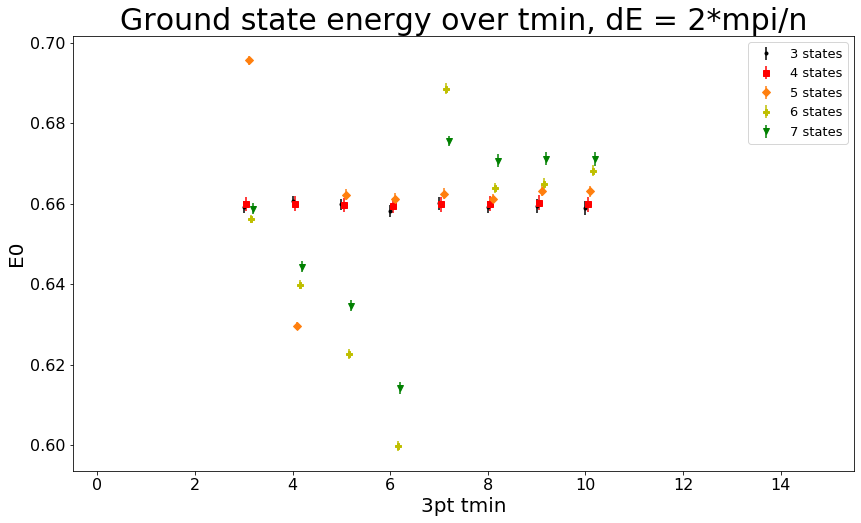

<Figure size 432x288 with 0 Axes>

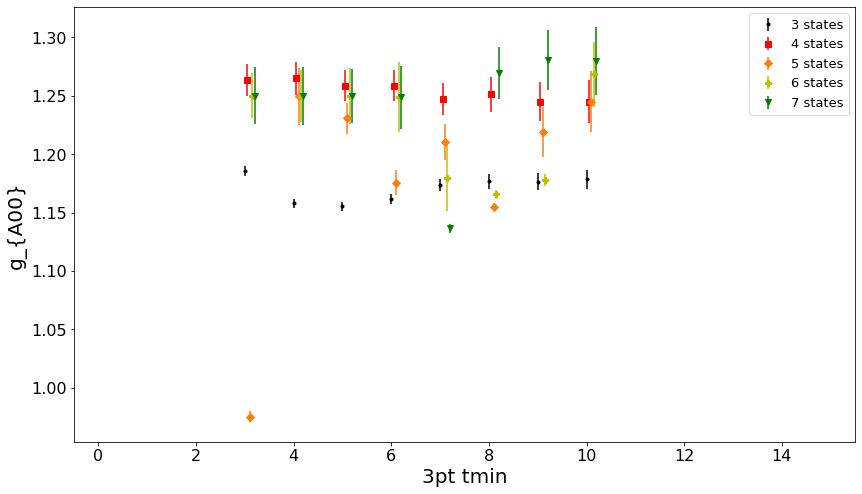

<Figure size 432x288 with 0 Axes>

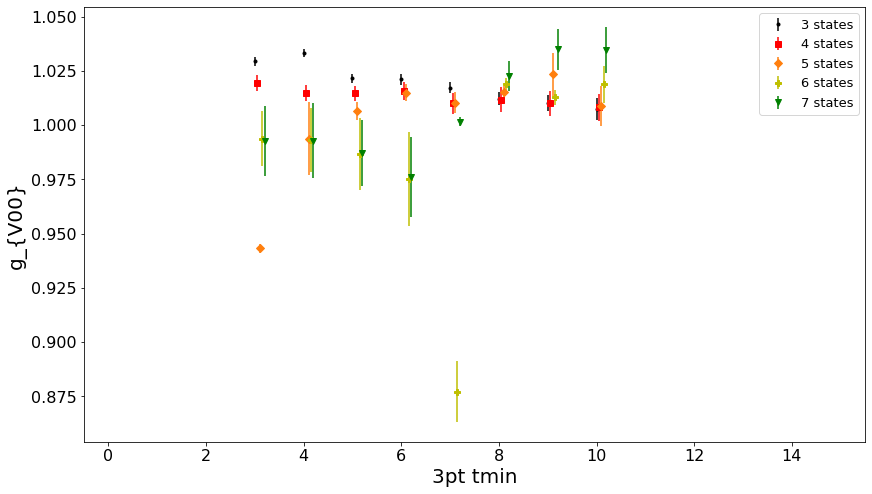

<Figure size 432x288 with 0 Axes>

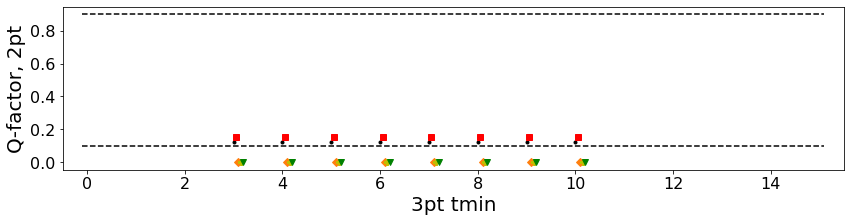

<Figure size 432x288 with 0 Axes>

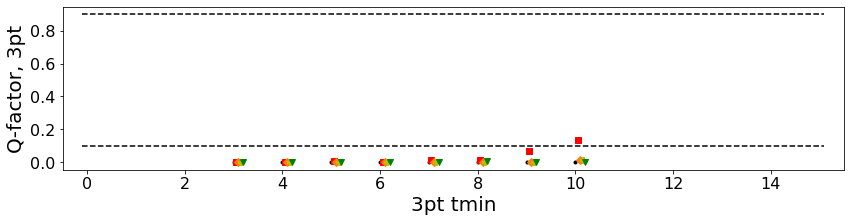

<Figure size 432x288 with 0 Axes>

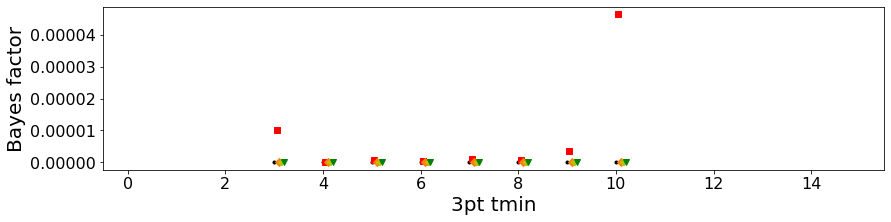

<Figure size 432x288 with 0 Axes>

In [135]:
# Next, create the figure
#E0
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

# Now loop over the number of states used in 3-point
for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_E0_a1_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_E0_a1_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.title("Ground state energy over tmin, dE = 2*mpi/n", fontsize=30)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=13)
plt.show()

plt.clf()

# Next, create the figure
#gA00
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_gA00_a1_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_gA00_a1_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.legend(fontsize=13)
plt.ylabel("g_{A00}", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#gV00
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_gV00_a1_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_gV00_a1_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.legend(fontsize=13)
plt.ylabel("g_{V00}", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#Q-factor
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_Q_2pt_a1_tmin_read[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
   
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
#plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 2pt", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

#Q-factor
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_Q_3pt_a1_tmin_read[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
#plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 3pt", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#Bayes
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [BF_a1_tmin[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
#plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

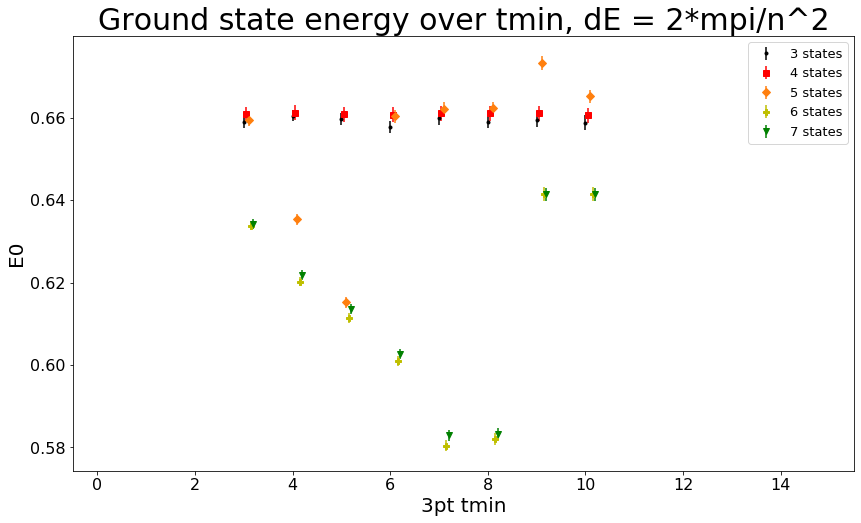

<Figure size 432x288 with 0 Axes>

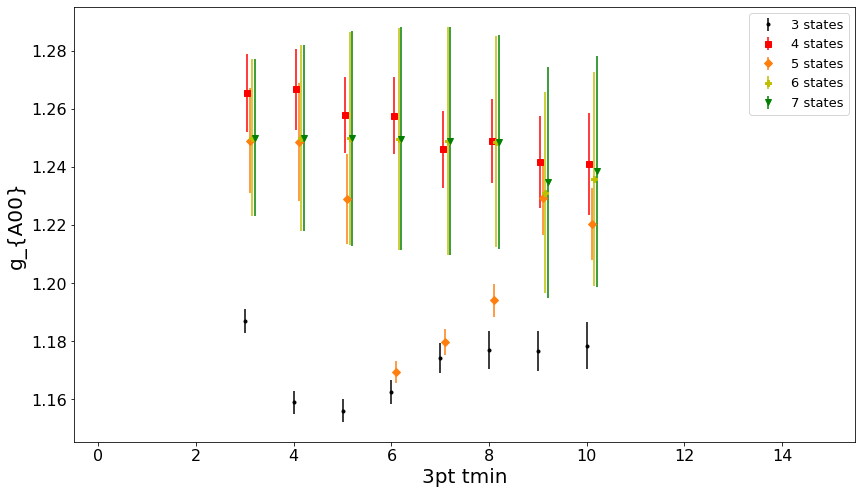

<Figure size 432x288 with 0 Axes>

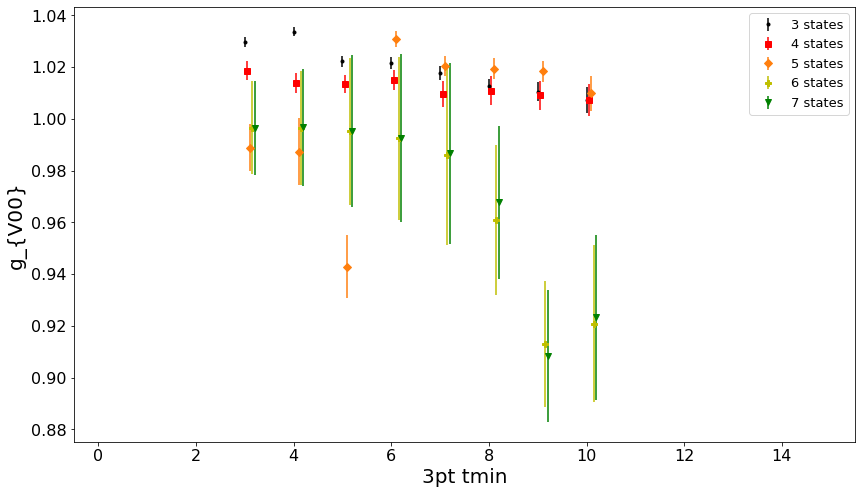

<Figure size 432x288 with 0 Axes>

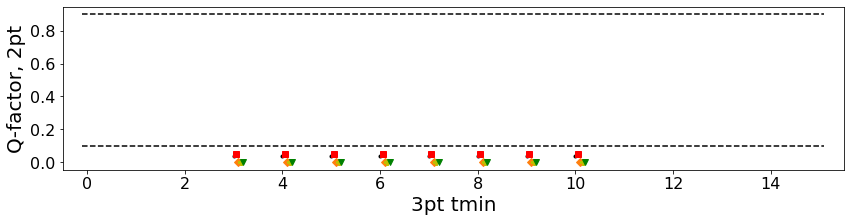

<Figure size 432x288 with 0 Axes>

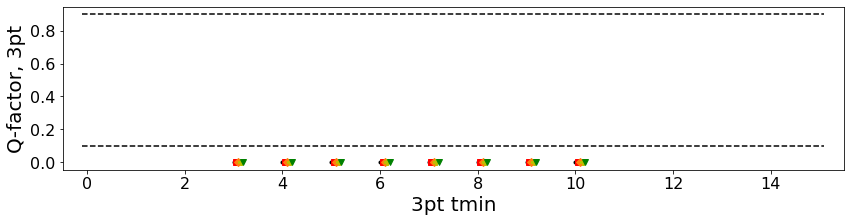

<Figure size 432x288 with 0 Axes>

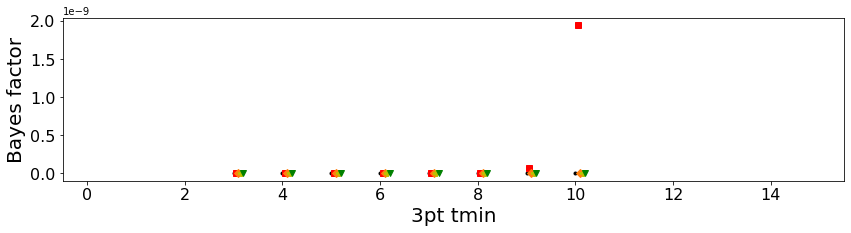

<Figure size 432x288 with 0 Axes>

In [136]:
# Next, create the figure
#E0
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

# Now loop over the number of states used in 3-point
for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_E0_a2_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_E0_a2_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.title("Ground state energy over tmin, dE = 2*mpi/n^2", fontsize=30)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=13)
plt.show()

plt.clf()

# Next, create the figure
#gA00
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_gA00_a2_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_gA00_a2_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.legend(fontsize=13)
plt.ylabel("g_{A00}", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#gV00
plt.figure(figsize = (14,8))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_gV00_a2_tmin_read[i][j].mean for i in range(len(tmin_range))], yerr = [list_gV00_a2_tmin_read[i][j].sdev for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
plt.legend(fontsize=13)
plt.ylabel("g_{V00}", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#Q-factor
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_Q_2pt_a2_tmin_read[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
   
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
#plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 2pt", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

#Q-factor
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [list_Q_3pt_a2_tmin_read[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
plt.plot(samp_line, Q_01_line, "k--")
plt.plot(samp_line, Q_09_line, "k--")
    
#plt.legend(loc = 'upper right')
plt.ylabel("Q-factor, 3pt", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()

# Next, create the figure
#Bayes
plt.figure(figsize = (14,3))
plt.xlim([-0.5, 15.5])
#plt.xticks(ticks = xticlocs, labels=xticklabels)
plt.xlabel("3pt tmin", fontsize=20)

for j in range(len(numstates_range)):
    plt.errorbar(tmin_range + j*0.05, [BF_a2_tmin[i][j] for i in range(len(tmin_range))], fmt='.', marker = ax_markers[j], color = ax_colors[j], label = ax_labels[j])
    
#plt.legend(loc = 'upper right')
plt.ylabel("Bayes factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

plt.clf()